In [1]:
import pandas as pd
import numpy as np
from numpy import mean, std
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split,cross_val_score,LeaveOneOut,GridSearchCV, cross_val_score, cross_val_predict, train_test_split,StratifiedKFold, LeavePOut
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import Normalizer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import math
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.covariance import EmpiricalCovariance
from sklearn.metrics import f1_score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn.datasets import make_circles
from sklearn import preprocessing
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from mpl_toolkits.mplot3d import Axes3D
from sklearn import datasets
from sklearn.cluster import KMeans
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingRegressor
import warnings


warnings.filterwarnings('ignore')

In [2]:
pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 500)

# M8 Verileri için Modeller

In [3]:
data_M8 = pd.read_excel('M verileri.xlsx')
data_M8 = data_M8.iloc[:, :2] # 1. ve 2. kolonları seçelim
data_M8

,M8_X2_iz10_imort,M8_X2_fi
0,0.0000,0.000000e+00
1,0.3125,-4.564402e-02
2,0.6250,-9.128805e-02
3,0.9375,-1.369321e-01
4,1.2500,-1.825761e-01
5,1.5625,-2.282201e-01
6,1.8750,-2.738641e-01
7,2.1875,-3.195082e-01
8,2.5000,-3.651522e-01
9,2.8125,-4.107962e-01


In [4]:
data_M8 = data_M8.loc[:87,:] #87 adet veri var onları alıcaz mecbur
data_M8['M8_X2_iz10_imort'] = data_M8['M8_X2_iz10_imort'] / 10 # koordinat değerlerini / 10 yapmam gerekli
data_M8

,M8_X2_iz10_imort,M8_X2_fi
0,0.00000,0.000000e+00
1,0.03125,-4.564402e-02
2,0.06250,-9.128805e-02
3,0.09375,-1.369321e-01
4,0.12500,-1.825761e-01
5,0.15625,-2.282201e-01
6,0.18750,-2.738641e-01
7,0.21875,-3.195082e-01
8,0.25000,-3.651522e-01
9,0.28125,-4.107962e-01


In [5]:
data_M8.columns[data_M8.isnull().any()]

Index([], dtype='object')

In [6]:
data_M8.isna().any()

M8_X2_iz10_imort    False
M8_X2_fi            False
dtype: bool

In [7]:
data_M8.describe()

,M8_X2_iz10_imort,M8_X2_fi
count,88.000000,8.800000e+01
mean,0.500000,-4.231376e-01
std,0.203198,1.343927e-01
min,0.000000,-5.025226e-01
25%,0.375000,-4.973281e-01
50%,0.500000,-4.832318e-01
75%,0.625000,-4.583031e-01
max,1.000000,6.904846e-09


In [8]:
data_M8.shape

(88, 2)

### veri kontrol edildi, problem yok 

In [9]:
X_M8 = data_M8.iloc[:, :1].values
y_M8 = data_M8.iloc[:,1].values

In [10]:
X_M8.shape, y_M8.shape

((88, 1), (88,))

In [11]:
X_train_M8, X_test_M8, y_train_M8, y_test_M8 = train_test_split(X_M8, y_M8, test_size = 0.25, random_state = 42)

### RandomForestRegressor deneyelim

[[-0.46 -0.46]
 [-0.07  0.  ]
 [-0.49 -0.49]
 [-0.48 -0.48]
 [-0.46 -0.46]
 [-0.48 -0.48]
 [-0.46 -0.46]
 [-0.47 -0.47]
 [-0.16 -0.18]
 [-0.48 -0.48]
 [-0.08 -0.09]
 [-0.49 -0.49]
 [-0.5  -0.5 ]
 [-0.31 -0.32]
 [-0.19 -0.14]
 [-0.49 -0.49]
 [-0.5  -0.5 ]
 [-0.42 -0.37]
 [-0.5  -0.5 ]
 [-0.47 -0.47]
 [-0.46 -0.46]
 [-0.49 -0.49]]
0.9780619006543951
TEST SET
MAE:                 0.0049900923113951395
RMSE:                0.012952903603576088
MAPE:                inf
r2:                  0.9906039278220005


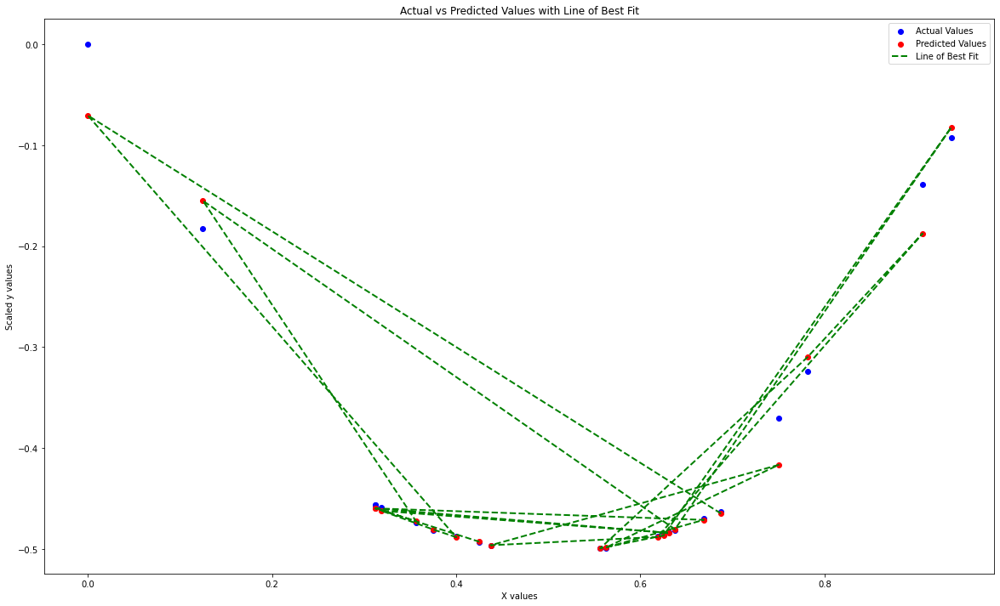

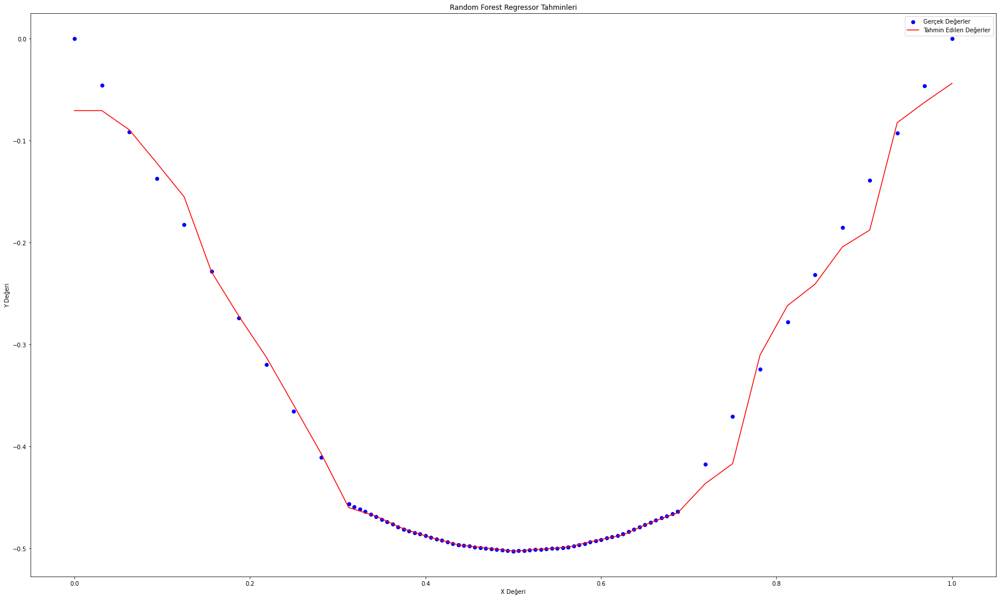

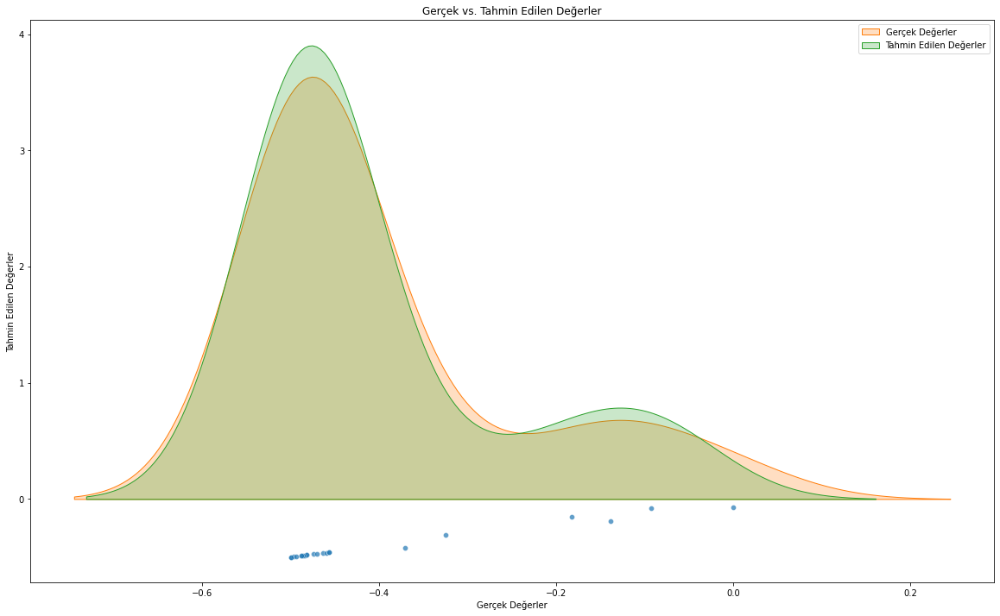

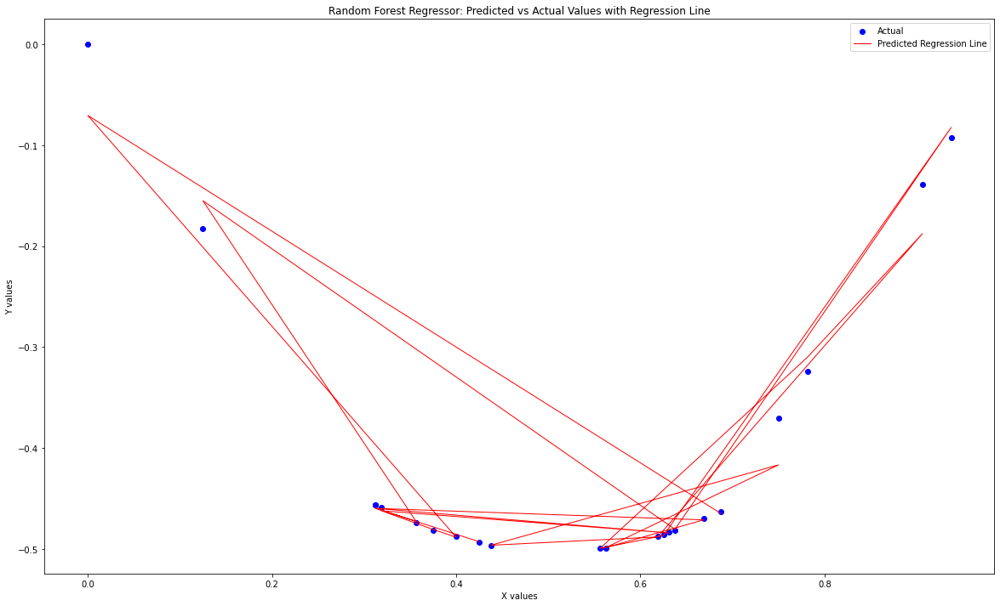

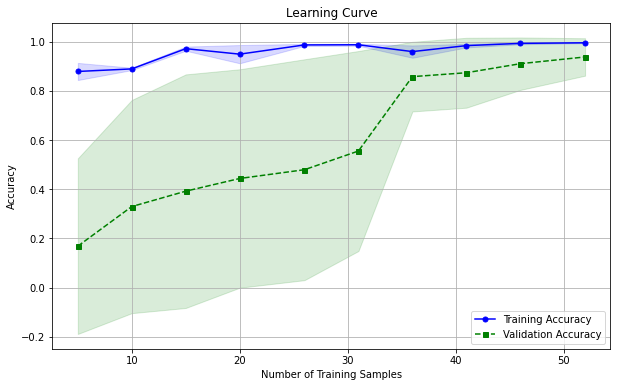

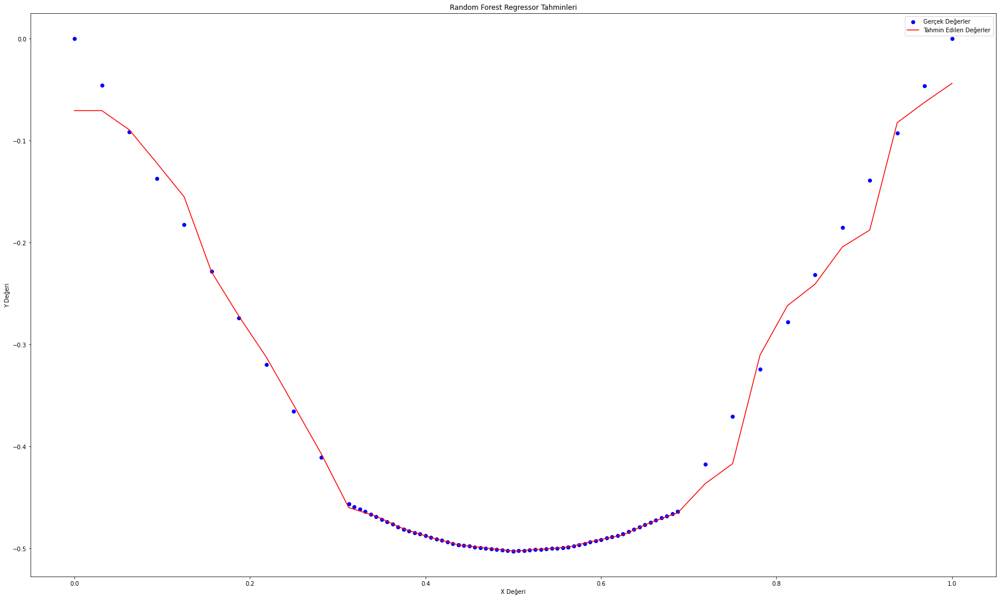

[-0.5]


In [20]:
rf_reg_M8 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_M8.fit(X_train_M8, y_train_M8)

y_pred_M8 = rf_reg_M8.predict(X_test_M8)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M8.reshape(len(y_pred_M8),1), y_test_M8.reshape(len(y_test_M8),1)),1))

print(r2_score(y_test_M8, y_pred_M8))

# Use test and show results of test set
y_hat_M8 = rf_reg_M8.predict(X_M8)
mae = metrics.mean_absolute_error(y_M8,y_hat_M8)
mse = metrics.mean_squared_error(y_M8,y_hat_M8)
mape = np.mean(np.abs((y_M8 - y_hat_M8) / y_M8)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_M8.score(X_M8,y_M8))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_M8, y_test_M8, color='blue', label='Actual Values')
plt.scatter(X_test_M8, y_pred_M8, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_M8, y_pred_M8, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M8 = np.arange(0, 1.03125, 0.03125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M8 = rf_reg_M8.predict(X_values_M8)

# Gerçek değerler için aynı işlemi yap
y_true_values_M8 = rf_reg_M8.predict(X_M8)

plt.figure(figsize=(30, 18))
plt.scatter(X_M8, y_M8, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M8, y_pred_values_M8, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M8 = pd.DataFrame({'Gerçek Değerler': y_test_M8, 'Tahmin Edilen Değerler': y_pred_M8})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M8, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M8 = pd.DataFrame({'Predicted': y_pred_M8, 'Actual': y_test_M8})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M8, y_test_M8, color='blue', label='Actual')
plt.plot(X_test_M8, y_pred_M8, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_M8, X=X_train_M8, y=y_train_M8, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M8 = np.arange(0, 1.03125, 0.03125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M8 = rf_reg_M8.predict(X_values_M8)

# Gerçek değerler için aynı işlemi yap
y_true_values_M8 = rf_reg_M8.predict(X_M8)

plt.figure(figsize=(30, 18))
plt.scatter(X_M8, y_M8, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M8, y_pred_values_M8, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_M8.predict([[0.43125]])) #0.43125  == -4.950989e-01 gerçek değerde

### XGBRegressor ile deneyelim

[[-0.46 -0.46]
 [-0.05  0.  ]
 [-0.49 -0.49]
 [-0.48 -0.48]
 [-0.46 -0.46]
 [-0.48 -0.48]
 [-0.46 -0.46]
 [-0.48 -0.47]
 [-0.23 -0.18]
 [-0.48 -0.48]
 [-0.05 -0.09]
 [-0.48 -0.49]
 [-0.5  -0.5 ]
 [-0.28 -0.32]
 [-0.18 -0.14]
 [-0.48 -0.49]
 [-0.5  -0.5 ]
 [-0.42 -0.37]
 [-0.5  -0.5 ]
 [-0.47 -0.47]
 [-0.46 -0.46]
 [-0.49 -0.49]]
0.9735795254628781
TEST SET
MAE:                 0.004669257717486483
RMSE:                0.012109109832985245
MAPE:                inf
r2:                  0.9917882349701982


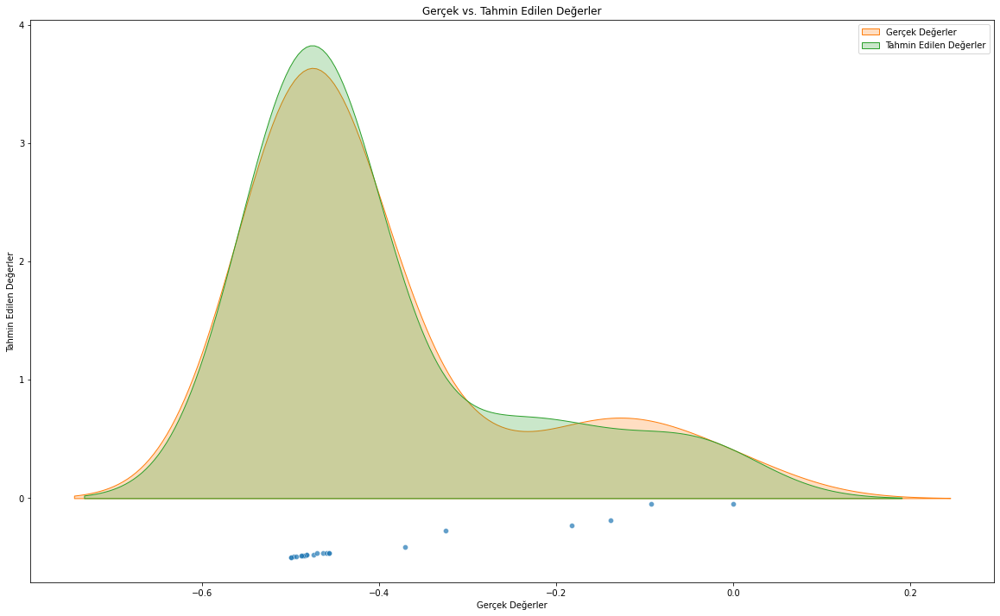

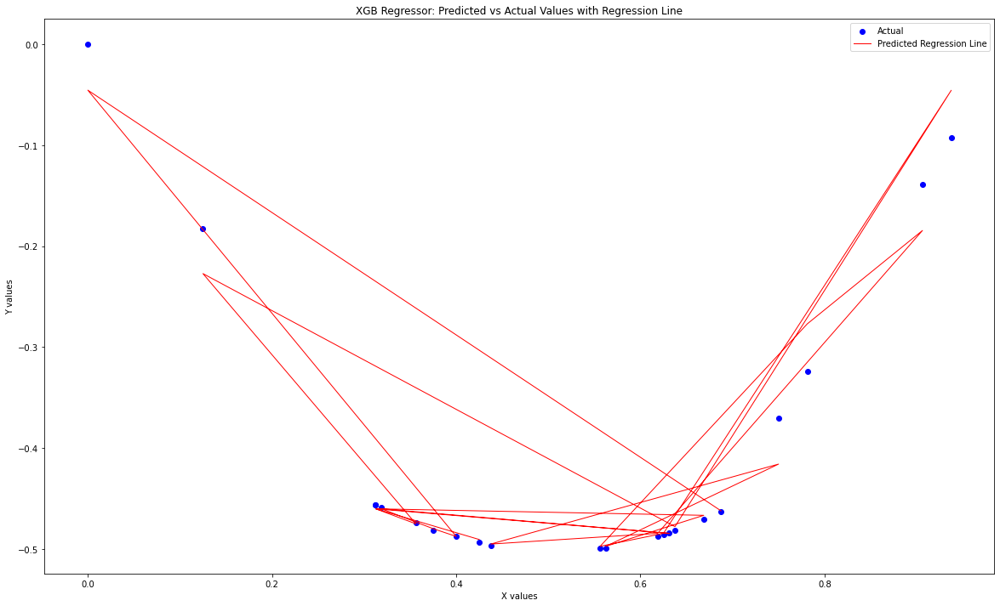

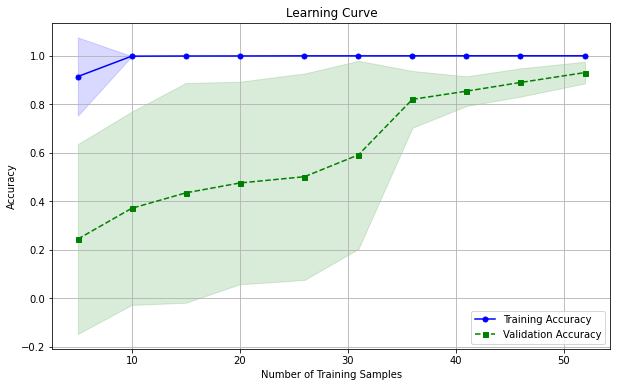

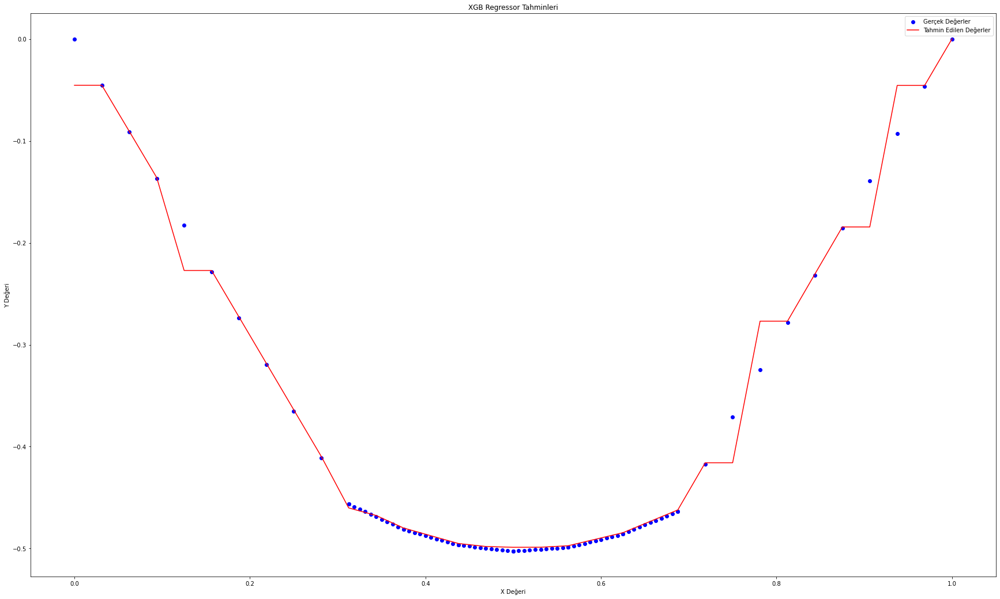

[-0.49]


In [22]:
from xgboost import XGBRegressor


xgb_M8 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_M8.fit(X_train_M8, y_train_M8)

y_pred_M8 = xgb_M8.predict(X_test_M8)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M8.reshape(len(y_pred_M8),1), y_test_M8.reshape(len(y_test_M8),1)),1))


print(r2_score(y_test_M8, y_pred_M8))

# Use test and show results of test set
y_hat_M8 = xgb_M8.predict(X_M8)
mae = metrics.mean_absolute_error(y_M8,y_hat_M8)
mse = metrics.mean_squared_error(y_M8,y_hat_M8)
mape = np.mean(np.abs((y_M8 - y_hat_M8) / y_M8)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_M8.score(X_M8,y_M8))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M8 = pd.DataFrame({'Gerçek Değerler': y_test_M8, 'Tahmin Edilen Değerler': y_pred_M8})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M8, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M8 = pd.DataFrame({'Predicted': y_pred_M8, 'Actual': y_test_M8})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M8, y_test_M8, color='blue', label='Actual')
plt.plot(X_test_M8, y_pred_M8, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_M8, X=X_train_M8, y=y_train_M8, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M8 = np.arange(0, 1.03125, 0.03125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M8 = xgb_M8.predict(X_values_M8)

# Gerçek değerler için aynı işlemi yap
y_true_values_M8 = xgb_M8.predict(X_M8)

plt.figure(figsize=(30, 18))
plt.scatter(X_M8, y_M8, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M8, y_pred_values_M8, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_M8.predict([[0.43125]])) #0.43125  == -4.950989e-01 gerçek değerde

### GradientBoostingRegressor deneyelim

[[-0.46 -0.46]
 [-0.05  0.  ]
 [-0.49 -0.49]
 [-0.48 -0.48]
 [-0.46 -0.46]
 [-0.49 -0.48]
 [-0.46 -0.46]
 [-0.47 -0.47]
 [-0.14 -0.18]
 [-0.48 -0.48]
 [-0.05 -0.09]
 [-0.49 -0.49]
 [-0.5  -0.5 ]
 [-0.28 -0.32]
 [-0.19 -0.14]
 [-0.49 -0.49]
 [-0.5  -0.5 ]
 [-0.42 -0.37]
 [-0.5  -0.5 ]
 [-0.47 -0.47]
 [-0.46 -0.46]
 [-0.49 -0.49]]
0.973205150984104
TEST SET
MAE:                 0.0036711996059725794
RMSE:                0.012111764649735814
MAPE:                inf
r2:                  0.991784633859718


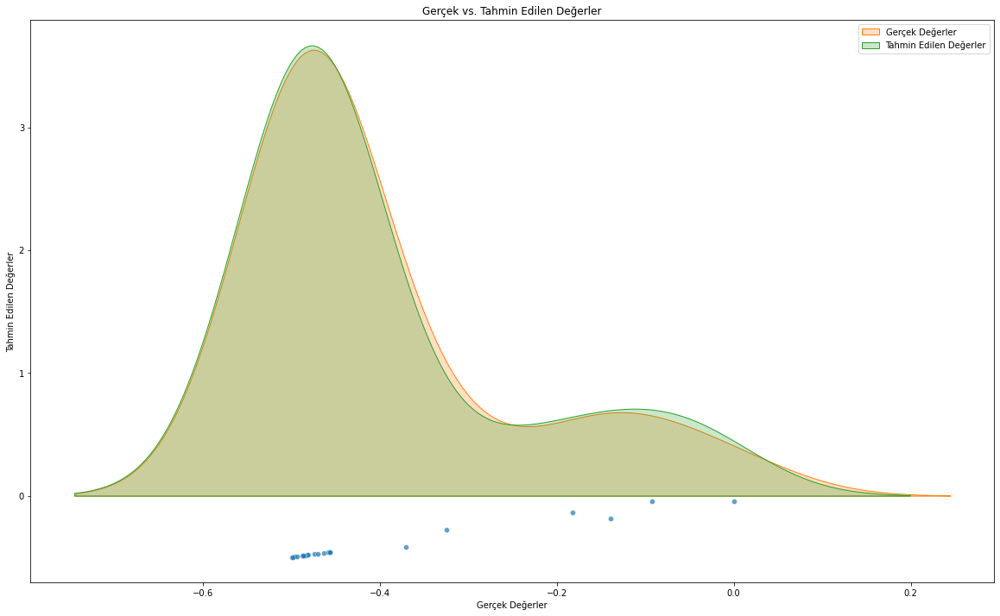

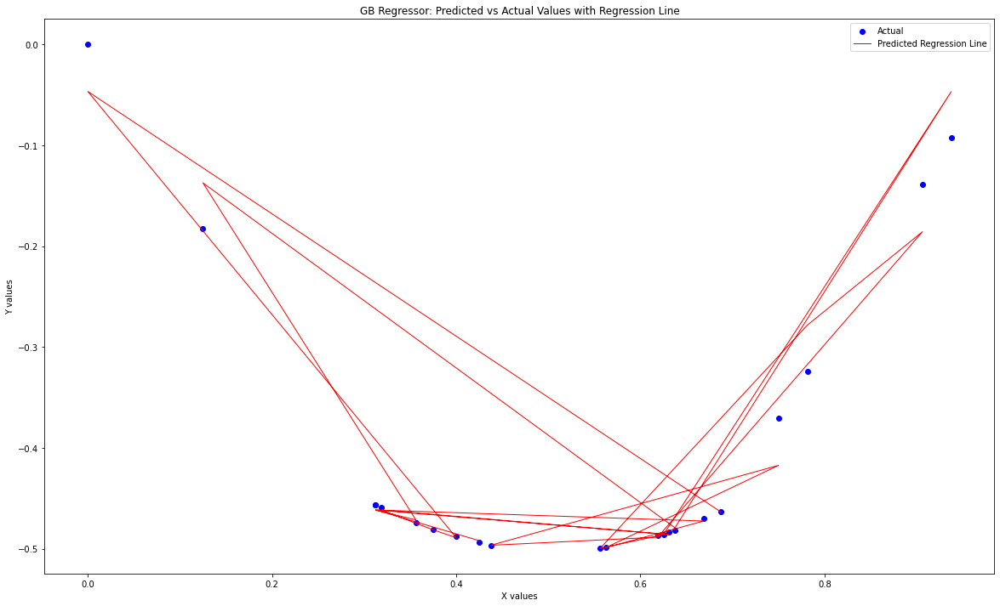

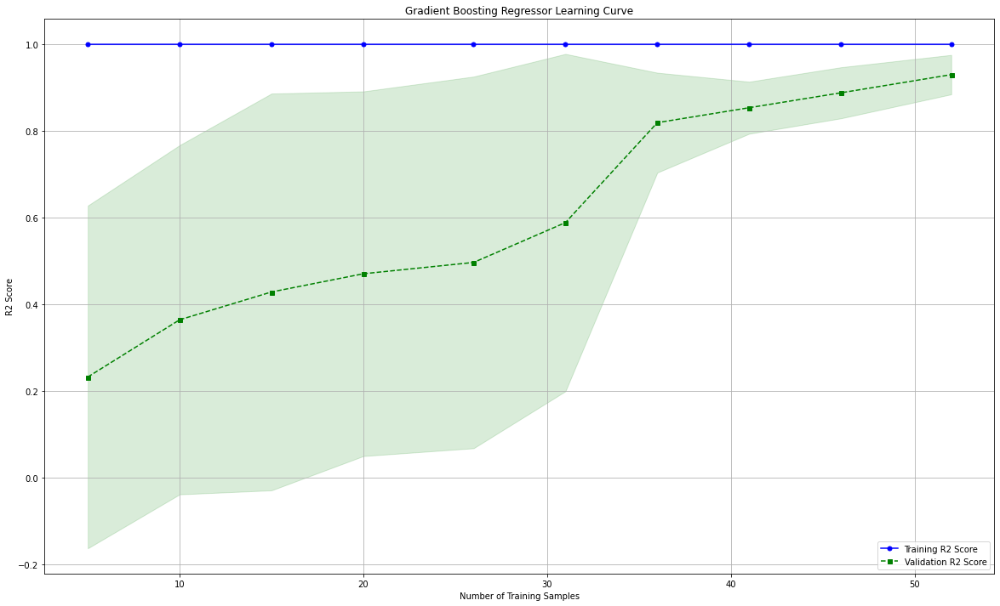

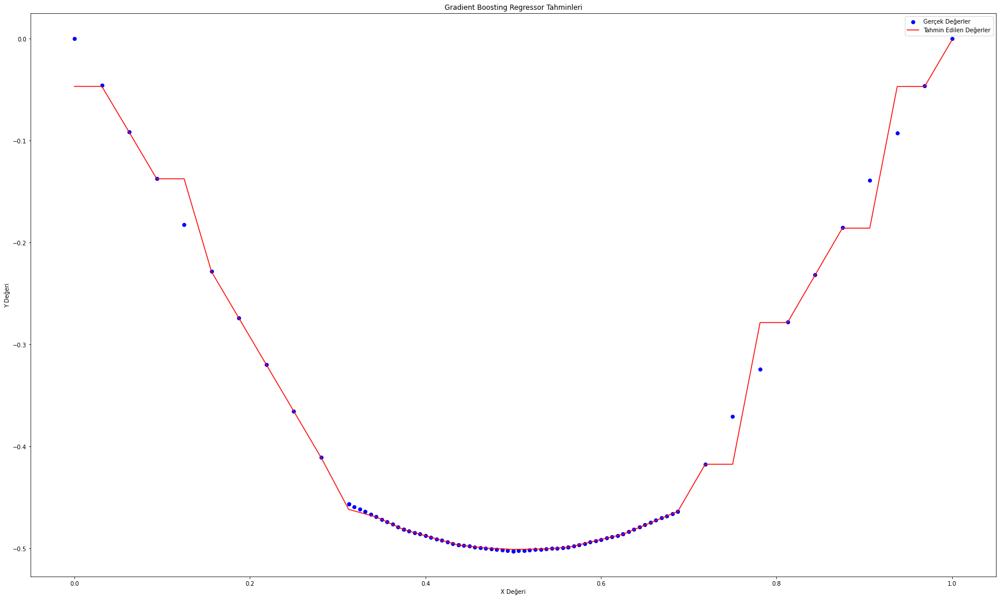

[-0.5]


In [23]:
gb_reg_M8 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_M8.fit(X_train_M8, y_train_M8)

y_pred_M8 = gb_reg_M8.predict(X_test_M8)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M8.reshape(len(y_pred_M8),1), y_test_M8.reshape(len(y_test_M8),1)),1))


print(r2_score(y_test_M8, y_pred_M8))

# Use test and show results of test set
y_hat_M8 = gb_reg_M8.predict(X_M8)
mae = metrics.mean_absolute_error(y_M8,y_hat_M8)
mse = metrics.mean_squared_error(y_M8,y_hat_M8)
mape = np.mean(np.abs((y_M8 - y_hat_M8) / y_M8)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_M8.score(X_M8,y_M8))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M8 = pd.DataFrame({'Gerçek Değerler': y_test_M8, 'Tahmin Edilen Değerler': y_pred_M8})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M8, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M8 = pd.DataFrame({'Predicted': y_pred_M8, 'Actual': y_test_M8})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M8, y_test_M8, color='blue', label='Actual')
plt.plot(X_test_M8, y_pred_M8, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_M8, X=X_train_M8, y=y_train_M8, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()


# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M8 = np.arange(0, 1.03125, 0.03125).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M8 = gb_reg_M8.predict(X_values_M8)

# Gerçek değerler için aynı işlemi yap
y_true_values_M8 = gb_reg_M8.predict(X_M8)

plt.figure(figsize=(30, 18))
plt.scatter(X_M8, y_M8, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M8, y_pred_values_M8, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_M8.predict([[0.43125]])) #0.43125  == -4.950989e-01 gerçek değerde

### SupportVectorRegressor deneyelim

[[-0.41 -0.46]
 [-0.09  0.  ]
 [-0.45 -0.49]
 [-0.44 -0.48]
 [-0.41 -0.46]
 [-0.44 -0.48]
 [-0.4  -0.46]
 [-0.43 -0.47]
 [-0.17 -0.18]
 [-0.44 -0.48]
 [-0.09 -0.09]
 [-0.44 -0.49]
 [-0.45 -0.5 ]
 [-0.31 -0.32]
 [-0.12 -0.14]
 [-0.44 -0.49]
 [-0.45 -0.5 ]
 [-0.35 -0.37]
 [-0.45 -0.5 ]
 [-0.42 -0.47]
 [-0.4  -0.46]
 [-0.45 -0.49]]
0.906077079993221
TEST SET
MAE:                 0.041613571581950975
RMSE:                0.043658121588900554
MAPE:                inf
r2:                  0.8932563204177285


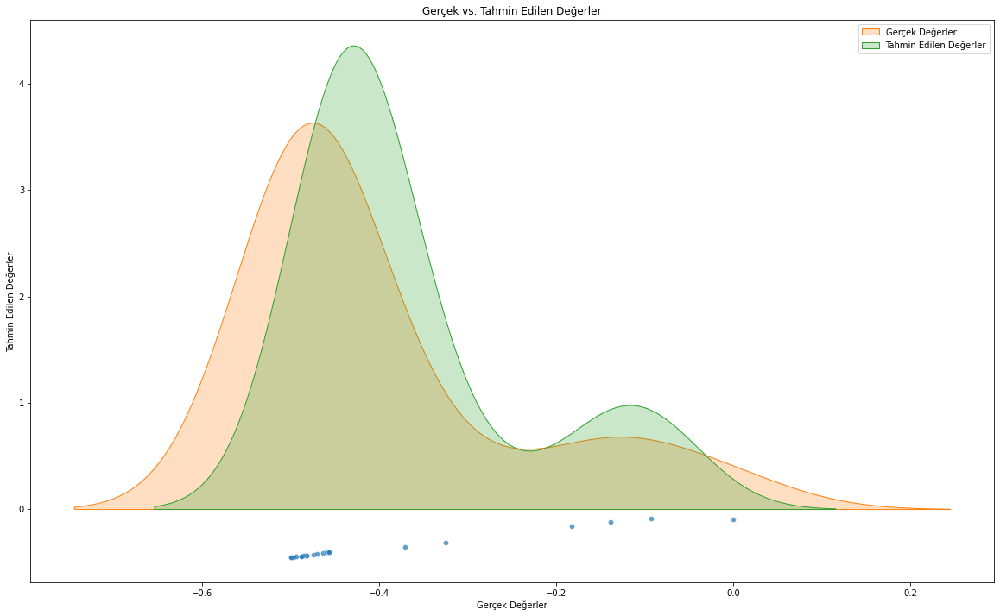

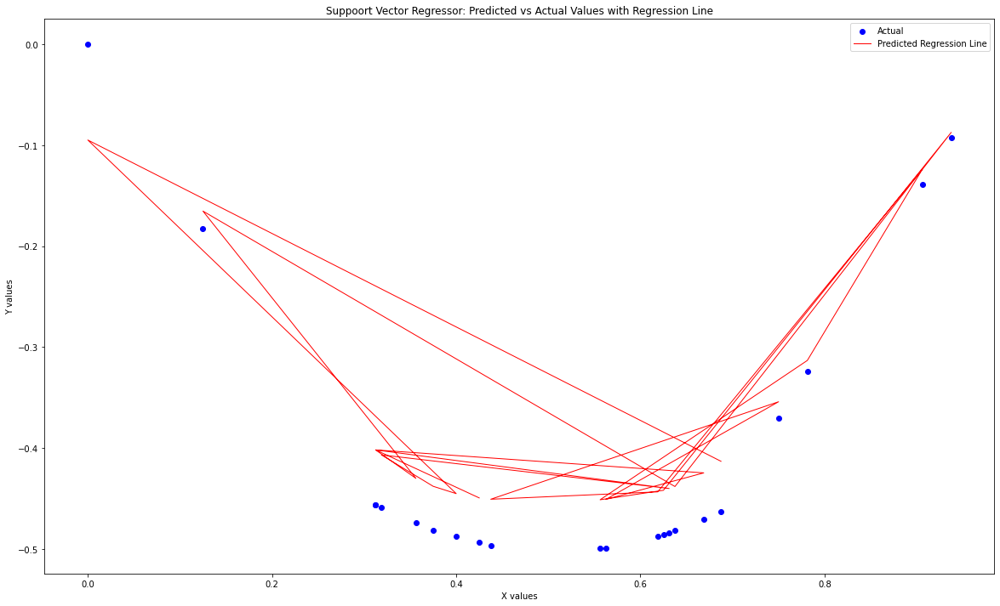

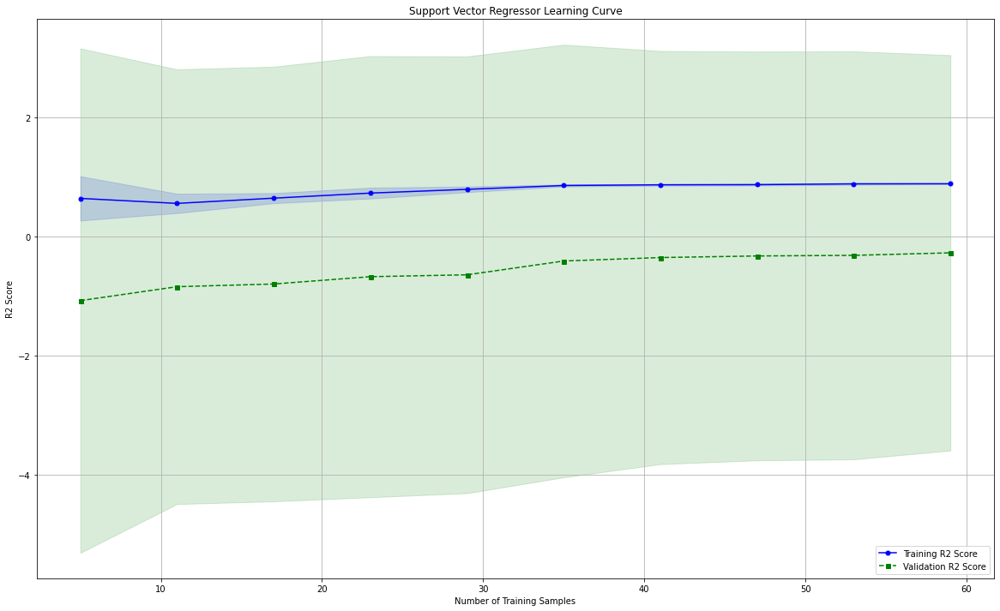

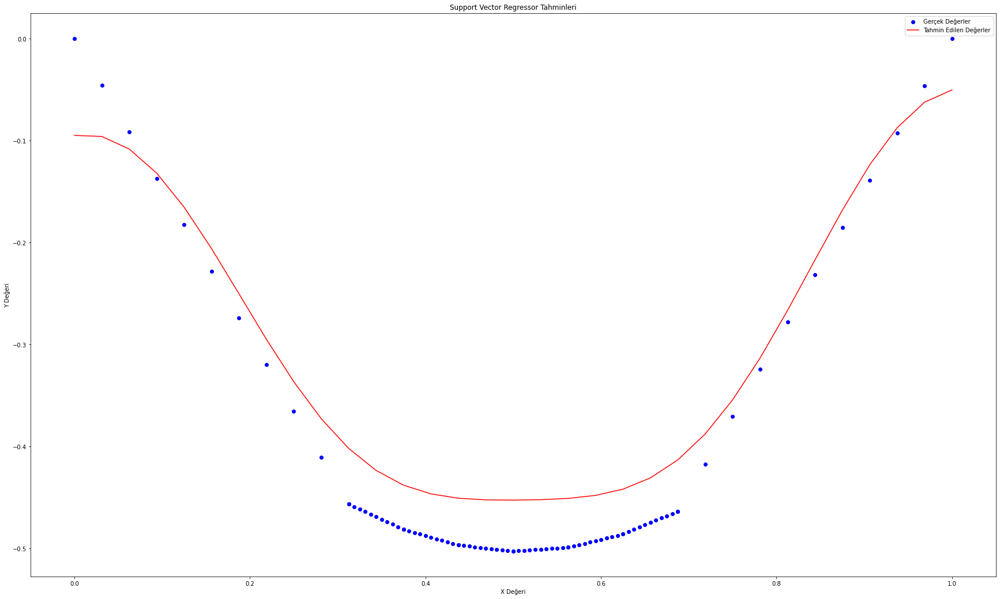

[-0.45]


In [24]:
svr_reg_M8 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_M8.fit(X_train_M8, y_train_M8)

y_pred_M8 = svr_reg_M8.predict(X_test_M8)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M8.reshape(len(y_pred_M8),1), y_test_M8.reshape(len(y_test_M8),1)),1))


print(r2_score(y_test_M8, y_pred_M8))


# Use test and show results of test set
y_hat_M8 = svr_reg_M8.predict(X_M8)
mae = metrics.mean_absolute_error(y_M8,y_hat_M8)
mse = metrics.mean_squared_error(y_M8,y_hat_M8)
mape = np.mean(np.abs((y_M8 - y_hat_M8) / y_M8)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_M8.score(X_M8,y_M8))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M8 = pd.DataFrame({'Gerçek Değerler': y_test_M8, 'Tahmin Edilen Değerler': y_pred_M8})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M8, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M8 = pd.DataFrame({'Predicted': y_pred_M8, 'Actual': y_test_M8})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M8, y_test_M8, color='blue', label='Actual')
plt.plot(X_test_M8, y_pred_M8, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_M8, X=X_train_M8, y=y_train_M8, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M8 = np.arange(0, 1.03125, 0.03125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M8 = svr_reg_M8.predict(X_values_M8)

# Gerçek değerler için aynı işlemi yap
y_true_values_M8 = svr_reg_M8.predict(X_M8)

plt.figure(figsize=(30, 18))
plt.scatter(X_M8, y_M8, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M8, y_pred_values_M8, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_M8.predict([[0.43125]]))  #0.43125  == -4.950989e-01 gerçek değerde

### PolynomialRegressor ile deneyelim

R2 Score (Polynomial Regression):  0.9953867479008649
MAE (Polynomial Regression):  0.007804480842610143
RMSE (Polynomial Regression):  0.010045449420236087
MAPE (Polynomial Regression):  inf


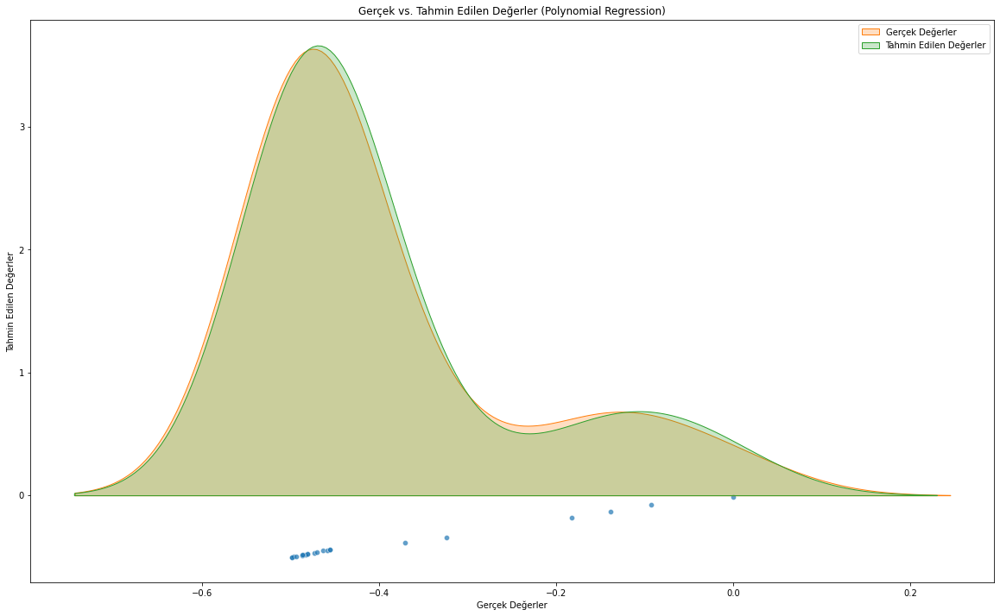

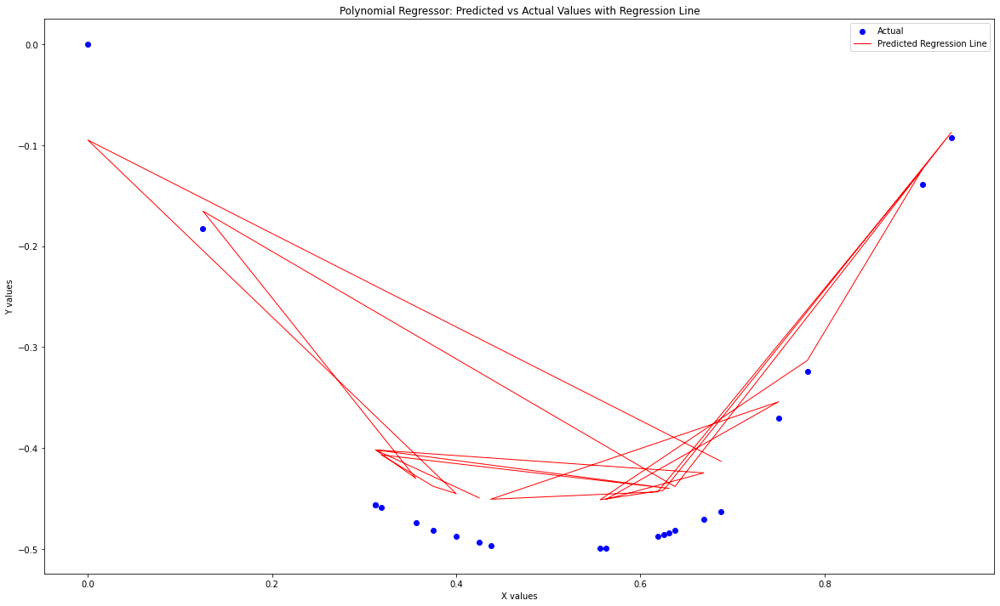

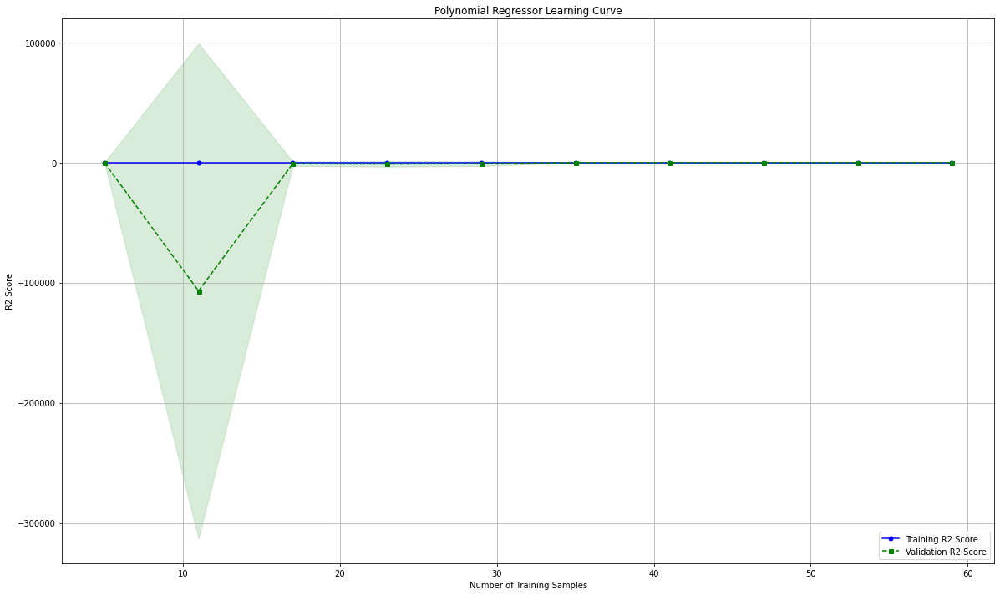

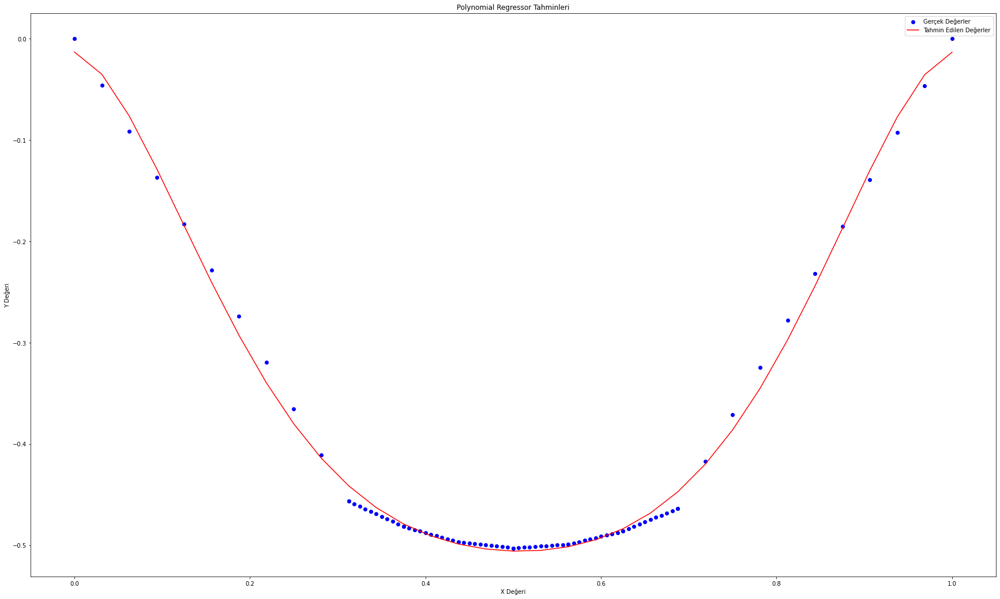

[-0.5]


In [26]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_M8 = PolynomialFeatures(degree=7)
X_poly_M8 = poly_M8.fit_transform(X_M8)

# Lineer Regresyon modeli oluşturma
poly_reg_M8 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_M8.fit(X_M8, y_M8)

# Tahminler yapma
y_pred_poly_M8 = poly_reg_M8.predict(X_test_M8)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_M8, y_pred_poly_M8))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_M8, y_pred_poly_M8))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_M8, y_pred_poly_M8)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_M8 - y_pred_poly_M8) / y_test_M8)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_M8 = pd.DataFrame({'Gerçek Değerler': y_test_M8, 'Tahmin Edilen Değerler': y_pred_poly_M8})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_M8, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M8['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M8['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_M8 = pd.DataFrame({'Predicted': y_pred_M8, 'Actual': y_test_M8})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M8, y_test_M8, color='blue', label='Actual')
plt.plot(X_test_M8, y_pred_M8, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_M8, X=X_train_M8, y=y_train_M8, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()


# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M8 = np.arange(0, 1.03125, 0.03125).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M8 = poly_reg_M8.predict(X_values_M8)

# Gerçek değerler için aynı işlemi yap
y_true_values_M8 = poly_reg_M8.predict(X_M8)

plt.figure(figsize=(30, 18))
plt.scatter(X_M8, y_M8, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M8, y_pred_values_M8, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_M8.predict([[0.43125]])) #0.43125  == -4.950989e-01 gerçek değerde

### Multi-Layer Perceptron

In [28]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_M8, y_train_M8,epochs=100, batch_size=32, validation_split=0.25)

y_pred = mlp.predict(X_test)

Epoch 1/100


2/2 [==============================] - 1s 189ms/step - loss: 0.2069 - mae: 0.4388 - val_loss: 0.1856 - val_mae: 0.4058
Epoch 2/100
2/2 [==============================] - 0s 29ms/step - loss: 0.2051 - mae: 0.4368 - val_loss: 0.1839 - val_mae: 0.4037
Epoch 3/100
2/2 [==============================] - 0s 26ms/step - loss: 0.2033 - mae: 0.4349 - val_loss: 0.1823 - val_mae: 0.4017
Epoch 4/100
2/2 [==============================] - 0s 28ms/step - loss: 0.2016 - mae: 0.4329 - val_loss: 0.1806 - val_mae: 0.3996
Epoch 5/100
2/2 [==============================] - 0s 27ms/step - loss: 0.1998 - mae: 0.4309 - val_loss: 0.1789 - val_mae: 0.3975
Epoch 6/100
2/2 [==============================] - 0s 29ms/step - loss: 0.1980 - mae: 0.4289 - val_loss: 0.1773 - val_mae: 0.3954
Epoch 7/100
2/2 [==============================] - 0s 41ms/step - loss: 0.1962 - mae: 0.4269 - val_loss: 0.1756 - val_mae: 0.3933
Epoch 8/100
2/2 [==============================] - 0s 33ms/step - loss: 0.1944 - mae: 0

Epoch 60/100
2/2 [==============================] - 0s 27ms/step - loss: 0.0789 - mae: 0.2694 - val_loss: 0.0677 - val_mae: 0.2444
Epoch 61/100
2/2 [==============================] - 0s 35ms/step - loss: 0.0757 - mae: 0.2642 - val_loss: 0.0648 - val_mae: 0.2391
Epoch 62/100
2/2 [==============================] - 0s 34ms/step - loss: 0.0724 - mae: 0.2585 - val_loss: 0.0619 - val_mae: 0.2335
Epoch 63/100
2/2 [==============================] - 0s 32ms/step - loss: 0.0691 - mae: 0.2528 - val_loss: 0.0589 - val_mae: 0.2277
Epoch 64/100
2/2 [==============================] - 0s 30ms/step - loss: 0.0657 - mae: 0.2466 - val_loss: 0.0559 - val_mae: 0.2218
Epoch 65/100
2/2 [==============================] - 0s 29ms/step - loss: 0.0623 - mae: 0.2401 - val_loss: 0.0530 - val_mae: 0.2160
Epoch 66/100
2/2 [==============================] - 0s 26ms/step - loss: 0.0589 - mae: 0.2337 - val_loss: 0.0501 - val_mae: 0.2105
Epoch 67/100
2/2 [==============================] - 0s 28ms/step - loss: 0.0556 - m

NameError: name 'X_test' is not defined

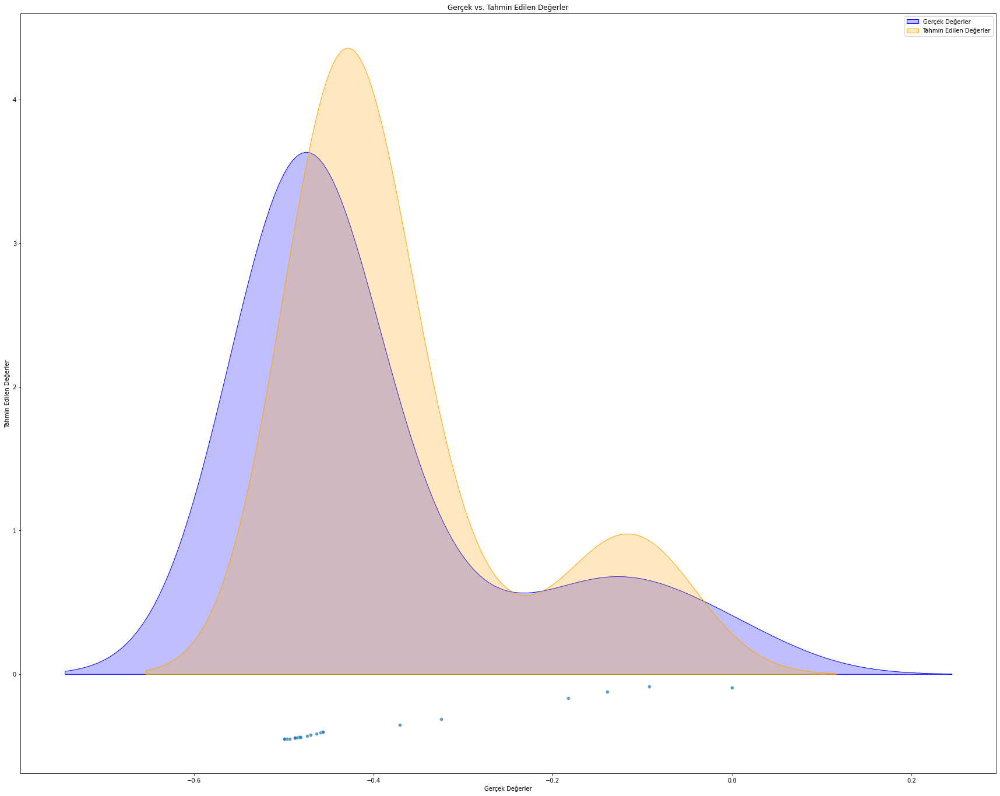

In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_M8 = pd.DataFrame({'Gerçek Değerler': y_test_M8.flatten(), 'Tahmin Edilen Değerler': y_pred_M8.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M8, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M8['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
2/2 [==============================] - 0s 60ms/step - loss: 0.0175 - mae: 0.0851 - val_loss: 0.0097 - val_mae: 0.0640
Epoch 2/50
2/2 [==============================] - 0s 26ms/step - loss: 0.0175 - mae: 0.0862 - val_loss: 0.0096 - val_mae: 0.0654
Epoch 3/50
2/2 [==============================] - 0s 29ms/step - loss: 0.0174 - mae: 0.0872 - val_loss: 0.0096 - val_mae: 0.0667
Epoch 4/50
2/2 [==============================] - 0s 27ms/step - loss: 0.0174 - mae: 0.0882 - val_loss: 0.0096 - val_mae: 0.0678
Epoch 5/50
2/2 [==============================] - 0s 26ms/step - loss: 0.0174 - mae: 0.0891 - val_loss: 0.0096 - val_mae: 0.0689
Epoch 6/50
2/2 [==============================] - 0s 28ms/step - loss: 0.0173 - mae: 0.0899 - val_loss: 0.0096 - val_mae: 0.0699
Epoch 7/50
2/2 [==============================] - 0s 26ms/step - loss: 0.0173 - mae: 0.0907 - val_loss: 0.0095 - val_mae: 0.0708
Epoch 8/50
2/2 [==============================] - 0s 26ms/step - loss: 0.0173 - mae: 0.0914 - val

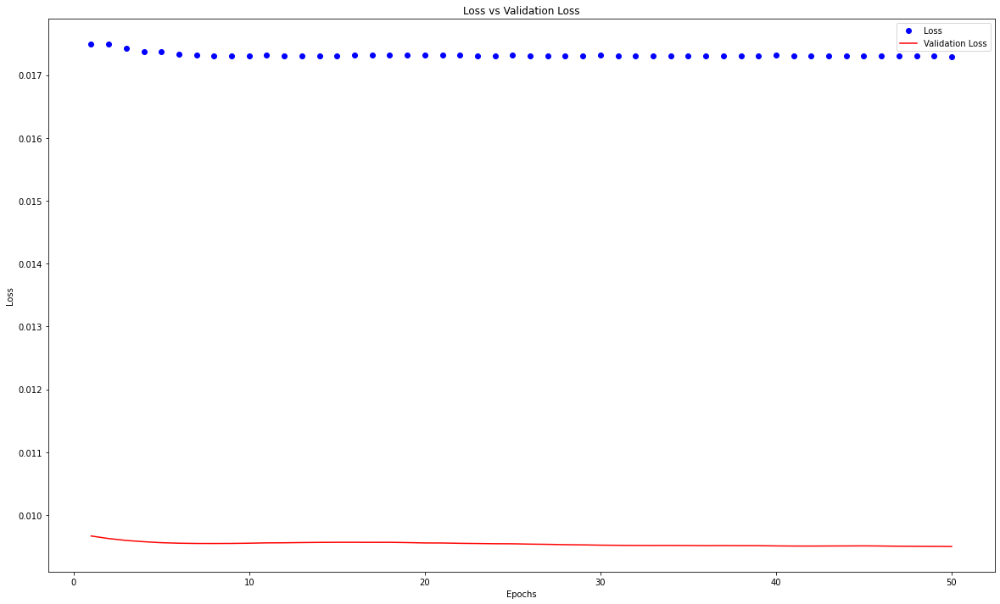

In [30]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_M8, y_train_M8, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması

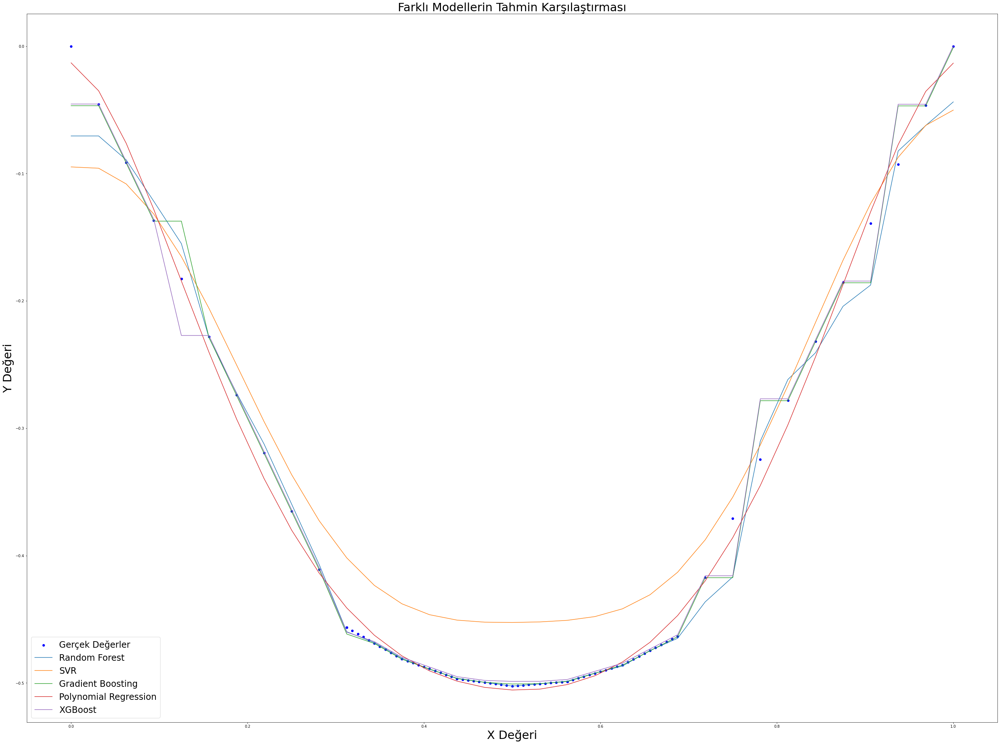

In [31]:
y_pred_rf_M8 = rf_reg_M8.predict(X_values_M8)
y_pred_svr_M8 = svr_reg_M8.predict(X_values_M8)  
y_pred_gb_M8 = gb_reg_M8.predict(X_values_M8)
y_pred_poly_M8 = poly_reg_M8.predict(X_values_M8)
y_pred_xgb_M8 = xgb_M8.predict(X_values_M8)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_M8, y_M8, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_M8, y_pred_rf_M8, label='Random Forest')
plt.plot(X_values_M8, y_pred_svr_M8, label='SVR')
plt.plot(X_values_M8, y_pred_gb_M8, label='Gradient Boosting')
plt.plot(X_values_M8, y_pred_poly_M8, label='Polynomial Regression')
plt.plot(X_values_M8, y_pred_xgb_M8, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

# M10 Verisi için Modeller

In [32]:
data_M10 = pd.read_excel('M verileri.xlsx')
data_M10 = data_M10.iloc[:, 2:4] # 3. ve 4. kolonları seçelim
data_M10

,M10_X2_iz10_imort,M10_X2_fi
0,0.00000,0.000000e+00
1,0.15625,0.000000e+00
2,0.31250,0.000000e+00
3,0.46875,0.000000e+00
4,0.62500,0.000000e+00
5,0.78125,0.000000e+00
6,0.93750,0.000000e+00
7,1.09375,0.000000e+00
8,1.25000,0.000000e+00
9,1.40625,0.000000e+00


In [33]:
data_M10 = data_M10.loc[:109,:] # ilk 110 satırı seçelim
data_M10['M10_X2_iz10_imort'] = data_M10['M10_X2_iz10_imort'] / 10 # koordinat değerlerini / 10 yapmam gerekli
data_M10

,M10_X2_iz10_imort,M10_X2_fi
0,0.000000,0.000000e+00
1,0.015625,0.000000e+00
2,0.031250,0.000000e+00
3,0.046875,0.000000e+00
4,0.062500,0.000000e+00
5,0.078125,0.000000e+00
6,0.093750,0.000000e+00
7,0.109375,0.000000e+00
8,0.125000,0.000000e+00
9,0.140625,0.000000e+00


In [34]:
data_M10

,M10_X2_iz10_imort,M10_X2_fi
0,0.000000,0.000000e+00
1,0.015625,0.000000e+00
2,0.031250,0.000000e+00
3,0.046875,0.000000e+00
4,0.062500,0.000000e+00
5,0.078125,0.000000e+00
6,0.093750,0.000000e+00
7,0.109375,0.000000e+00
8,0.125000,0.000000e+00
9,0.140625,0.000000e+00


In [35]:
data_M10.columns[data_M10.isnull().any()]

Index([], dtype='object')

In [36]:
data_M10.isna().any()

M10_X2_iz10_imort    False
M10_X2_fi            False
dtype: bool

In [37]:
data_M10.describe()

,M10_X2_iz10_imort,M10_X2_fi
count,110.000000,1.100000e+02
mean,0.500000,-3.434976e-01
std,0.241420,2.112208e-01
min,0.000000,-5.099671e-01
25%,0.345312,-5.019945e-01
50%,0.500000,-4.787901e-01
75%,0.654687,-1.052528e-01
max,1.000000,7.005076e-09


In [38]:
data_M10.shape

(110, 2)

In [39]:
X_M10 = data_M10.iloc[:, :1].values
y_M10 = data_M10.iloc[:,1].values

In [40]:
X_M10.shape, y_M10.shape

((110, 1), (110,))

In [41]:
X_train_M10, X_test_M10, y_train_M10, y_test_M10 = train_test_split(X_M10, y_M10, test_size = 0.25, random_state = 42)

In [43]:
X_train_M10.shape, X_test_M10.shape, y_train_M10.shape, y_test_M10.shape

((82, 1), (28, 1), (82,), (28,))

### RandomForestRegressor deneyelim

[[-4.93e-01 -4.91e-01]
 [-1.02e-02  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.78e-01 -4.77e-01]
 [-5.07e-01 -5.07e-01]
 [-5.04e-01 -5.04e-01]
 [-4.81e-01 -4.83e-01]
 [-5.04e-01 -5.05e-01]
 [-1.20e-01 -9.40e-02]
 [-1.02e-02  0.00e+00]
 [-4.92e-01 -4.88e-01]
 [-4.83e-01 -4.86e-01]
 [ 0.00e+00  0.00e+00]
 [-4.82e-01 -4.84e-01]
 [-3.01e-01 -3.24e-01]
 [-5.02e-01 -5.01e-01]
 [-5.10e-01 -5.10e-01]
 [-4.98e-01 -4.98e-01]
 [ 5.99e-10  0.00e+00]
 [-5.04e-01 -5.02e-01]
 [-6.54e-02 -4.63e-02]
 [-4.92e-01 -4.93e-01]
 [-5.06e-01 -5.06e-01]
 [-4.75e-01 -4.73e-01]
 [-4.63e-01 -4.63e-01]
 [-4.88e-01 -4.86e-01]
 [-5.06e-01 -5.06e-01]
 [-4.94e-01 -4.93e-01]]
0.9984041689076749
TEST SET
MAE:                 0.0026486966112026504
RMSE:                0.005864788863179839
MAPE:                nan
r2:                  0.9992219679392953


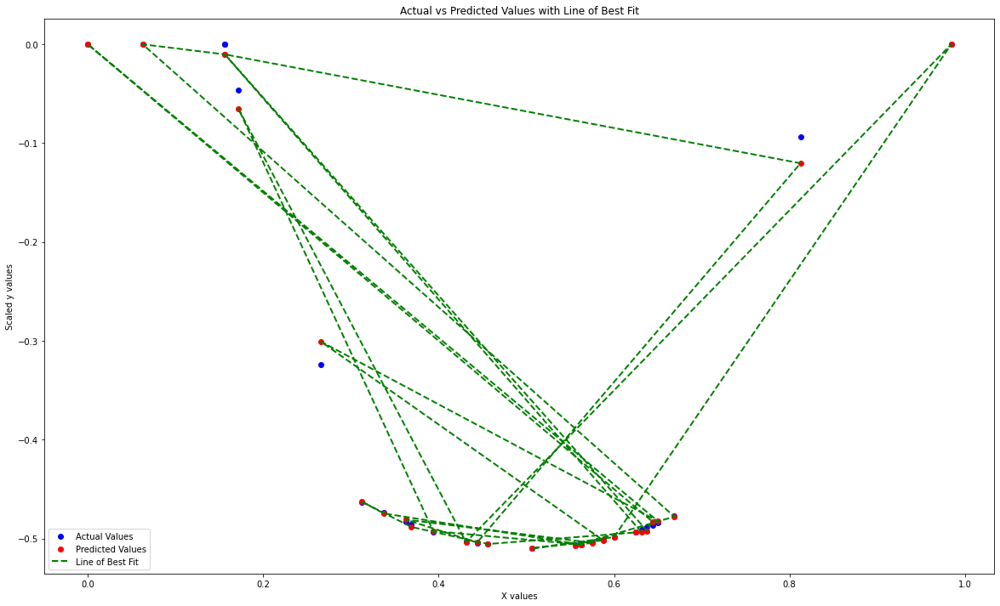

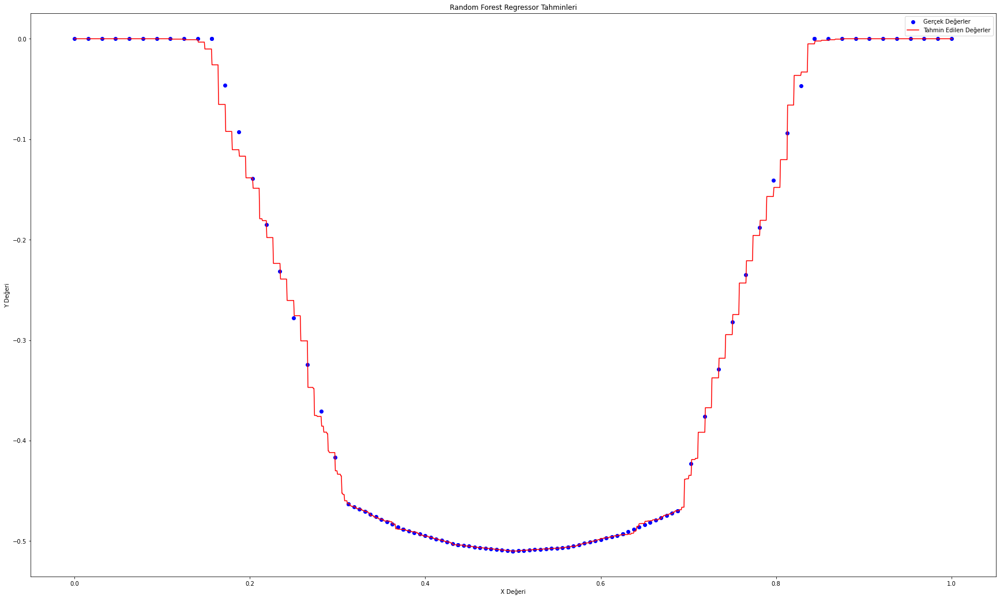

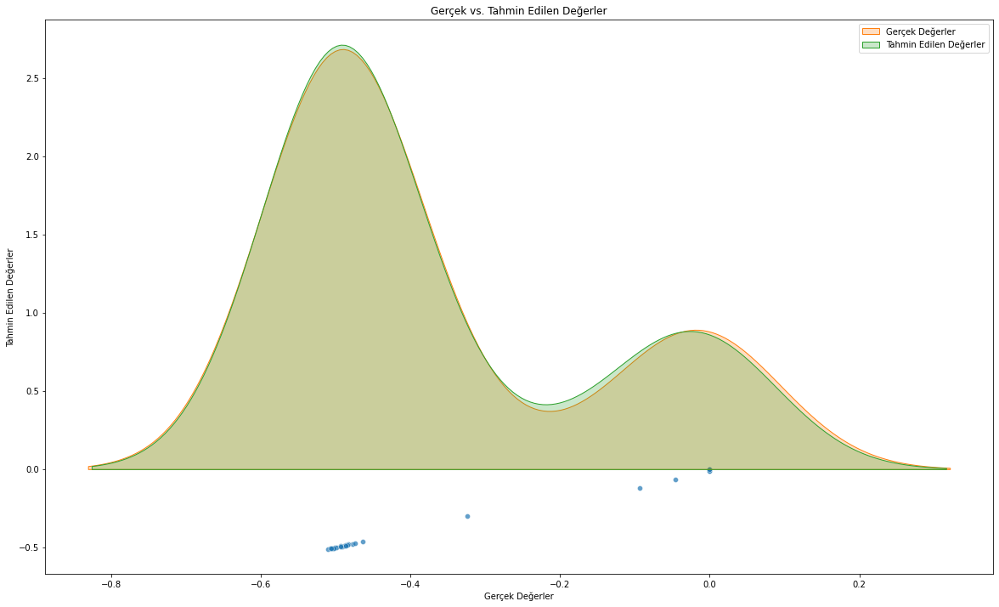

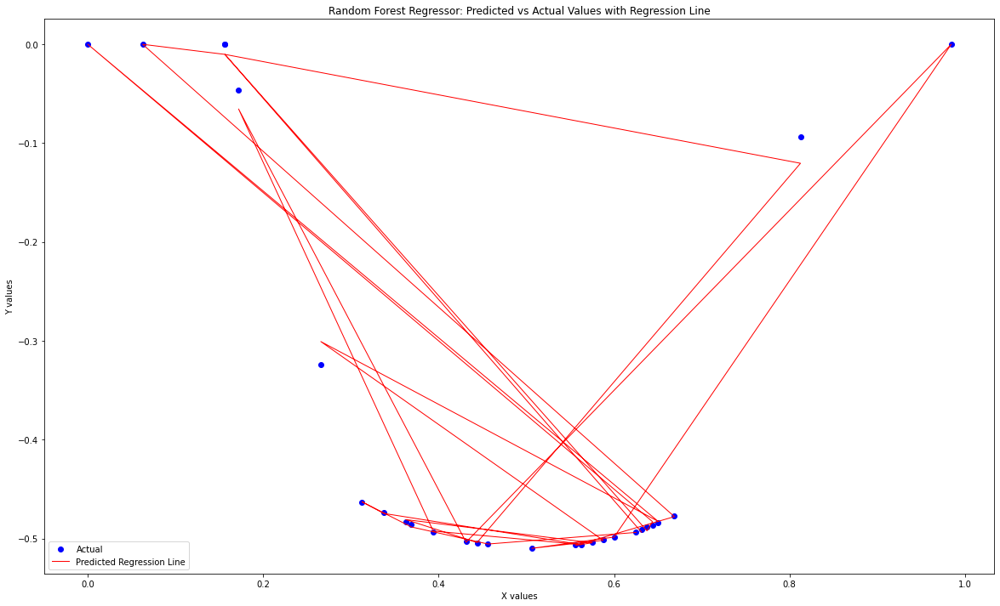

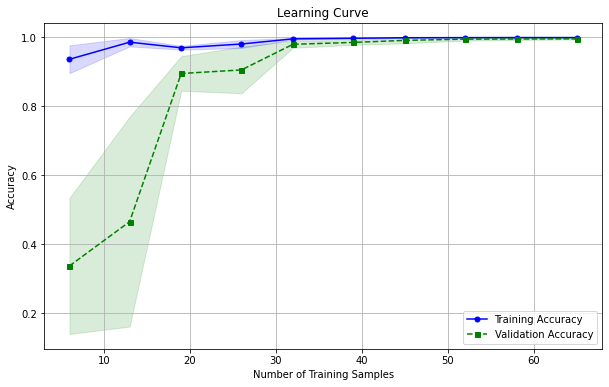

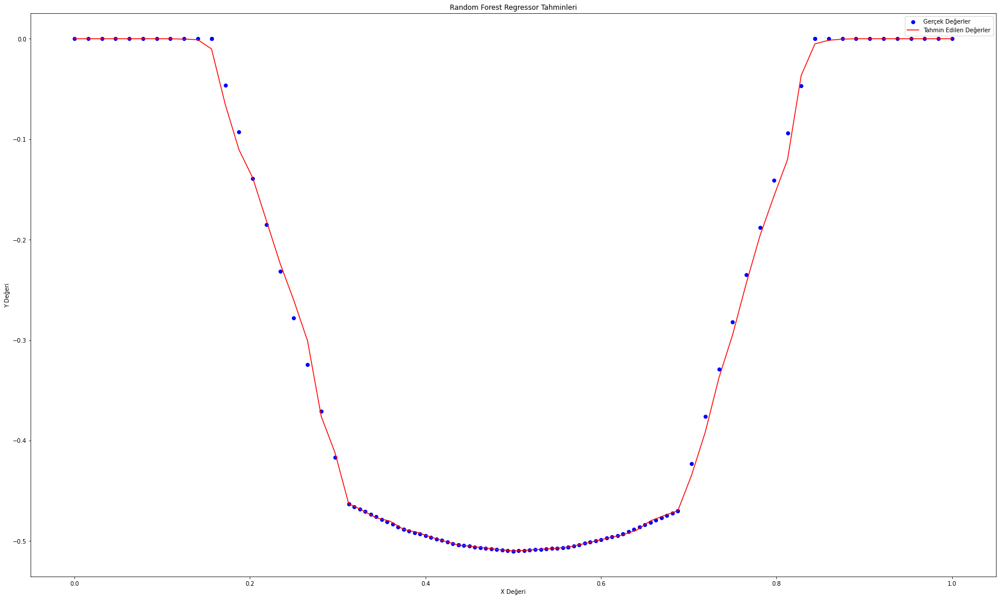

[-0.5]


In [45]:
rf_reg_M10 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_M10.fit(X_train_M10, y_train_M10)

y_pred_M10 = rf_reg_M10.predict(X_test_M10)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M10.reshape(len(y_pred_M10),1), y_test_M10.reshape(len(y_test_M10),1)),1))

print(r2_score(y_test_M10, y_pred_M10))

# Use test and show results of test set
y_hat_M10 = rf_reg_M10.predict(X_M10)
mae = metrics.mean_absolute_error(y_M10,y_hat_M10)
mse = metrics.mean_squared_error(y_M10,y_hat_M10)
mape = np.mean(np.abs((y_M10 - y_hat_M10) / y_M10)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_M10.score(X_M10,y_M10))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_M10, y_test_M10, color='blue', label='Actual Values')
plt.scatter(X_test_M10, y_pred_M10, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_M10, y_pred_M10, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M10 = np.arange(0, 1.000625, 0.000625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M10 = rf_reg_M10.predict(X_values_M10)

# Gerçek değerler için aynı işlemi yap
y_true_values_M10 = rf_reg_M10.predict(X_M10)

plt.figure(figsize=(30, 18))
plt.scatter(X_M10, y_M10, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M10, y_pred_values_M10, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M10 = pd.DataFrame({'Gerçek Değerler': y_test_M10, 'Tahmin Edilen Değerler': y_pred_M10})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M10, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M10 = pd.DataFrame({'Predicted': y_pred_M10, 'Actual': y_test_M10})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M10, y_test_M10, color='blue', label='Actual')
plt.plot(X_test_M10, y_pred_M10, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_M10, X=X_train_M10, y=y_train_M10, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M10 = np.arange(0, 1.015625, 0.015625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M10 = rf_reg_M10.predict(X_values_M10)

# Gerçek değerler için aynı işlemi yap
y_true_values_M10 = rf_reg_M10.predict(X_M10)

plt.figure(figsize=(30, 18))
plt.scatter(X_M10, y_M10, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M10, y_pred_values_M10, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_M10.predict([[0.43125]])) #0.43125 ==    -5.024393e-01 gerçek değerde

### XGBRegressor ile deneyelim

[[-0.49 -0.49]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.47 -0.48]
 [-0.5  -0.51]
 [-0.5  -0.5 ]
 [-0.48 -0.48]
 [-0.5  -0.5 ]
 [-0.05 -0.09]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [-0.48 -0.49]
 [ 0.    0.  ]
 [-0.48 -0.48]
 [-0.37 -0.32]
 [-0.5  -0.5 ]
 [-0.51 -0.51]
 [-0.5  -0.5 ]
 [ 0.    0.  ]
 [-0.5  -0.5 ]
 [-0.09 -0.05]
 [-0.49 -0.49]
 [-0.5  -0.51]
 [-0.47 -0.47]
 [-0.46 -0.46]
 [-0.49 -0.49]
 [-0.5  -0.51]
 [-0.49 -0.49]]
0.99441432898385
TEST SET
MAE:                 0.0027613901387345562
RMSE:                0.007835181991229456
MAPE:                inf
r2:                  0.9986113560484746


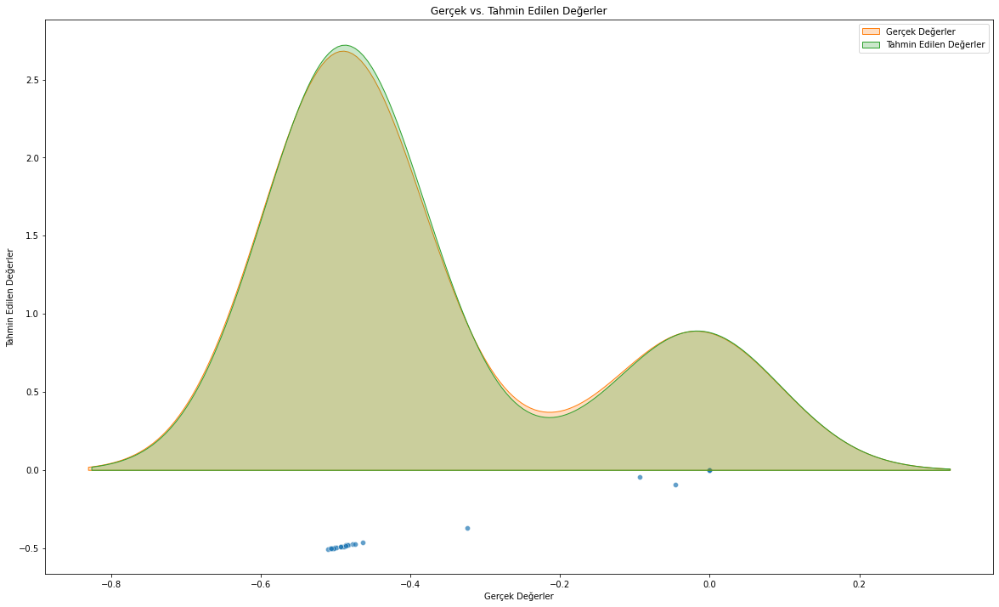

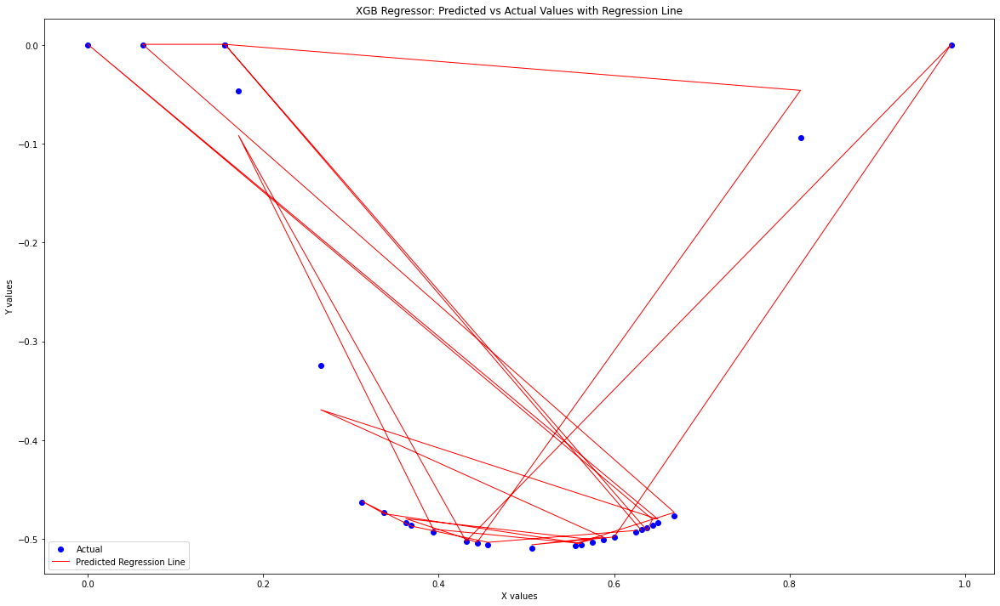

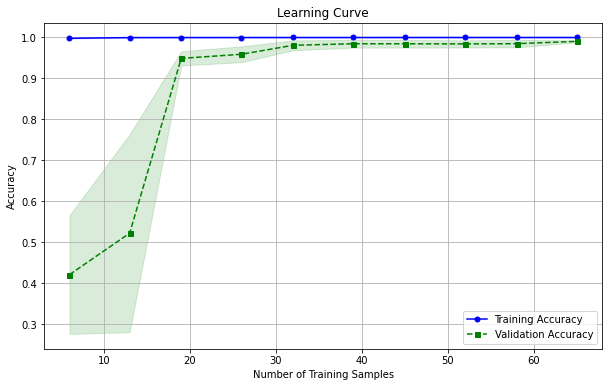

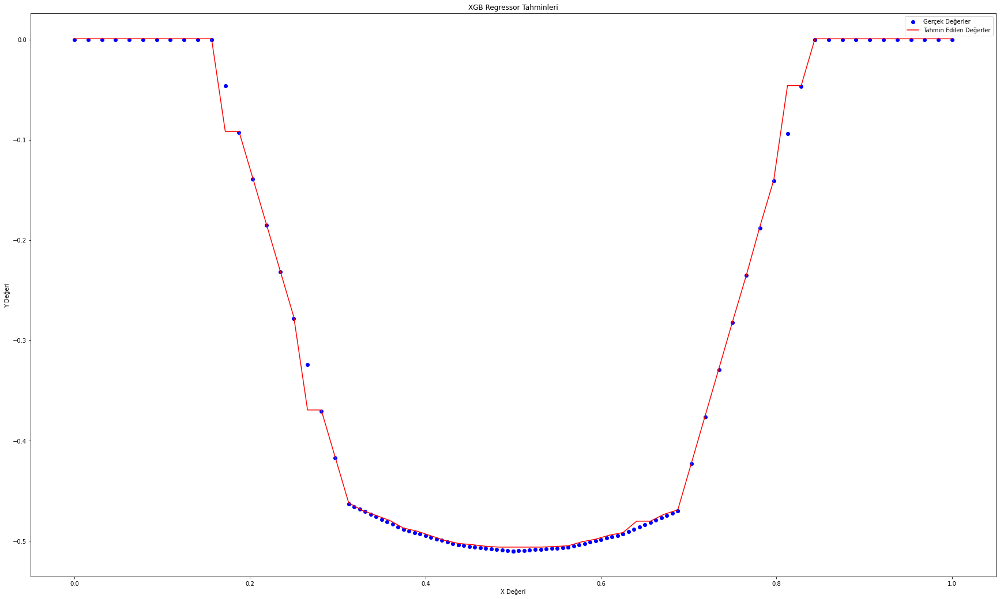

[-0.5]


In [46]:
from xgboost import XGBRegressor


xgb_M10 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_M10.fit(X_train_M10, y_train_M10)

y_pred_M10 = xgb_M10.predict(X_test_M10)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M10.reshape(len(y_pred_M10),1), y_test_M10.reshape(len(y_test_M10),1)),1))


print(r2_score(y_test_M10, y_pred_M10))

# Use test and show results of test set
y_hat_M10 = xgb_M10.predict(X_M10)
mae = metrics.mean_absolute_error(y_M10,y_hat_M10)
mse = metrics.mean_squared_error(y_M10,y_hat_M10)
mape = np.mean(np.abs((y_M10 - y_hat_M10) / y_M10)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_M10.score(X_M10,y_M10))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M10 = pd.DataFrame({'Gerçek Değerler': y_test_M10, 'Tahmin Edilen Değerler': y_pred_M10})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M10, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M10 = pd.DataFrame({'Predicted': y_pred_M10, 'Actual': y_test_M10})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M10, y_test_M10, color='blue', label='Actual')
plt.plot(X_test_M10, y_pred_M10, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_M10, X=X_train_M10, y=y_train_M10, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M10 = np.arange(0, 1.015625, 0.015625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M10 = xgb_M10.predict(X_values_M10)

# Gerçek değerler için aynı işlemi yap
y_true_values_M10 = xgb_M10.predict(X_M10)

plt.figure(figsize=(30, 18))
plt.scatter(X_M10, y_M10, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M10, y_pred_values_M10, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_M10.predict([[0.43125]])) #0.43125 ==    -5.024393e-01 gerçek değerde

### GradientBoostingRegressor deneyelim

[[-4.93e-01 -4.91e-01]
 [-5.52e-04  0.00e+00]
 [-5.52e-04  0.00e+00]
 [-4.79e-01 -4.77e-01]
 [-5.07e-01 -5.07e-01]
 [-5.05e-01 -5.04e-01]
 [-4.81e-01 -4.83e-01]
 [-5.04e-01 -5.05e-01]
 [-1.41e-01 -9.40e-02]
 [-5.52e-04  0.00e+00]
 [-4.93e-01 -4.88e-01]
 [-4.82e-01 -4.86e-01]
 [-5.52e-04  0.00e+00]
 [-4.82e-01 -4.84e-01]
 [-2.78e-01 -3.24e-01]
 [-5.02e-01 -5.01e-01]
 [-5.08e-01 -5.10e-01]
 [-5.00e-01 -4.98e-01]
 [-4.39e-04  0.00e+00]
 [-5.04e-01 -5.02e-01]
 [-9.29e-02 -4.63e-02]
 [-4.92e-01 -4.93e-01]
 [-5.06e-01 -5.06e-01]
 [-4.76e-01 -4.73e-01]
 [-4.63e-01 -4.63e-01]
 [-4.88e-01 -4.86e-01]
 [-5.05e-01 -5.06e-01]
 [-4.93e-01 -4.93e-01]]
0.9943503682942234
TEST SET
MAE:                 0.0018712320109886857
RMSE:                0.007773549294413768
MAPE:                inf
r2:                  0.9986331166805064


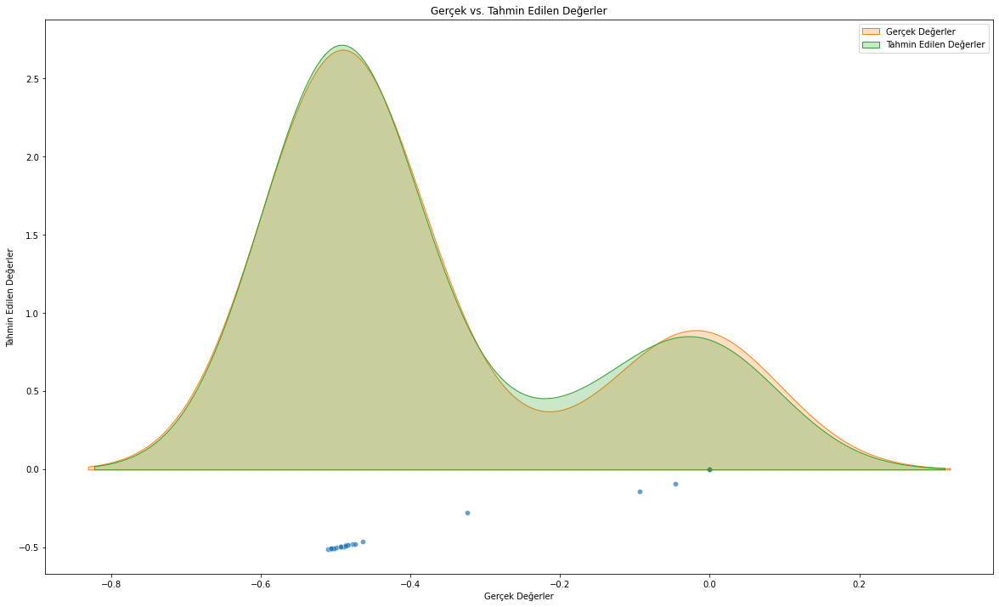

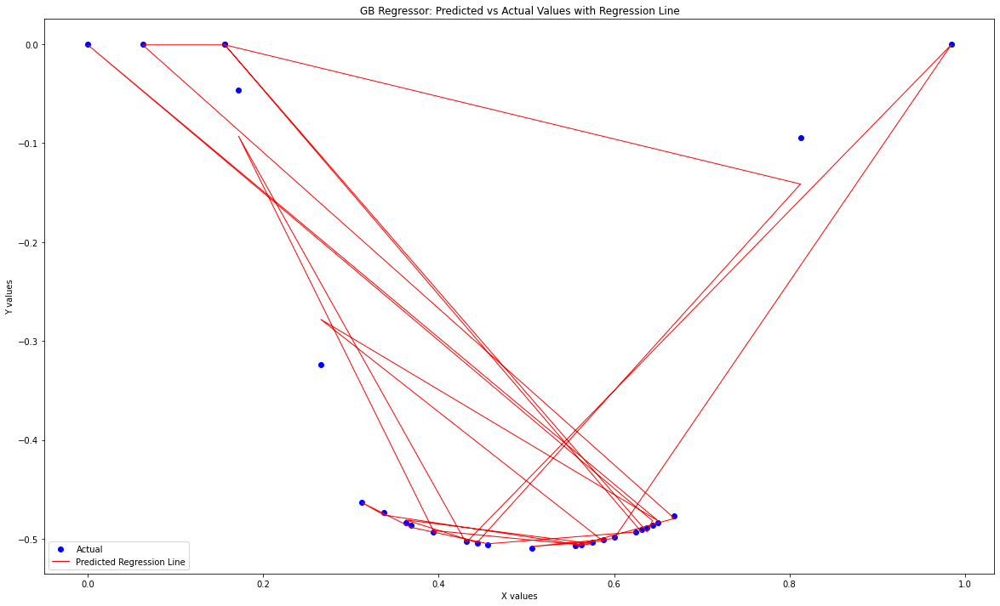

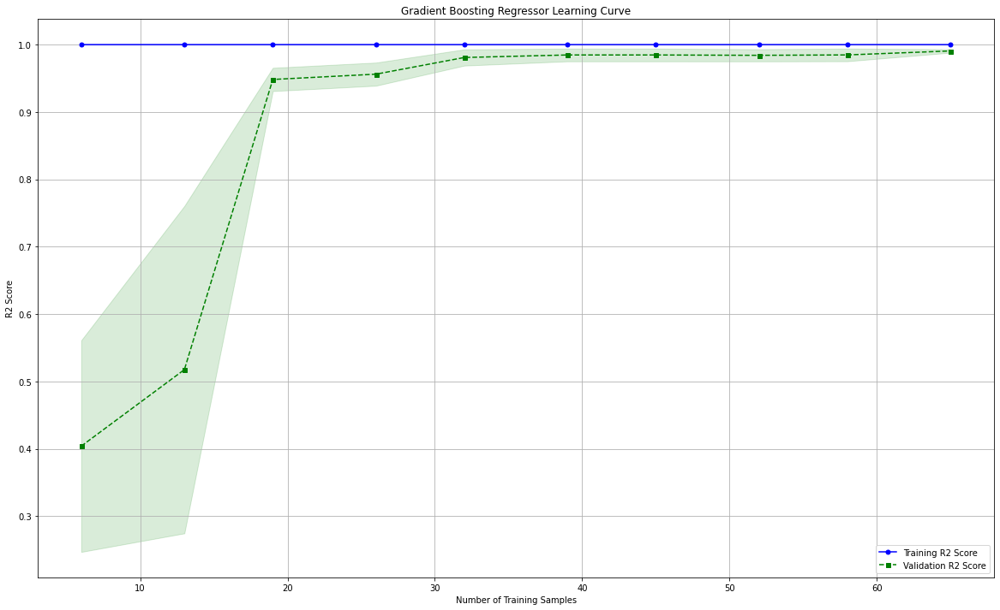

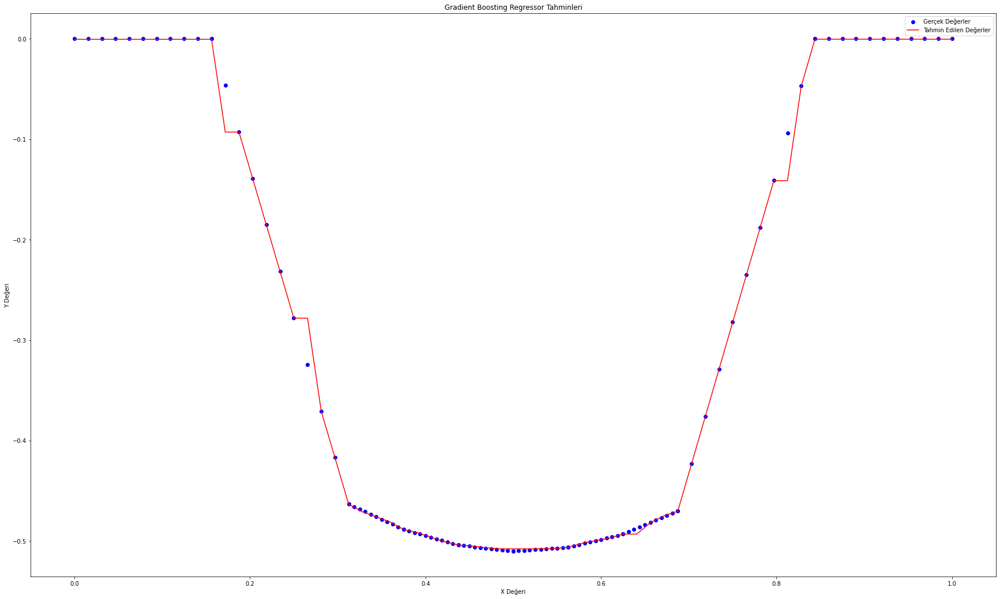

[-0.5]


In [47]:
gb_reg_M10 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_M10.fit(X_train_M10, y_train_M10)

y_pred_M10 = gb_reg_M10.predict(X_test_M10)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M10.reshape(len(y_pred_M10),1), y_test_M10.reshape(len(y_test_M10),1)),1))


print(r2_score(y_test_M10, y_pred_M10))

# Use test and show results of test set
y_hat_M10 = gb_reg_M10.predict(X_M10)
mae = metrics.mean_absolute_error(y_M10,y_hat_M10)
mse = metrics.mean_squared_error(y_M10,y_hat_M10)
mape = np.mean(np.abs((y_M10 - y_hat_M10) / y_M10)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_M10.score(X_M10,y_M10))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M10 = pd.DataFrame({'Gerçek Değerler': y_test_M10, 'Tahmin Edilen Değerler': y_pred_M10})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M10, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M10 = pd.DataFrame({'Predicted': y_pred_M10, 'Actual': y_test_M10})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M10, y_test_M10, color='blue', label='Actual')
plt.plot(X_test_M10, y_pred_M10, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_M10, X=X_train_M10, y=y_train_M10, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()



# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M10 = np.arange(0, 1.015625, 0.015625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M10 = gb_reg_M10.predict(X_values_M10)

# Gerçek değerler için aynı işlemi yap
y_true_values_M10 = gb_reg_M10.predict(X_M10)

plt.figure(figsize=(30, 18))
plt.scatter(X_M10, y_M10, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M10, y_pred_values_M10, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_M10.predict([[0.43125]])) #0.43125 ==    -5.024393e-01 gerçek değerde

### SupportVectorRegressor deneyelim

[[-0.51 -0.49]
 [-0.08  0.  ]
 [ 0.03  0.  ]
 [-0.45 -0.48]
 [-0.56 -0.51]
 [-0.55 -0.5 ]
 [-0.49 -0.48]
 [-0.54 -0.5 ]
 [-0.12 -0.09]
 [-0.08  0.  ]
 [-0.5  -0.49]
 [-0.49 -0.49]
 [ 0.02  0.  ]
 [-0.48 -0.48]
 [-0.32 -0.32]
 [-0.54 -0.5 ]
 [-0.56 -0.51]
 [-0.54 -0.5 ]
 [ 0.04  0.  ]
 [-0.54 -0.5 ]
 [-0.11 -0.05]
 [-0.52 -0.49]
 [-0.55 -0.51]
 [-0.45 -0.47]
 [-0.41 -0.46]
 [-0.49 -0.49]
 [-0.55 -0.51]
 [-0.51 -0.49]]
0.9648754211090929
TEST SET
MAE:                 0.03222614148440059
RMSE:                0.036357915997424474
MAPE:                inf
r2:                  0.970098657076769


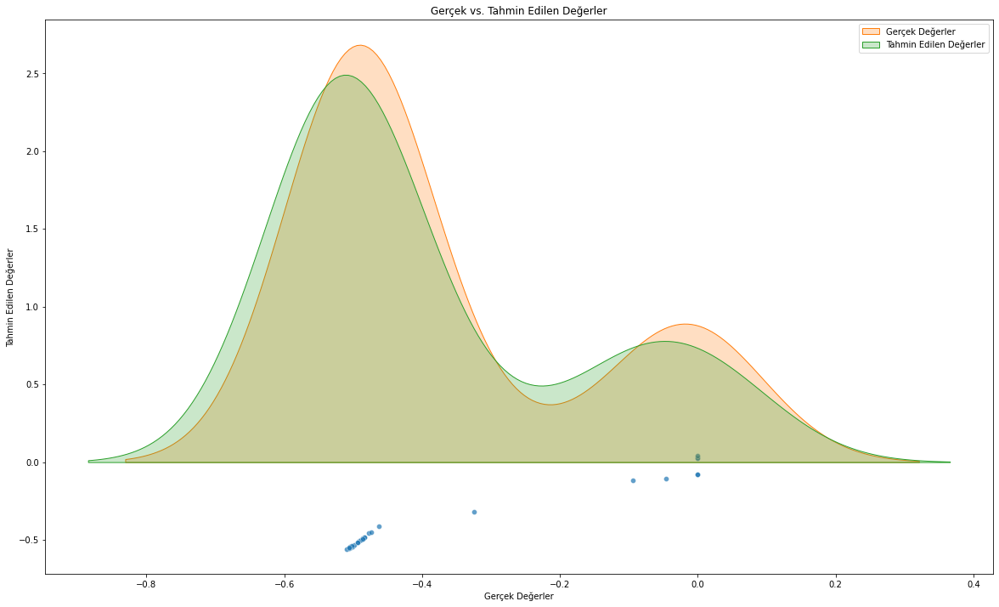

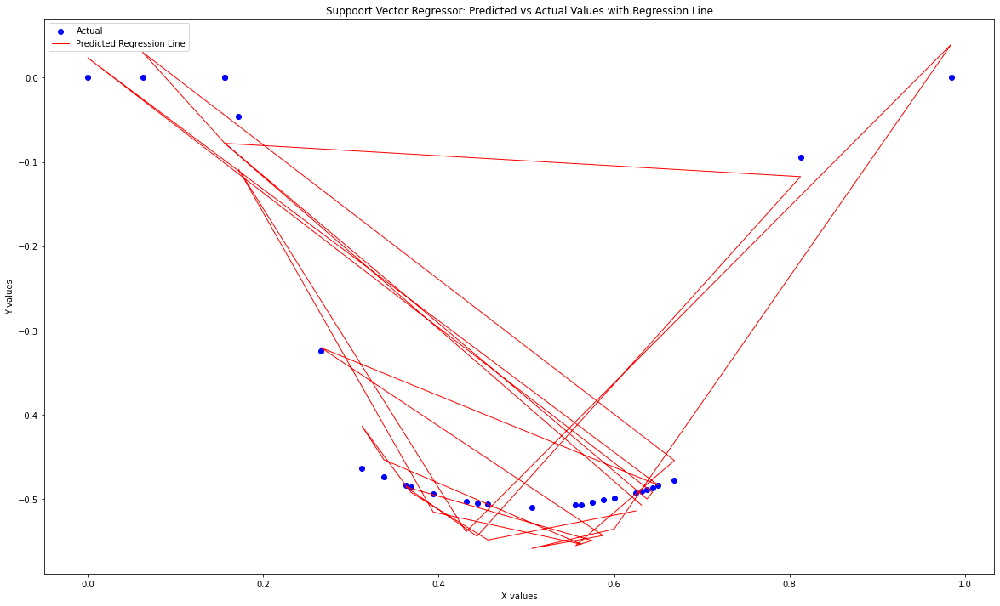

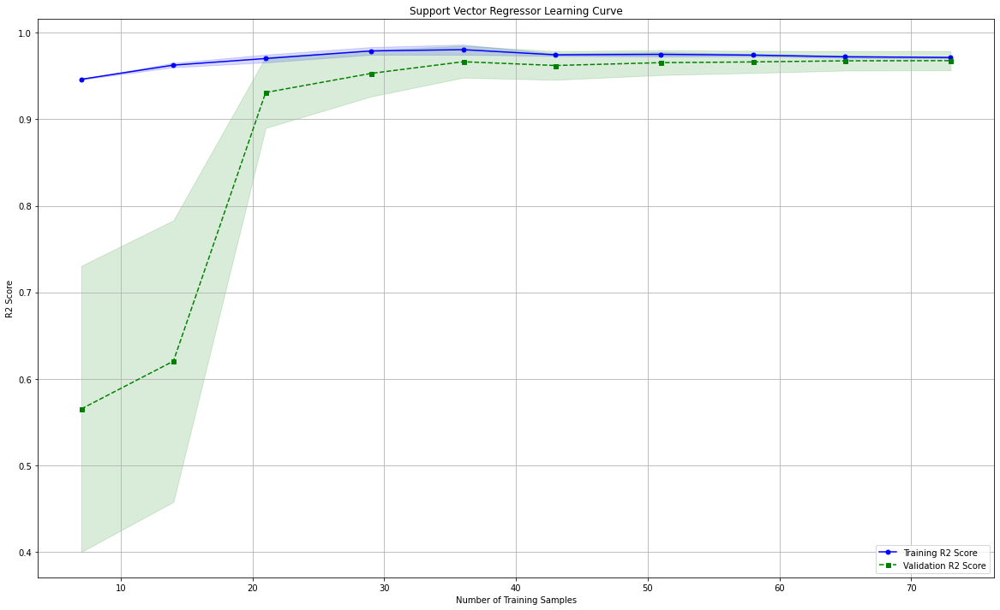

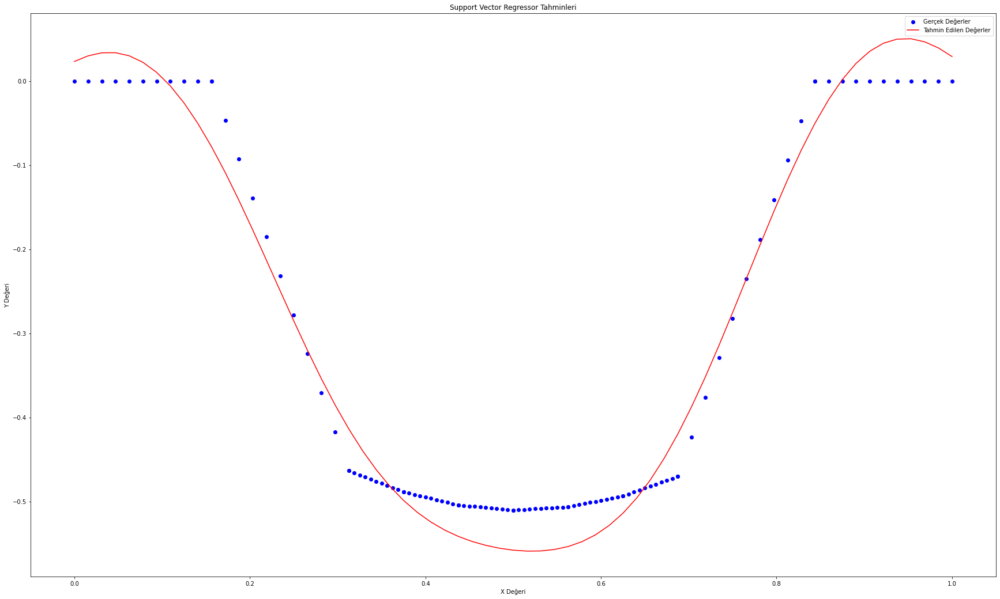

[-0.54]


In [48]:
svr_reg_M10 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_M10.fit(X_train_M10, y_train_M10)

y_pred_M10 = svr_reg_M10.predict(X_test_M10)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M10.reshape(len(y_pred_M10),1), y_test_M10.reshape(len(y_test_M10),1)),1))


print(r2_score(y_test_M10, y_pred_M10))


# Use test and show results of test set
y_hat_M10 = svr_reg_M10.predict(X_M10)
mae = metrics.mean_absolute_error(y_M10,y_hat_M10)
mse = metrics.mean_squared_error(y_M10,y_hat_M10)
mape = np.mean(np.abs((y_M10 - y_hat_M10) / y_M10)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_M10.score(X_M10,y_M10))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M10 = pd.DataFrame({'Gerçek Değerler': y_test_M10, 'Tahmin Edilen Değerler': y_pred_M10})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M10, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M10 = pd.DataFrame({'Predicted': y_pred_M10, 'Actual': y_test_M10})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M10, y_test_M10, color='blue', label='Actual')
plt.plot(X_test_M10, y_pred_M10, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_M10, X=X_train_M10, y=y_train_M10, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M10 = np.arange(0, 1.015625, 0.015625).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M10 = svr_reg_M10.predict(X_values_M10)

# Gerçek değerler için aynı işlemi yap
y_true_values_M10 = svr_reg_M10.predict(X_M10)

plt.figure(figsize=(30, 18))
plt.scatter(X_M10, y_M10, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M10, y_pred_values_M10, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_M10.predict([[0.43125]])) #0.43125 ==    -5.024393e-01 gerçek değerde

### PolynomialRegressor ile deneyelim

R2 Score (Polynomial Regression):  0.966476851237026
MAE (Polynomial Regression):  0.02912512304366181
RMSE (Polynomial Regression):  0.03746272779472303
MAPE (Polynomial Regression):  inf


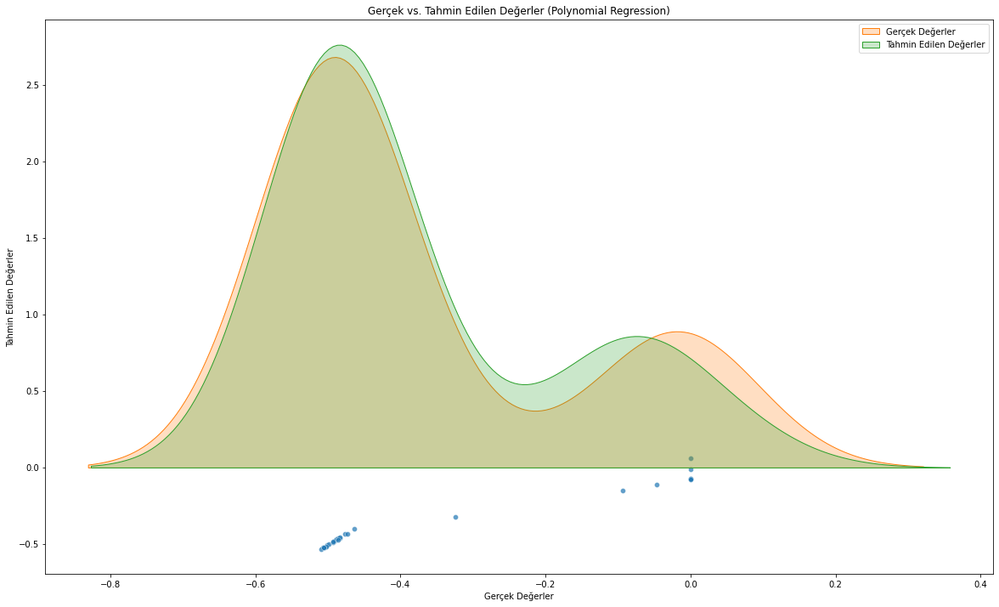

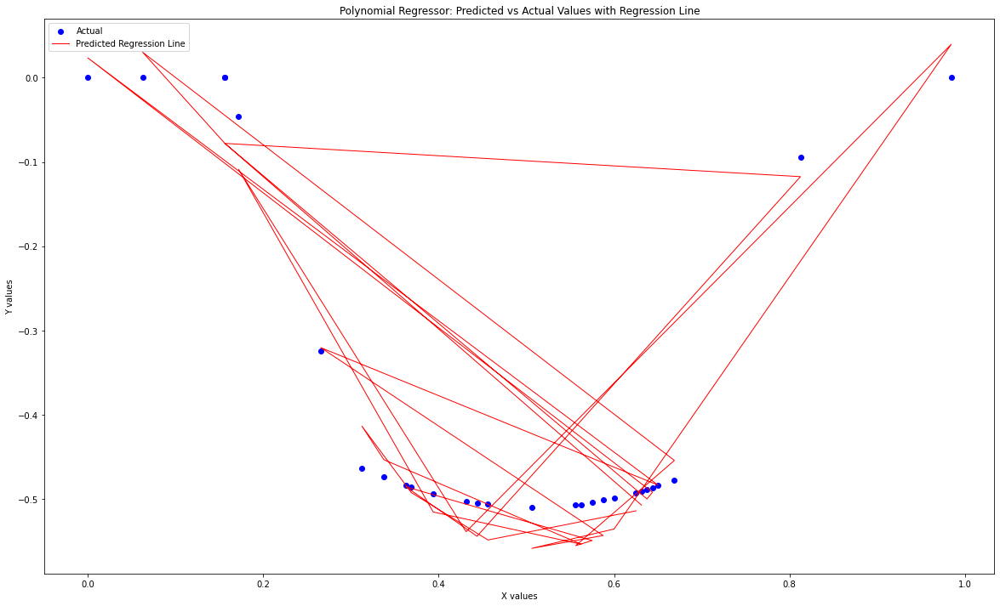

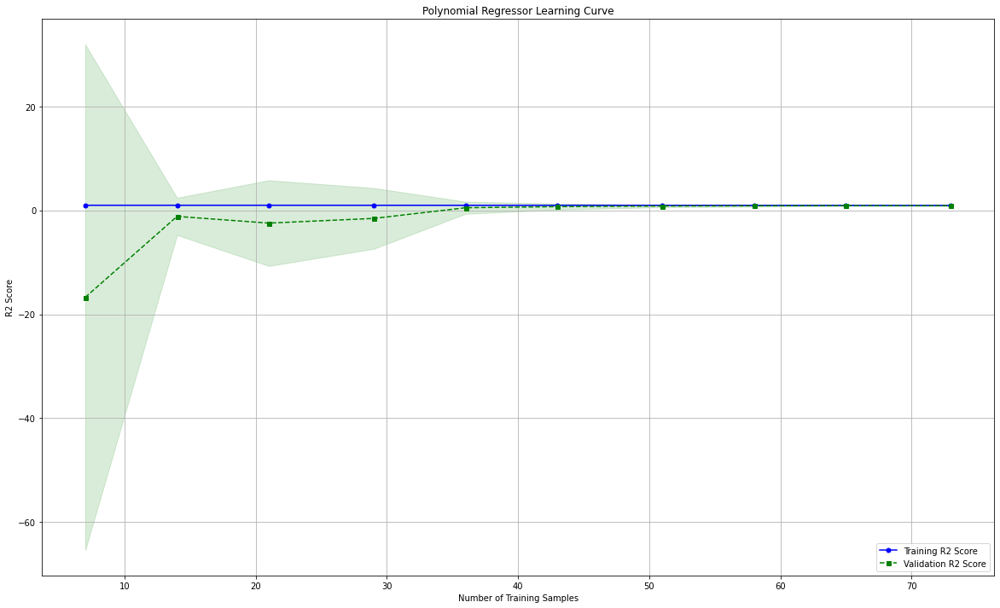

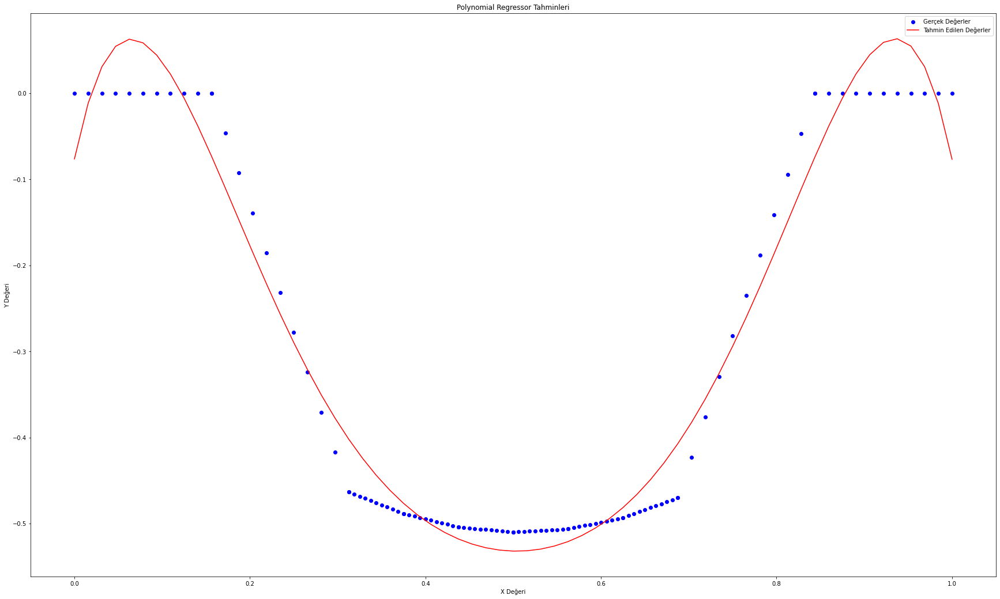

[-0.52]


In [49]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_M10 = PolynomialFeatures(degree=7)
X_poly_M10 = poly_M10.fit_transform(X_M10)

# Lineer Regresyon modeli oluşturma
poly_reg_M10 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_M10.fit(X_M10, y_M10)

# Tahminler yapma
y_pred_poly_M10 = poly_reg_M10.predict(X_test_M10)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_M10, y_pred_poly_M10))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_M10, y_pred_poly_M10))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_M10, y_pred_poly_M10)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_M10 - y_pred_poly_M10) / y_test_M10)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_M10 = pd.DataFrame({'Gerçek Değerler': y_test_M10, 'Tahmin Edilen Değerler': y_pred_poly_M10})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_M10, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M10['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M10['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_M10 = pd.DataFrame({'Predicted': y_pred_M10, 'Actual': y_test_M10})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M10, y_test_M10, color='blue', label='Actual')
plt.plot(X_test_M10, y_pred_M10, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_M10, X=X_train_M10, y=y_train_M10, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()


# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M10 = np.arange(0, 1.015625, 0.015625).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M10 = poly_reg_M10.predict(X_values_M10)

# Gerçek değerler için aynı işlemi yap
y_true_values_M10 = poly_reg_M10.predict(X_M10)

plt.figure(figsize=(30, 18))
plt.scatter(X_M10, y_M10, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M10, y_pred_values_M10, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_M10.predict([[0.43125]]))  #0.43125 ==    -5.024393e-01 gerçek değerde

### Multi-Layer Perceptron

In [52]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_M10, y_train_M10,epochs=100, batch_size=32, validation_split=0.25)

y_pred_M10 = mlp.predict(X_test_M10)

Epoch 1/100
2/2 [==============================] - 1s 121ms/step - loss: 0.1593 - mae: 0.3396 - val_loss: 0.1476 - val_mae: 0.3195
Epoch 2/100
2/2 [==============================] - 0s 27ms/step - loss: 0.1578 - mae: 0.3383 - val_loss: 0.1463 - val_mae: 0.3184
Epoch 3/100
2/2 [==============================] - 0s 27ms/step - loss: 0.1564 - mae: 0.3372 - val_loss: 0.1449 - val_mae: 0.3172
Epoch 4/100
2/2 [==============================] - 0s 29ms/step - loss: 0.1549 - mae: 0.3361 - val_loss: 0.1435 - val_mae: 0.3161
Epoch 5/100
2/2 [==============================] - 0s 27ms/step - loss: 0.1534 - mae: 0.3349 - val_loss: 0.1421 - val_mae: 0.3149
Epoch 6/100
2/2 [==============================] - 0s 29ms/step - loss: 0.1519 - mae: 0.3336 - val_loss: 0.1406 - val_mae: 0.3137
Epoch 7/100
2/2 [==============================] - 0s 28ms/step - loss: 0.1504 - mae: 0.3322 - val_loss: 0.1392 - val_mae: 0.3125
Epoch 8/100
2/2 [==============================] - 0s 27ms/step - loss: 0.1489 - mae: 0.3

2/2 [==============================] - 0s 31ms/step - loss: 0.0453 - mae: 0.1986 - val_loss: 0.0466 - val_mae: 0.2012
Epoch 64/100
2/2 [==============================] - 0s 29ms/step - loss: 0.0451 - mae: 0.1966 - val_loss: 0.0467 - val_mae: 0.1996
Epoch 65/100
2/2 [==============================] - 0s 31ms/step - loss: 0.0447 - mae: 0.1942 - val_loss: 0.0468 - val_mae: 0.1982
Epoch 66/100
2/2 [==============================] - 0s 28ms/step - loss: 0.0447 - mae: 0.1928 - val_loss: 0.0470 - val_mae: 0.1970
Epoch 67/100
2/2 [==============================] - 0s 26ms/step - loss: 0.0445 - mae: 0.1911 - val_loss: 0.0471 - val_mae: 0.1960
Epoch 68/100
2/2 [==============================] - 0s 26ms/step - loss: 0.0447 - mae: 0.1903 - val_loss: 0.0473 - val_mae: 0.1952
Epoch 69/100
2/2 [==============================] - 0s 28ms/step - loss: 0.0446 - mae: 0.1892 - val_loss: 0.0474 - val_mae: 0.1947
Epoch 70/100
2/2 [==============================] - 0s 28ms/step - loss: 0.0446 - mae: 0.1888 - 

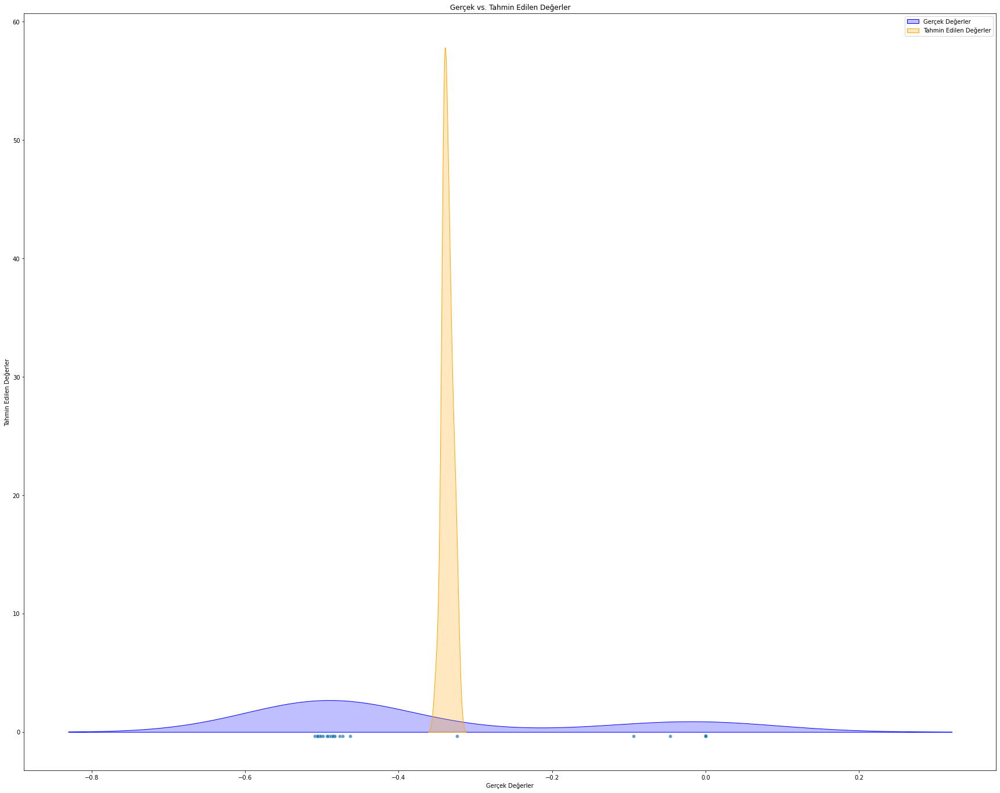

In [53]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_M10 = pd.DataFrame({'Gerçek Değerler': y_test_M10.flatten(), 'Tahmin Edilen Değerler': y_pred_M10.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M10, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M10['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
3/3 [==============================] - 0s 30ms/step - loss: 0.0451 - mae: 0.1932 - val_loss: 0.0439 - val_mae: 0.1862
Epoch 2/50
3/3 [==============================] - 0s 13ms/step - loss: 0.0451 - mae: 0.1929 - val_loss: 0.0440 - val_mae: 0.1860
Epoch 3/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0451 - mae: 0.1924 - val_loss: 0.0440 - val_mae: 0.1860
Epoch 4/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0451 - mae: 0.1925 - val_loss: 0.0438 - val_mae: 0.1861
Epoch 5/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0451 - mae: 0.1931 - val_loss: 0.0436 - val_mae: 0.1863
Epoch 6/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0451 - mae: 0.1939 - val_loss: 0.0435 - val_mae: 0.1865
Epoch 7/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0452 - mae: 0.1947 - val_loss: 0.0434 - val_mae: 0.1866
Epoch 8/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0451 - mae: 0.1946 - val

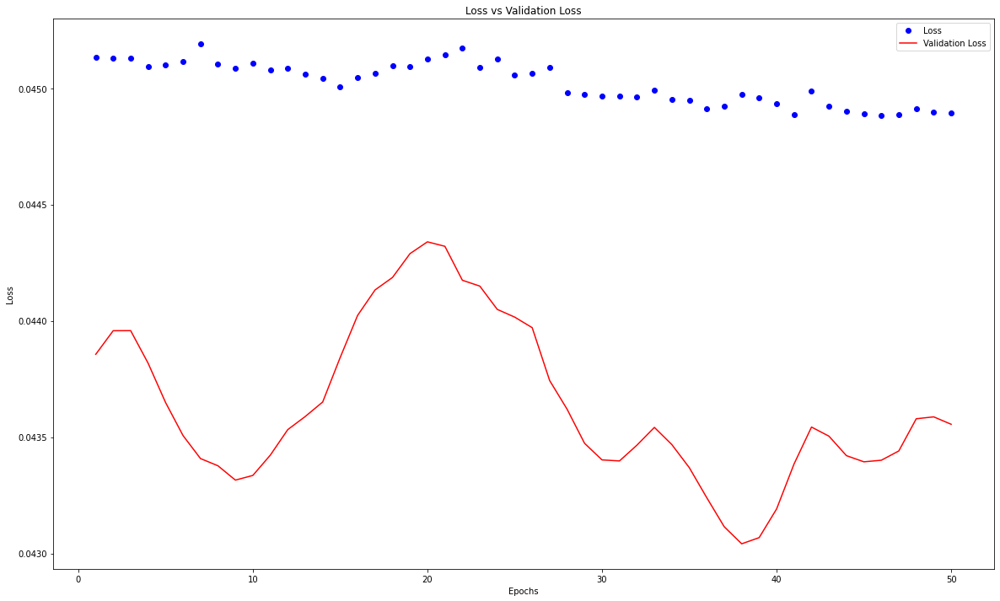

In [54]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_M10, y_train_M10, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması

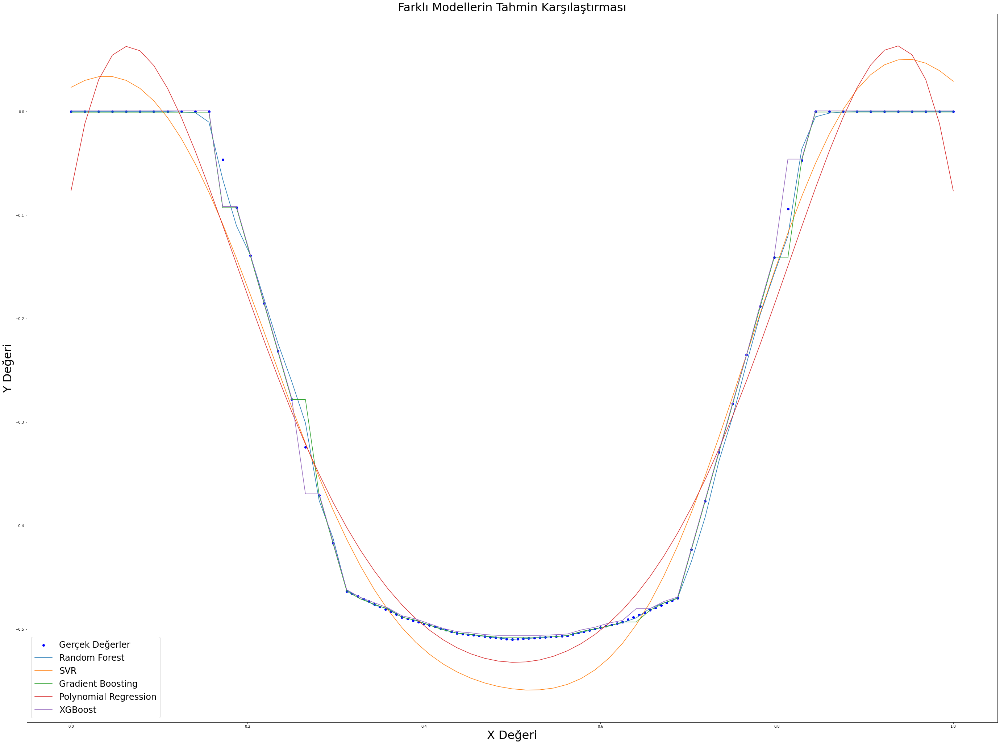

In [55]:
y_pred_rf_M10 = rf_reg_M10.predict(X_values_M10)
y_pred_svr_M10 = svr_reg_M10.predict(X_values_M10)  
y_pred_gb_M10 = gb_reg_M10.predict(X_values_M10)
y_pred_poly_M10 = poly_reg_M10.predict(X_values_M10)
y_pred_xgb_M10 = xgb_M10.predict(X_values_M10)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_M10, y_M10, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_M10, y_pred_rf_M10, label='Random Forest')
plt.plot(X_values_M10, y_pred_svr_M10, label='SVR')
plt.plot(X_values_M10, y_pred_gb_M10, label='Gradient Boosting')
plt.plot(X_values_M10, y_pred_poly_M10, label='Polynomial Regression')
plt.plot(X_values_M10, y_pred_xgb_M10, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

# M12 Verileri için Modeller

In [57]:
data_M12 = pd.read_excel('M verileri.xlsx')
data_M12 = data_M12.iloc[:, 4:6] # 5. ve 6. kolonları seçelim
data_M12

,M12_X2_iz10_imort,M12_X2_fi
0,0.000000,0.000000e+00
1,0.104167,0.000000e+00
2,0.208333,0.000000e+00
3,0.312500,0.000000e+00
4,0.416667,0.000000e+00
5,0.520833,0.000000e+00
6,0.625000,0.000000e+00
7,0.729167,0.000000e+00
8,0.833333,0.000000e+00
9,0.937500,0.000000e+00


In [58]:
data_M12 = data_M12.loc[:131,:] #132 adet veri var onları alıcaz mecbur
data_M12['M12_X2_iz10_imort'] = data_M12['M12_X2_iz10_imort'] / 10 # koordinat değerlerini / 10 yapmam gerekli
data_M12

,M12_X2_iz10_imort,M12_X2_fi
0,0.000000,0.000000e+00
1,0.010417,0.000000e+00
2,0.020833,0.000000e+00
3,0.031250,0.000000e+00
4,0.041667,0.000000e+00
5,0.052083,0.000000e+00
6,0.062500,0.000000e+00
7,0.072917,0.000000e+00
8,0.083333,0.000000e+00
9,0.093750,0.000000e+00


In [59]:
data_M12.columns[data_M12.isnull().any()]

Index([], dtype='object')

In [60]:
data_M12.isna().any()

M12_X2_iz10_imort    False
M12_X2_fi            False
dtype: bool

In [61]:
data_M12.describe()

,M12_X2_iz10_imort,M12_X2_fi
count,132.000000,1.320000e+02
mean,0.500000,-2.870492e-01
std,0.263934,2.322400e-01
min,0.000000,-5.114016e-01
25%,0.312500,-4.993042e-01
50%,0.500000,-4.657275e-01
75%,0.687500,0.000000e+00
max,1.000000,7.024411e-09


In [62]:
data_M12.shape

(132, 2)

### veri kontrol edildi, problem yok

In [63]:
X_M12 = data_M12.iloc[:, :1].values
y_M12 = data_M12.iloc[:,1].values

In [64]:
print(X_M12.tolist())

[[0.0], [0.0104166665735344], [0.0208333331470688], [0.0312499997206032], [0.0416666662941376], [0.05208333286767201], [0.0624999994412064], [0.07291666601474081], [0.0833333325882752], [0.0937499991618097], [0.10416666573534401], [0.10416666418314], [0.114583330756674], [0.12499999733020899], [0.13541666390374302], [0.145833330477277], [0.156249997050812], [0.16666666362434598], [0.177083330197881], [0.187499996771415], [0.197916663344949], [0.20833332991848402], [0.20833332836628], [0.218749994939814], [0.229166661513348], [0.239583328086883], [0.249999994660417], [0.260416661233952], [0.27083332780748604], [0.28124999438102], [0.29166666095455496], [0.30208332752808903], [0.312499994101624], [0.312499992549419], [0.318749992642552], [0.32499999273568403], [0.331249992828816], [0.337499992921948], [0.343749993015081], [0.349999993108213], [0.356249993201345], [0.362499993294478], [0.36874999338761], [0.37499999348074203], [0.374999992549419], [0.381249992642552], [0.38749999273568403

In [66]:
X_M12.shape, y_M12.shape

((132, 1), (132,))

In [67]:
X_train_M12, X_test_M12, y_train_M12, y_test_M12 = train_test_split(X_M12, y_M12, test_size = 0.25, random_state = 42)

### RandomForestRegressor ile deneyelim

[[-5.06e-01 -5.06e-01]
 [-5.00e-01 -5.00e-01]
 [-1.86e-04  0.00e+00]
 [-4.05e-01 -4.18e-01]
 [-5.07e-01 -5.08e-01]
 [ 3.58e-10  0.00e+00]
 [-5.05e-01 -5.05e-01]
 [ 3.58e-10  0.00e+00]
 [-5.11e-01 -5.11e-01]
 [-1.66e-01 -1.86e-01]
 [-4.90e-01 -4.90e-01]
 [-2.40e-01 -2.32e-01]
 [-4.94e-01 -4.94e-01]
 [ 0.00e+00  0.00e+00]
 [-4.69e-01 -4.71e-01]
 [-4.04e-01 -3.77e-01]
 [-4.70e-01 -4.72e-01]
 [-5.03e-01 -5.02e-01]
 [-4.81e-01 -4.82e-01]
 [-5.09e-01 -5.10e-01]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.88e-01 -4.87e-01]
 [ 0.00e+00  0.00e+00]
 [-2.98e-02 -4.71e-02]
 [-5.11e-01 -5.11e-01]
 [ 3.58e-10  0.00e+00]
 [-4.81e-01 -4.78e-01]
 [-4.74e-01 -4.76e-01]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [ 3.58e-10  0.00e+00]
 [-5.10e-01 -5.10e-01]]
0.9990552749205963
TEST SET
MAE:                 0.002126252706040737
RMSE:                0.005289616875481585
MAPE:                nan
r2:                  0.9994772703615908


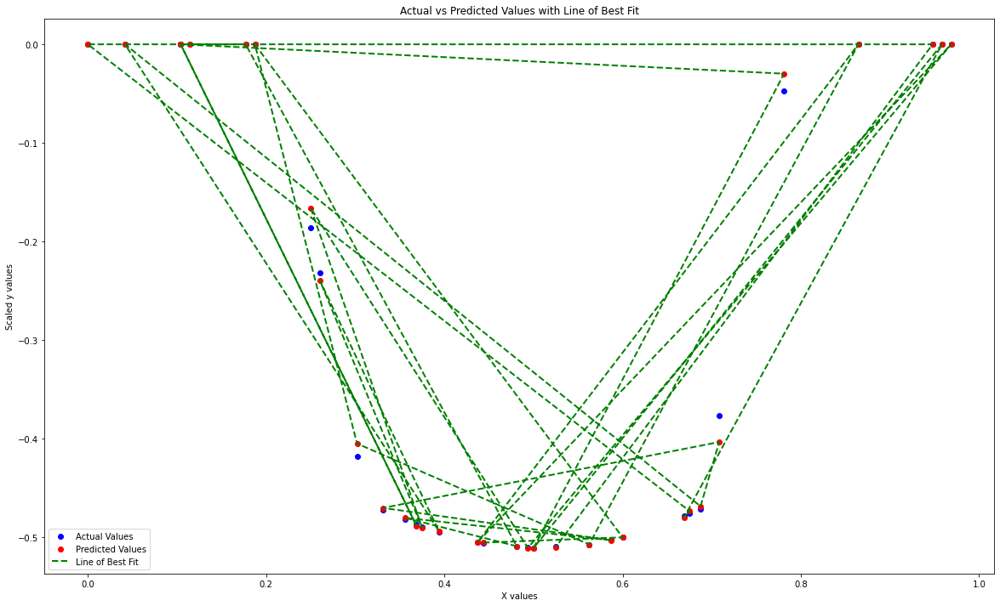

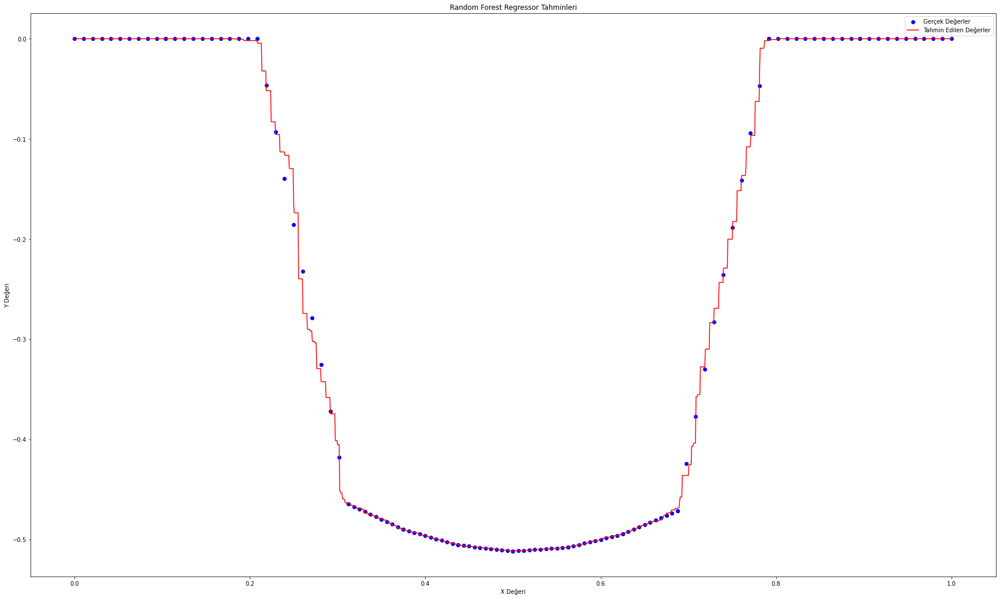

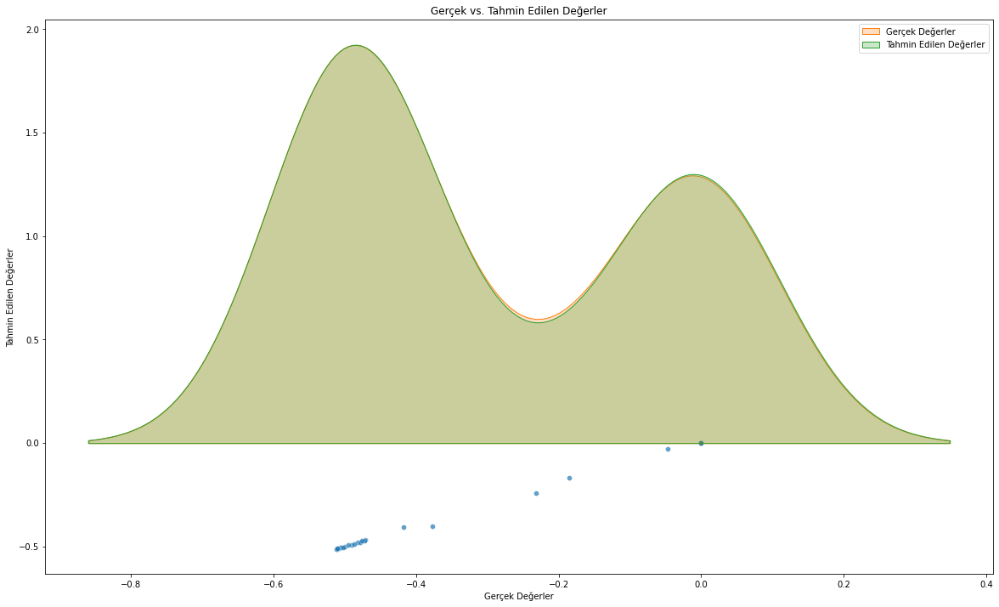

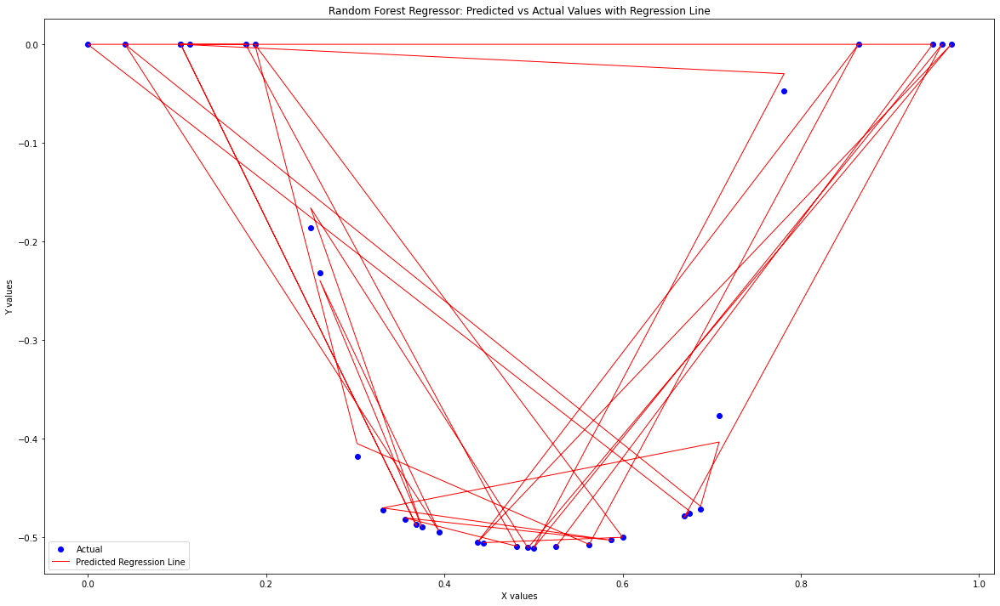

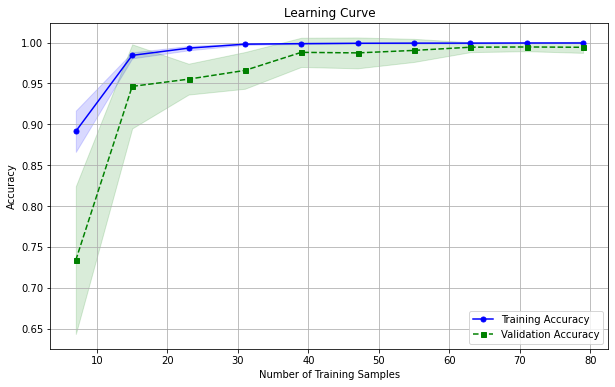

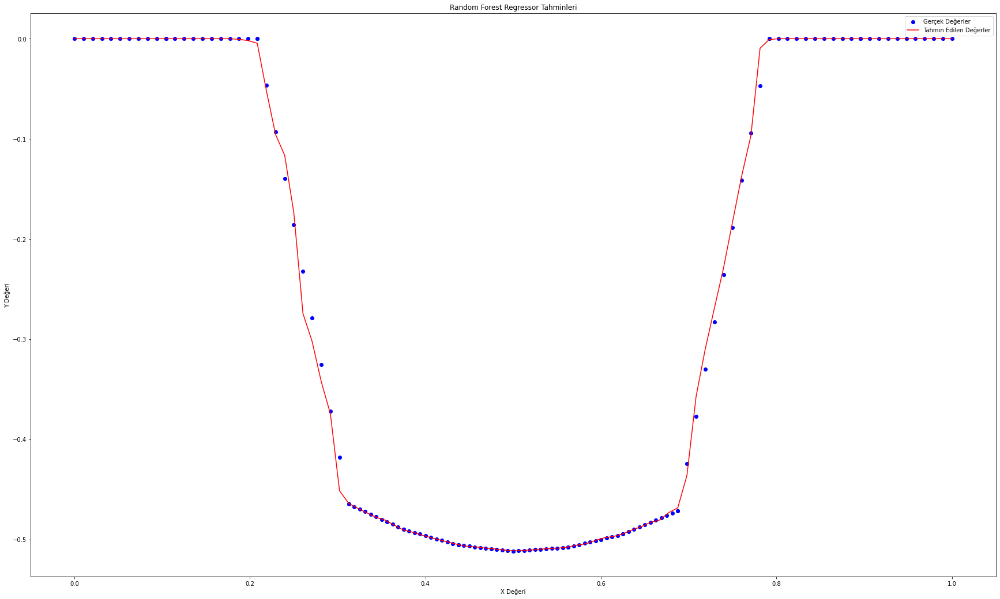

[-0.5]


In [69]:
rf_reg_M12 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_M12.fit(X_train_M12, y_train_M12)

y_pred_M12 = rf_reg_M12.predict(X_test_M12)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M12.reshape(len(y_pred_M12),1), y_test_M12.reshape(len(y_test_M12),1)),1))

print(r2_score(y_test_M12, y_pred_M12))

# Use test and show results of test set
y_hat_M12 = rf_reg_M12.predict(X_M12)
mae = metrics.mean_absolute_error(y_M12,y_hat_M12)
mse = metrics.mean_squared_error(y_M12,y_hat_M12)
mape = np.mean(np.abs((y_M12 - y_hat_M12) / y_M12)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_M12.score(X_M12,y_M12))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_M12, y_test_M12, color='blue', label='Actual Values')
plt.scatter(X_test_M12, y_pred_M12, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_M12, y_pred_M12, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M12 = np.arange(0, 1.000625, 0.000625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M12 = rf_reg_M12.predict(X_values_M12)

# Gerçek değerler için aynı işlemi yap
y_true_values_M12 = rf_reg_M12.predict(X_M12)

plt.figure(figsize=(30, 18))
plt.scatter(X_M12, y_M12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M12, y_pred_values_M12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M12 = pd.DataFrame({'Gerçek Değerler': y_test_M12, 'Tahmin Edilen Değerler': y_pred_M12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M12 = pd.DataFrame({'Predicted': y_pred_M12, 'Actual': y_test_M12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M12, y_test_M12, color='blue', label='Actual')
plt.plot(X_test_M12, y_pred_M12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_M12, X=X_train_M12, y=y_train_M12, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M12 = np.arange(0, 1.010417, 0.010417).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M12 = rf_reg_M12.predict(X_values_M12)

# Gerçek değerler için aynı işlemi yap
y_true_values_M12 = rf_reg_M12.predict(X_M12)

plt.figure(figsize=(30, 18))
plt.scatter(X_M12, y_M12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M12, y_pred_values_M12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_M12.predict([[0.43125]])) #0.43125 ==  -5.038538e-01 gerçek değerde

### XGBRegressor ile deneyelim

[[-0.5  -0.51]
 [-0.5  -0.5 ]
 [ 0.    0.  ]
 [-0.46 -0.42]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [-0.5  -0.51]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [-0.14 -0.19]
 [-0.49 -0.49]
 [-0.28 -0.23]
 [-0.49 -0.49]
 [ 0.    0.  ]
 [-0.47 -0.47]
 [-0.42 -0.38]
 [-0.47 -0.47]
 [-0.5  -0.5 ]
 [-0.48 -0.48]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [ 0.    0.  ]
 [ 0.   -0.05]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [-0.48 -0.48]
 [-0.47 -0.48]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.51 -0.51]]
0.9937966537766256
TEST SET
MAE:                 0.0030834963483581724
RMSE:                0.00913987639829779
MAPE:                inf
r2:                  0.9984393362771044


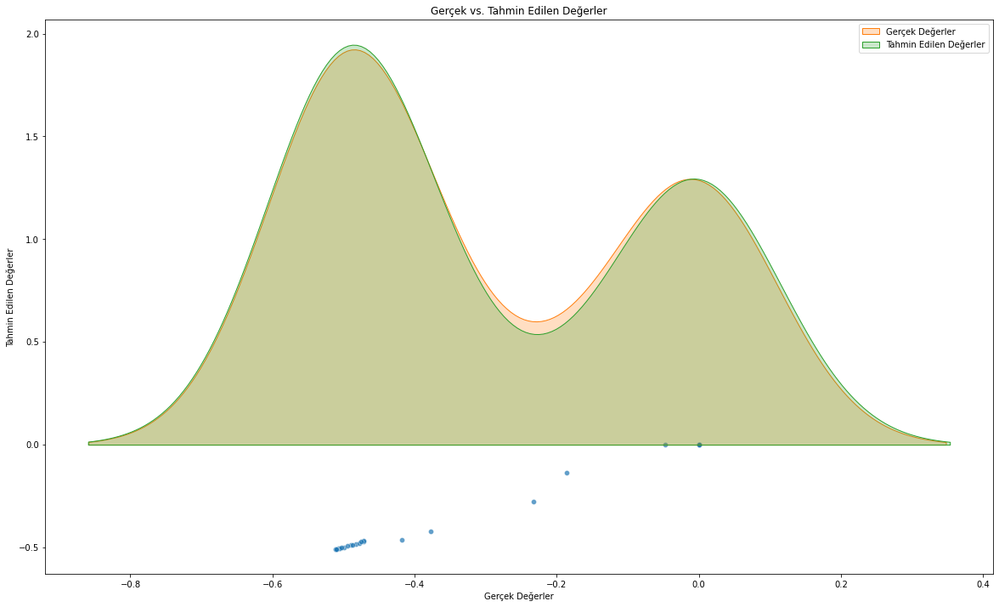

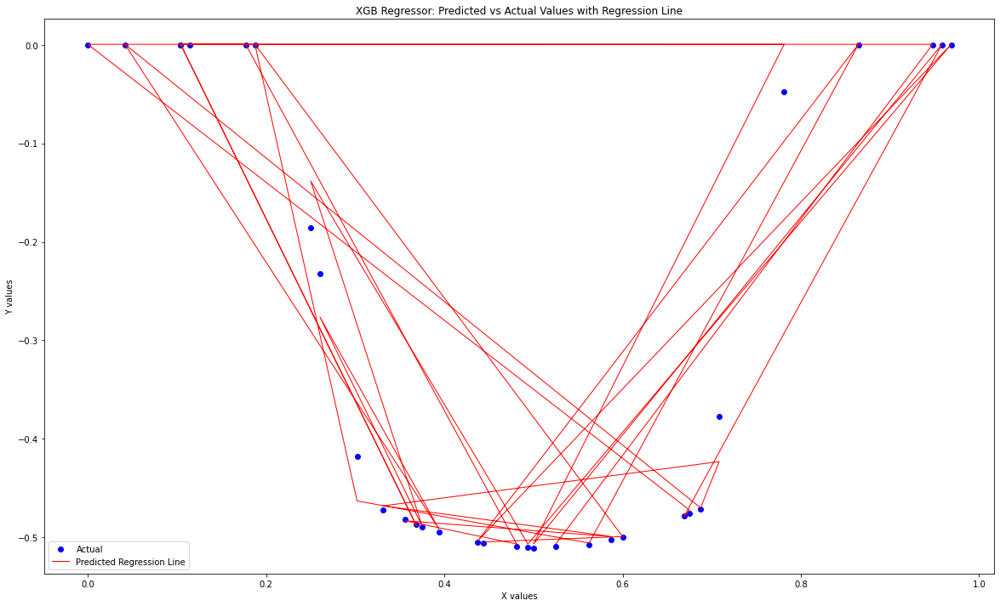

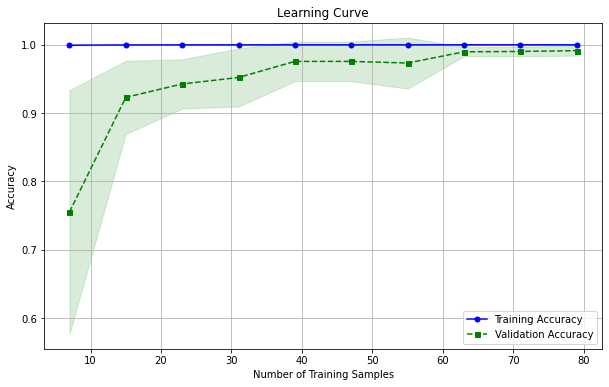

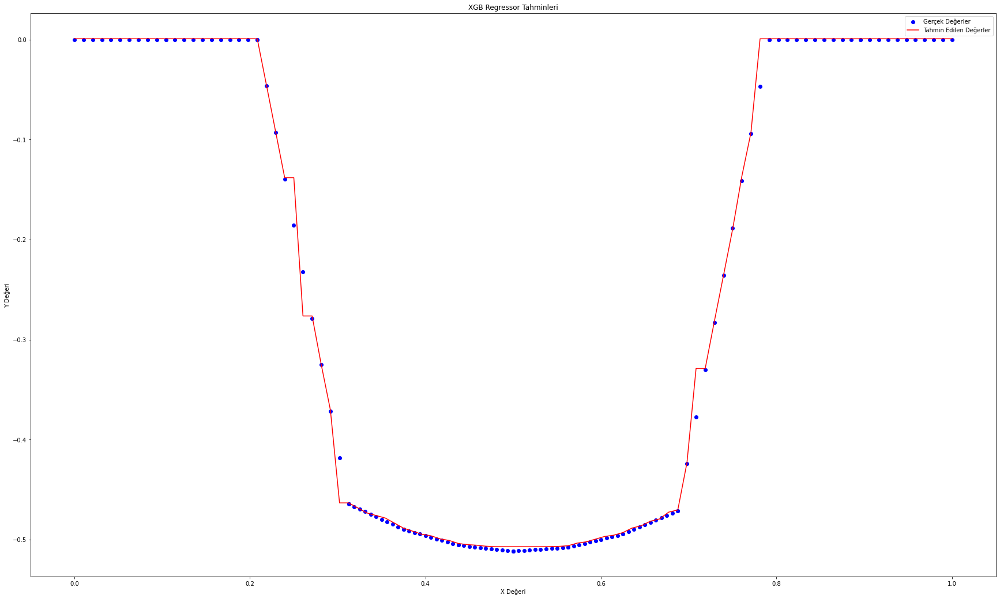

[-0.5]


In [70]:
from xgboost import XGBRegressor


xgb_M12 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_M12.fit(X_train_M12, y_train_M12)

y_pred_M12 = xgb_M12.predict(X_test_M12)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M12.reshape(len(y_pred_M12),1), y_test_M12.reshape(len(y_test_M12),1)),1))


print(r2_score(y_test_M12, y_pred_M12))

# Use test and show results of test set
y_hat_M12 = xgb_M12.predict(X_M12)
mae = metrics.mean_absolute_error(y_M12,y_hat_M12)
mse = metrics.mean_squared_error(y_M12,y_hat_M12)
mape = np.mean(np.abs((y_M12 - y_hat_M12) / y_M12)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_M12.score(X_M12,y_M12))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M12 = pd.DataFrame({'Gerçek Değerler': y_test_M12, 'Tahmin Edilen Değerler': y_pred_M12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M12 = pd.DataFrame({'Predicted': y_pred_M12, 'Actual': y_test_M12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M12, y_test_M12, color='blue', label='Actual')
plt.plot(X_test_M12, y_pred_M12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_M12, X=X_train_M12, y=y_train_M12, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M12 = np.arange(0, 1.010417, 0.010417).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M12 = xgb_M12.predict(X_values_M12)

# Gerçek değerler için aynı işlemi yap
y_true_values_M12 = xgb_M12.predict(X_M12)

plt.figure(figsize=(30, 18))
plt.scatter(X_M12, y_M12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M12, y_pred_values_M12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_M12.predict([[0.43125]]))  #0.43125 ==  -5.038538e-01 gerçek değerde

### GradientBoostingRegressor deneyelim

[[-5.05e-01 -5.06e-01]
 [-5.01e-01 -5.00e-01]
 [-4.29e-04  0.00e+00]
 [-3.72e-01 -4.18e-01]
 [-5.08e-01 -5.08e-01]
 [-3.68e-04  0.00e+00]
 [-5.05e-01 -5.05e-01]
 [-3.68e-04  0.00e+00]
 [-5.09e-01 -5.11e-01]
 [-1.40e-01 -1.86e-01]
 [-4.90e-01 -4.90e-01]
 [-2.79e-01 -2.32e-01]
 [-4.93e-01 -4.94e-01]
 [-4.29e-04  0.00e+00]
 [-4.72e-01 -4.71e-01]
 [-4.25e-01 -3.77e-01]
 [-4.70e-01 -4.72e-01]
 [-5.04e-01 -5.02e-01]
 [-4.80e-01 -4.82e-01]
 [-5.08e-01 -5.10e-01]
 [-4.29e-04  0.00e+00]
 [-4.29e-04  0.00e+00]
 [-4.90e-01 -4.87e-01]
 [-4.29e-04  0.00e+00]
 [-3.68e-04 -4.71e-02]
 [-5.09e-01 -5.11e-01]
 [-3.68e-04  0.00e+00]
 [-4.81e-01 -4.78e-01]
 [-4.74e-01 -4.76e-01]
 [-4.29e-04  0.00e+00]
 [-4.29e-04  0.00e+00]
 [-3.68e-04  0.00e+00]
 [-5.09e-01 -5.10e-01]]
0.9937073265595069
TEST SET
MAE:                 0.002266988287423697
RMSE:                0.009120211784244771
MAPE:                inf
r2:                  0.9984460446467912


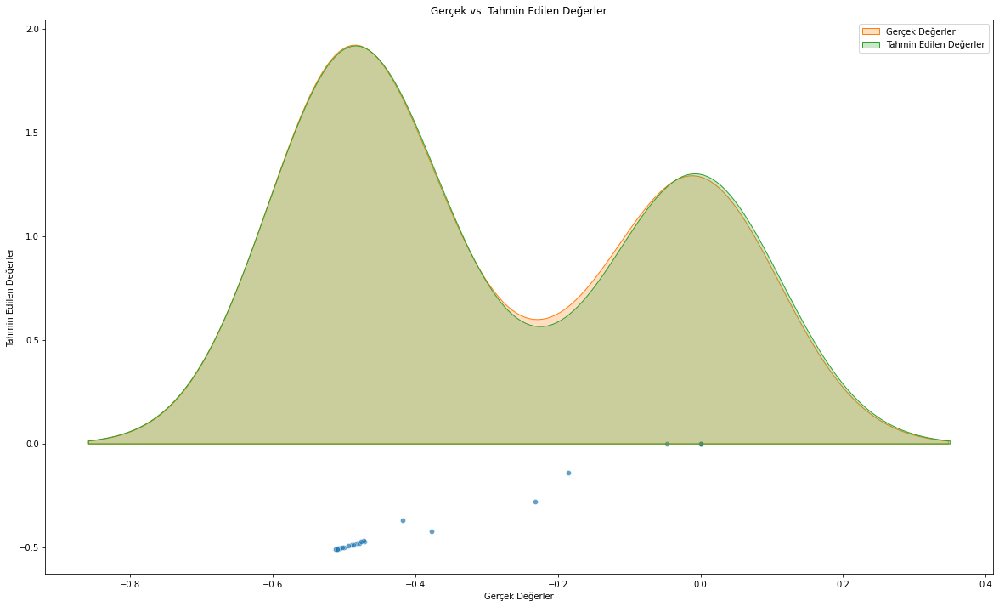

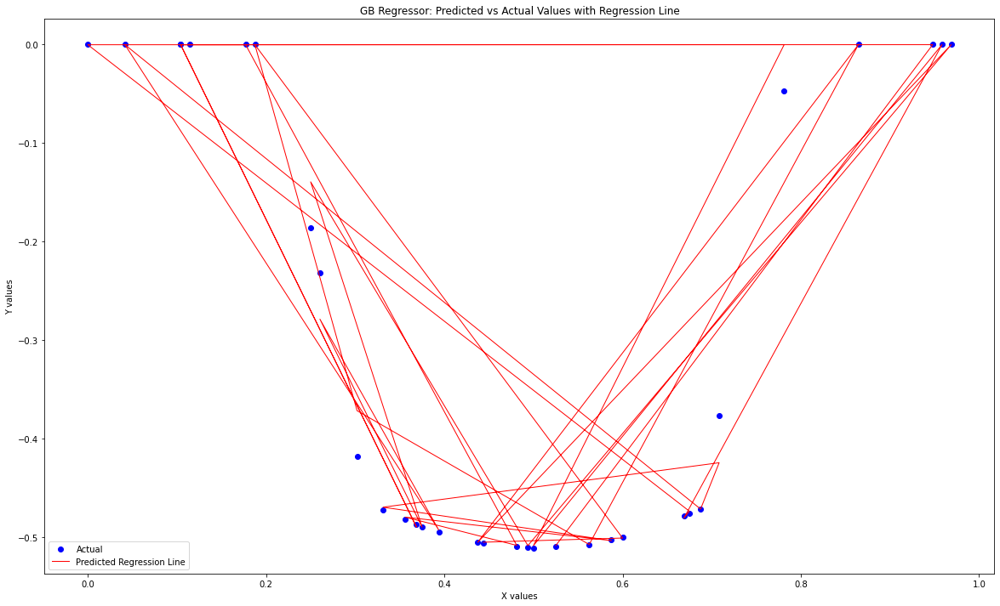

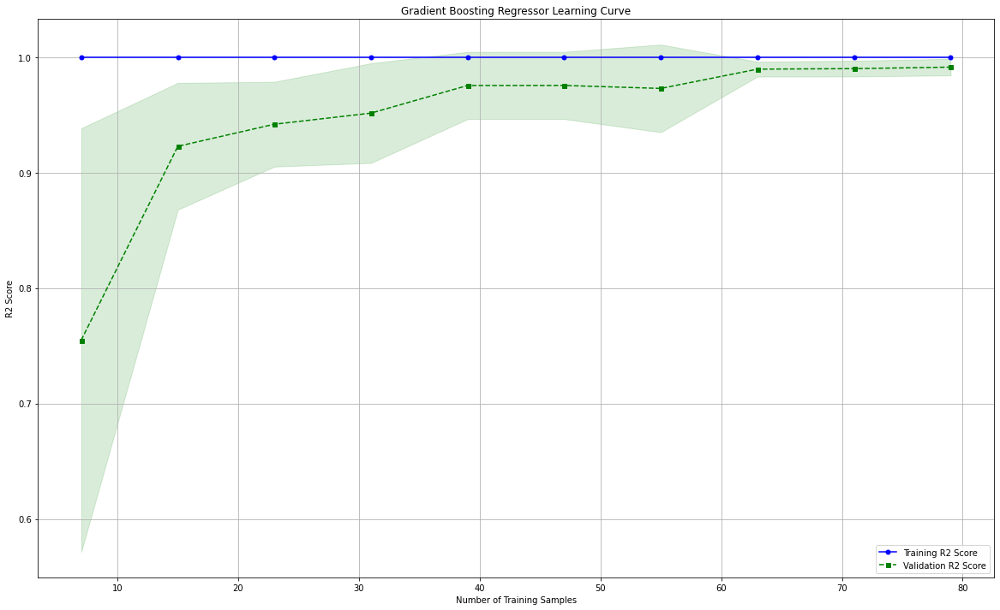

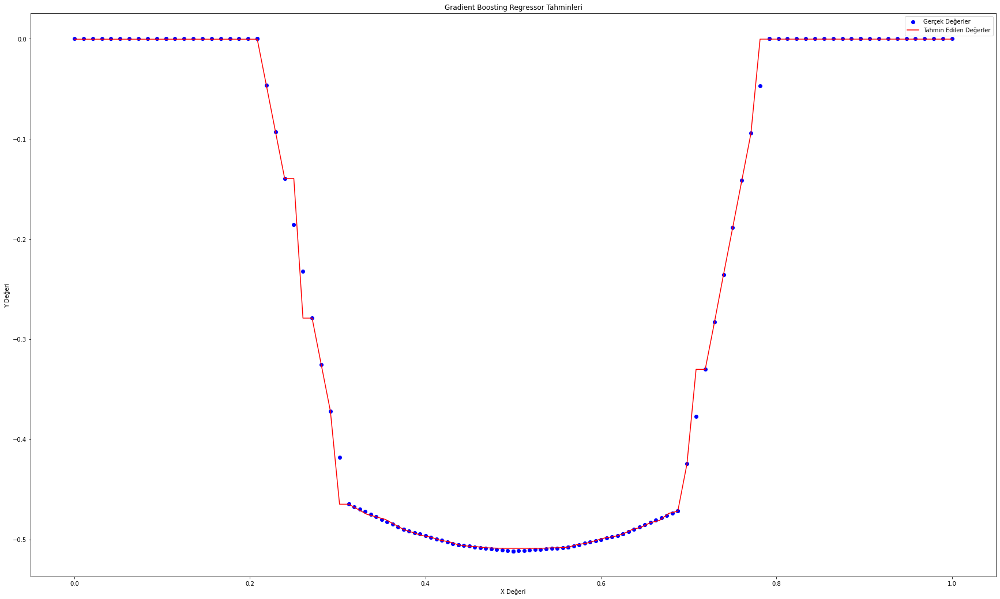

[-0.5]


In [71]:
gb_reg_M12 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_M12.fit(X_train_M12, y_train_M12)

y_pred_M12 = gb_reg_M12.predict(X_test_M12)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M12.reshape(len(y_pred_M12),1), y_test_M12.reshape(len(y_test_M12),1)),1))


print(r2_score(y_test_M12, y_pred_M12))

# Use test and show results of test set
y_hat_M12 = gb_reg_M12.predict(X_M12)
mae = metrics.mean_absolute_error(y_M12,y_hat_M12)
mse = metrics.mean_squared_error(y_M12,y_hat_M12)
mape = np.mean(np.abs((y_M12 - y_hat_M12) / y_M12)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_M12.score(X_M12,y_M12))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M12 = pd.DataFrame({'Gerçek Değerler': y_test_M12, 'Tahmin Edilen Değerler': y_pred_M12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M12 = pd.DataFrame({'Predicted': y_pred_M12, 'Actual': y_test_M12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M12, y_test_M12, color='blue', label='Actual')
plt.plot(X_test_M12, y_pred_M12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_M12, X=X_train_M12, y=y_train_M12, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()



# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M12 = np.arange(0, 1.010417, 0.010417).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M12 = gb_reg_M12.predict(X_values_M12)

# Gerçek değerler için aynı işlemi yap
y_true_values_M12 = gb_reg_M12.predict(X_M12)

plt.figure(figsize=(30, 18))
plt.scatter(X_M12, y_M12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M12, y_pred_values_M12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_M12.predict([[0.43125]])) #0.43125 ==  -5.038538e-01 gerçek değerde

### SupportVectorRegressor deneyelim

[[-5.53e-01 -5.06e-01]
 [-5.21e-01 -5.00e-01]
 [-3.35e-02  0.00e+00]
 [-3.50e-01 -4.18e-01]
 [-5.47e-01 -5.08e-01]
 [ 3.70e-02  0.00e+00]
 [-5.50e-01 -5.05e-01]
 [-4.71e-03  0.00e+00]
 [-5.60e-01 -5.11e-01]
 [-2.00e-01 -1.86e-01]
 [-4.98e-01 -4.90e-01]
 [-2.31e-01 -2.32e-01]
 [-5.20e-01 -4.94e-01]
 [-3.44e-04  0.00e+00]
 [-3.74e-01 -4.71e-01]
 [-3.21e-01 -3.77e-01]
 [-4.21e-01 -4.72e-01]
 [-5.32e-01 -5.02e-01]
 [-4.69e-01 -4.82e-01]
 [-5.60e-01 -5.10e-01]
 [-1.24e-02  0.00e+00]
 [ 5.32e-02  0.00e+00]
 [-4.89e-01 -4.87e-01]
 [ 5.32e-02  0.00e+00]
 [-1.17e-01 -4.71e-02]
 [-5.60e-01 -5.11e-01]
 [ 8.64e-03  0.00e+00]
 [-4.17e-01 -4.78e-01]
 [-4.04e-01 -4.76e-01]
 [-6.83e-02  0.00e+00]
 [ 5.30e-02  0.00e+00]
 [ 2.06e-02  0.00e+00]
 [-5.58e-01 -5.10e-01]]
0.9610926773610728
TEST SET
MAE:                 0.03930393079859415
RMSE:                0.045200038002060905
MAPE:                inf
r2:                  0.9618313947760555


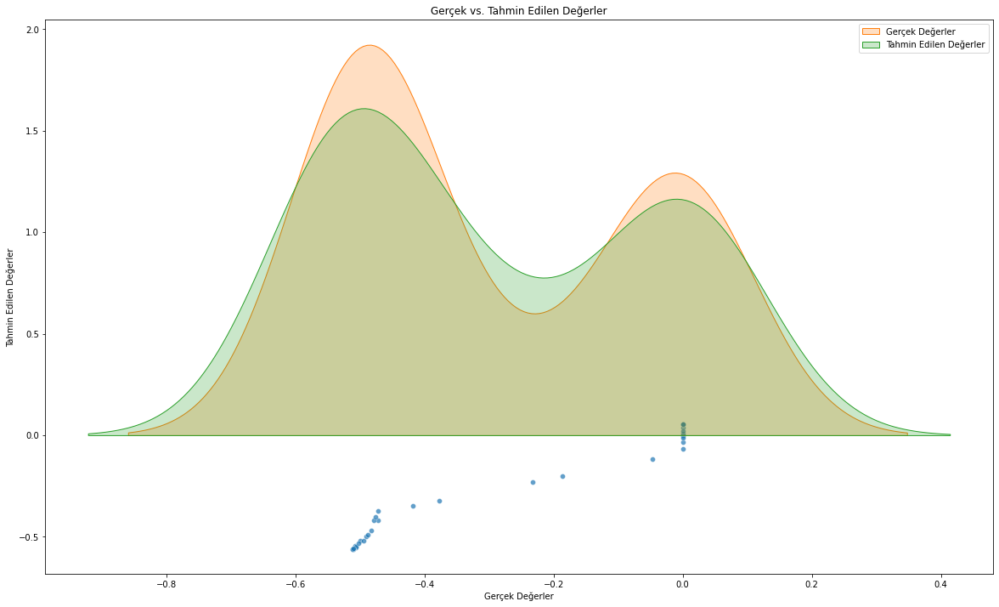

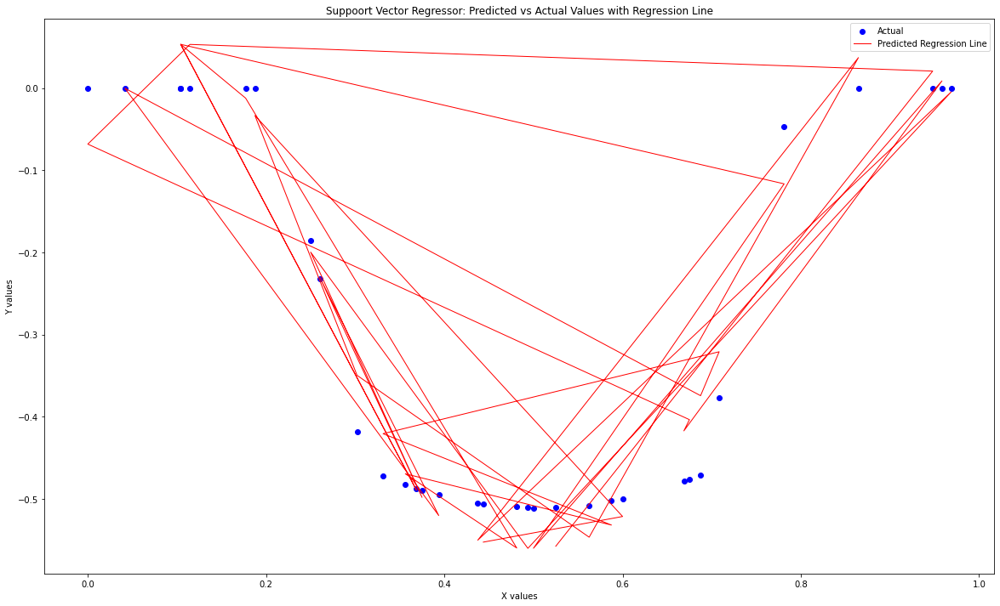

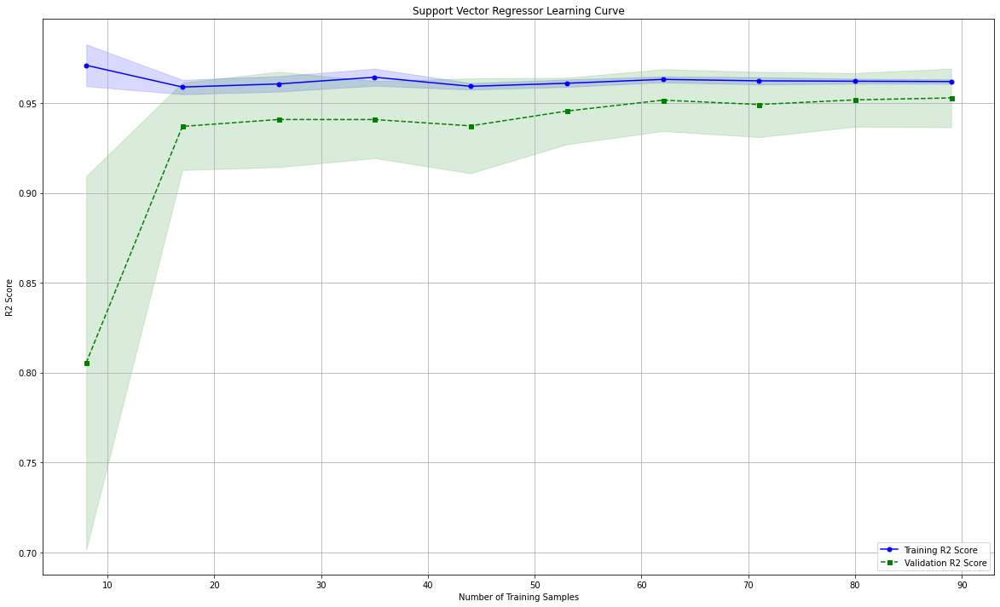

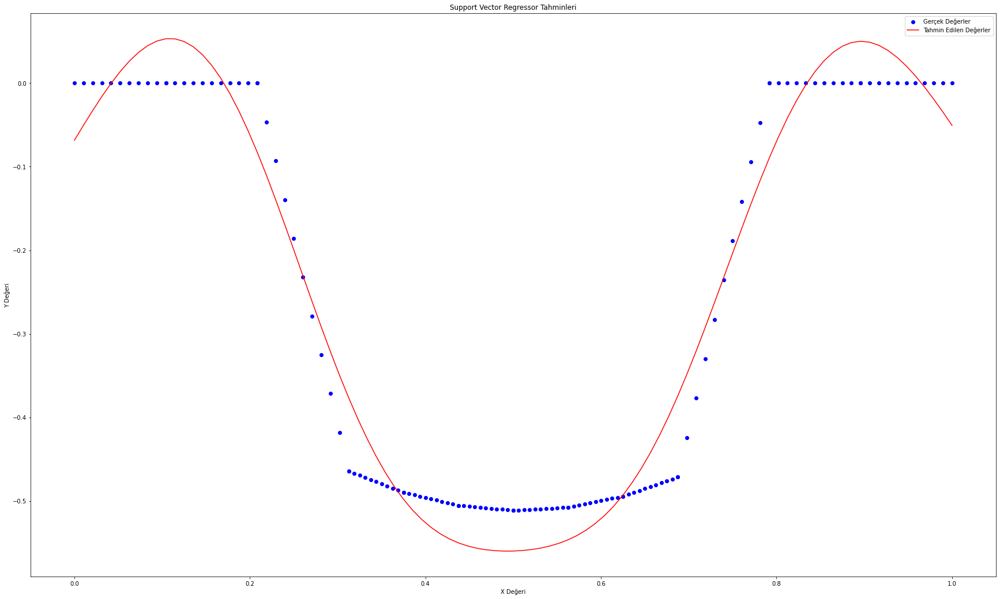

[-0.55]


In [72]:
svr_reg_M12 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_M12.fit(X_train_M12, y_train_M12)

y_pred_M12 = svr_reg_M12.predict(X_test_M12)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M12.reshape(len(y_pred_M12),1), y_test_M12.reshape(len(y_test_M12),1)),1))


print(r2_score(y_test_M12, y_pred_M12))


# Use test and show results of test set
y_hat_M12 = svr_reg_M12.predict(X_M12)
mae = metrics.mean_absolute_error(y_M12,y_hat_M12)
mse = metrics.mean_squared_error(y_M12,y_hat_M12)
mape = np.mean(np.abs((y_M12 - y_hat_M12) / y_M12)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_M12.score(X_M12,y_M12))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M12 = pd.DataFrame({'Gerçek Değerler': y_test_M12, 'Tahmin Edilen Değerler': y_pred_M12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M12 = pd.DataFrame({'Predicted': y_pred_M12, 'Actual': y_test_M12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M12, y_test_M12, color='blue', label='Actual')
plt.plot(X_test_M12, y_pred_M12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_M12, X=X_train_M12, y=y_train_M12, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()


#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M12 = np.arange(0, 1.010417, 0.010417).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M12 = svr_reg_M12.predict(X_values_M12)

# Gerçek değerler için aynı işlemi yap
y_true_values_M12 = svr_reg_M12.predict(X_M12)

plt.figure(figsize=(30, 18))
plt.scatter(X_M12, y_M12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M12, y_pred_values_M12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_M12.predict([[0.43125]])) #0.43125 ==  -5.038538e-01 gerçek değerde

### PolynomialRegressor ile deneyelim

R2 Score (Polynomial Regression):  0.9423965421037076
MAE (Polynomial Regression):  0.04621232076672413
RMSE (Polynomial Regression):  0.05510404866095399
MAPE (Polynomial Regression):  inf


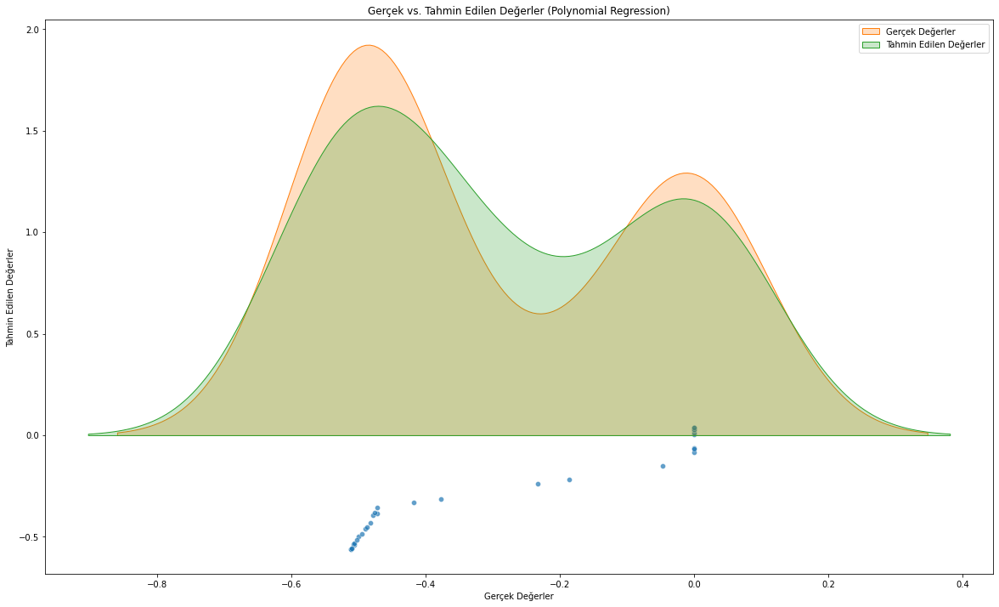

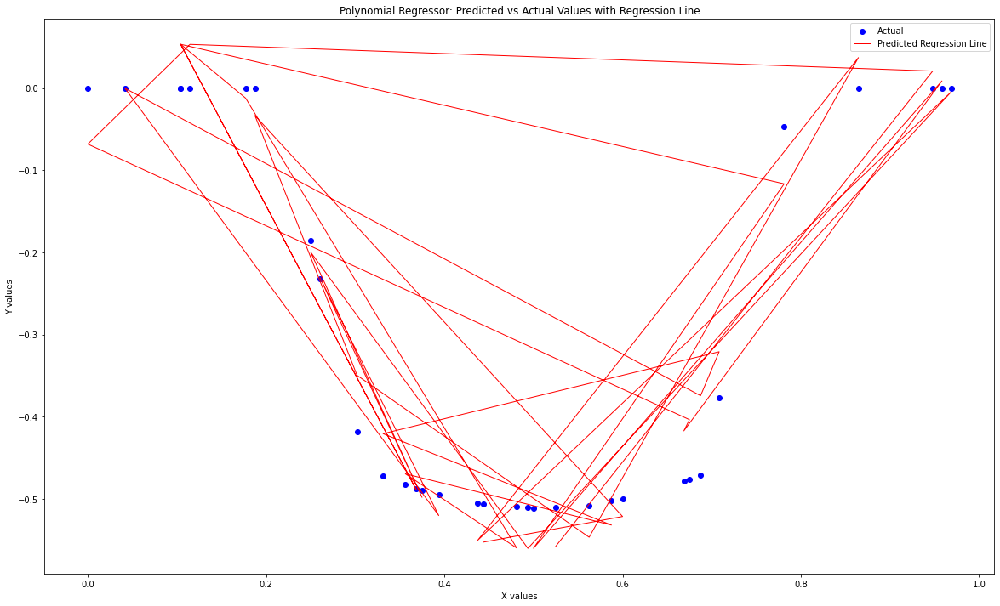

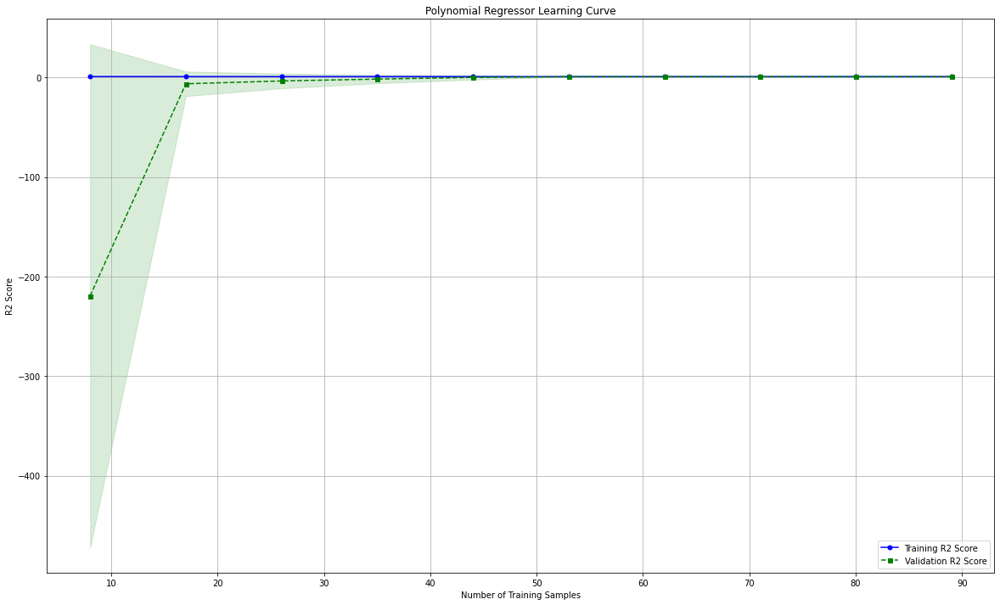

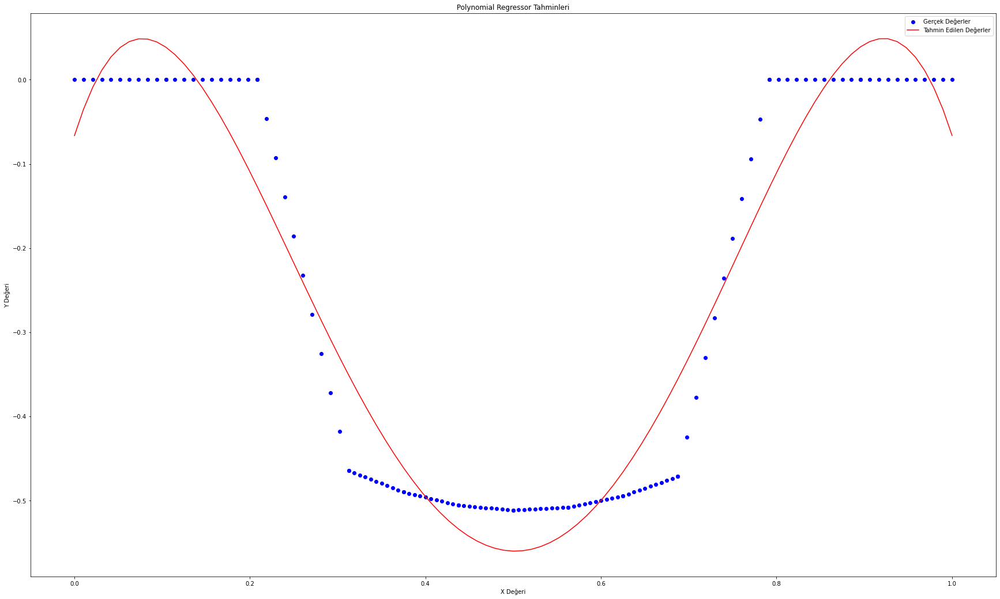

[-0.53]


In [73]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_M12 = PolynomialFeatures(degree=7)
X_poly_M12 = poly_M12.fit_transform(X_M12)

# Lineer Regresyon modeli oluşturma
poly_reg_M12 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_M12.fit(X_M12, y_M12)

# Tahminler yapma
y_pred_poly_M12 = poly_reg_M12.predict(X_test_M12)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_M12, y_pred_poly_M12))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_M12, y_pred_poly_M12))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_M12, y_pred_poly_M12)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_M12 - y_pred_poly_M12) / y_test_M12)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_M12 = pd.DataFrame({'Gerçek Değerler': y_test_M12, 'Tahmin Edilen Değerler': y_pred_poly_M12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_M12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_M12 = pd.DataFrame({'Predicted': y_pred_M12, 'Actual': y_test_M12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M12, y_test_M12, color='blue', label='Actual')
plt.plot(X_test_M12, y_pred_M12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_M12, X=X_train_M12, y=y_train_M12, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()

# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M12 = np.arange(0, 1.010417, 0.010417).reshape(-1, 1)



# Modelin tahmin ettiği değerleri al
y_pred_values_M12 = poly_reg_M12.predict(X_values_M12)

# Gerçek değerler için aynı işlemi yap
y_true_values_M12 = poly_reg_M12.predict(X_M12)

plt.figure(figsize=(30, 18))
plt.scatter(X_M12, y_M12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M12, y_pred_values_M12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_M12.predict([[0.43125]]))  #0.43125 ==  -5.038538e-01 gerçek değerde

### Multi-Layer Perceptron

In [74]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_M12, y_train_M12,epochs=100, batch_size=32, validation_split=0.25)

y_pred_M12 = mlp.predict(X_test_M12)

Epoch 1/100
3/3 [==============================] - 1s 65ms/step - loss: 0.1457 - mae: 0.3041 - val_loss: 0.1008 - val_mae: 0.2273
Epoch 2/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1439 - mae: 0.3031 - val_loss: 0.0994 - val_mae: 0.2267
Epoch 3/100
3/3 [==============================] - 0s 16ms/step - loss: 0.1420 - mae: 0.3021 - val_loss: 0.0981 - val_mae: 0.2261
Epoch 4/100
3/3 [==============================] - 0s 15ms/step - loss: 0.1403 - mae: 0.3011 - val_loss: 0.0968 - val_mae: 0.2254
Epoch 5/100
3/3 [==============================] - 0s 15ms/step - loss: 0.1385 - mae: 0.3002 - val_loss: 0.0954 - val_mae: 0.2248
Epoch 6/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1368 - mae: 0.2994 - val_loss: 0.0941 - val_mae: 0.2242
Epoch 7/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1349 - mae: 0.2981 - val_loss: 0.0929 - val_mae: 0.2236
Epoch 8/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1331 - mae: 0.29

3/3 [==============================] - 0s 13ms/step - loss: 0.0537 - mae: 0.2220 - val_loss: 0.0562 - val_mae: 0.2192
Epoch 64/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0537 - mae: 0.2213 - val_loss: 0.0567 - val_mae: 0.2195
Epoch 65/100
3/3 [==============================] - 0s 17ms/step - loss: 0.0538 - mae: 0.2209 - val_loss: 0.0570 - val_mae: 0.2197
Epoch 66/100
3/3 [==============================] - 0s 16ms/step - loss: 0.0538 - mae: 0.2205 - val_loss: 0.0571 - val_mae: 0.2198
Epoch 67/100
3/3 [==============================] - 0s 17ms/step - loss: 0.0538 - mae: 0.2204 - val_loss: 0.0572 - val_mae: 0.2198
Epoch 68/100
3/3 [==============================] - 0s 17ms/step - loss: 0.0538 - mae: 0.2203 - val_loss: 0.0572 - val_mae: 0.2198
Epoch 69/100
3/3 [==============================] - 0s 17ms/step - loss: 0.0538 - mae: 0.2202 - val_loss: 0.0573 - val_mae: 0.2199
Epoch 70/100
3/3 [==============================] - 0s 14ms/step - loss: 0.0538 - mae: 0.2201 - 

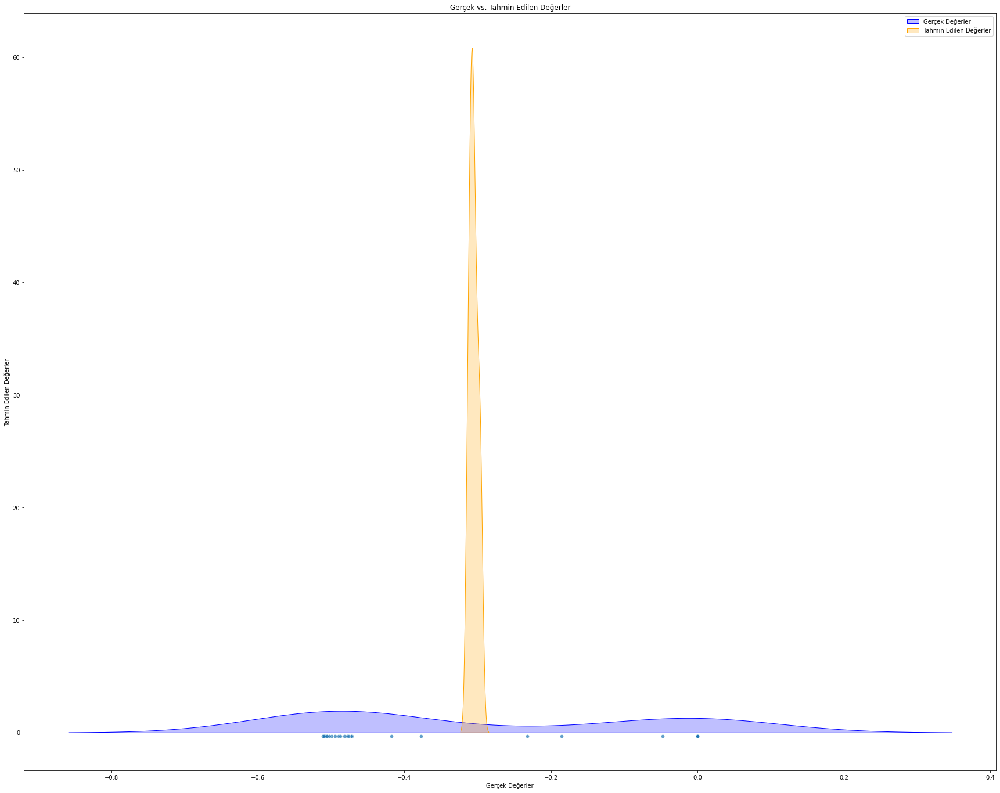

In [75]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_M12 = pd.DataFrame({'Gerçek Değerler': y_test_M12.flatten(), 'Tahmin Edilen Değerler': y_pred_M12.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M12, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
3/3 [==============================] - 0s 29ms/step - loss: 0.0538 - mae: 0.2202 - val_loss: 0.0556 - val_mae: 0.2186
Epoch 2/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0539 - mae: 0.2201 - val_loss: 0.0556 - val_mae: 0.2186
Epoch 3/50
3/3 [==============================] - 0s 15ms/step - loss: 0.0538 - mae: 0.2200 - val_loss: 0.0555 - val_mae: 0.2186
Epoch 4/50
3/3 [==============================] - 0s 15ms/step - loss: 0.0538 - mae: 0.2201 - val_loss: 0.0554 - val_mae: 0.2186
Epoch 5/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0537 - mae: 0.2201 - val_loss: 0.0553 - val_mae: 0.2185
Epoch 6/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0537 - mae: 0.2203 - val_loss: 0.0550 - val_mae: 0.2184
Epoch 7/50
3/3 [==============================] - 0s 16ms/step - loss: 0.0536 - mae: 0.2205 - val_loss: 0.0548 - val_mae: 0.2184
Epoch 8/50
3/3 [==============================] - 0s 15ms/step - loss: 0.0535 - mae: 0.2207 - val

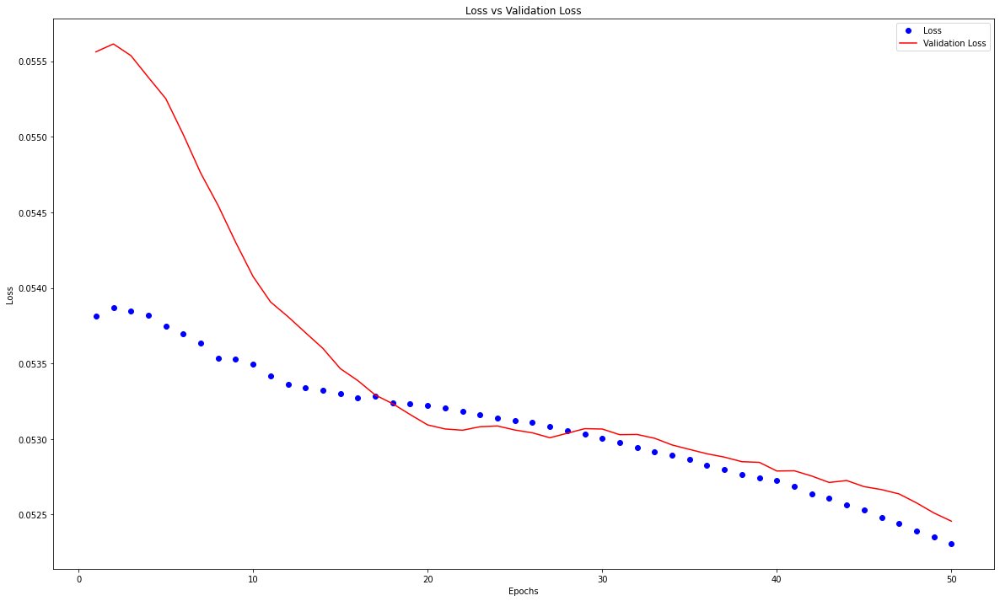

In [76]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_M12, y_train_M12, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması

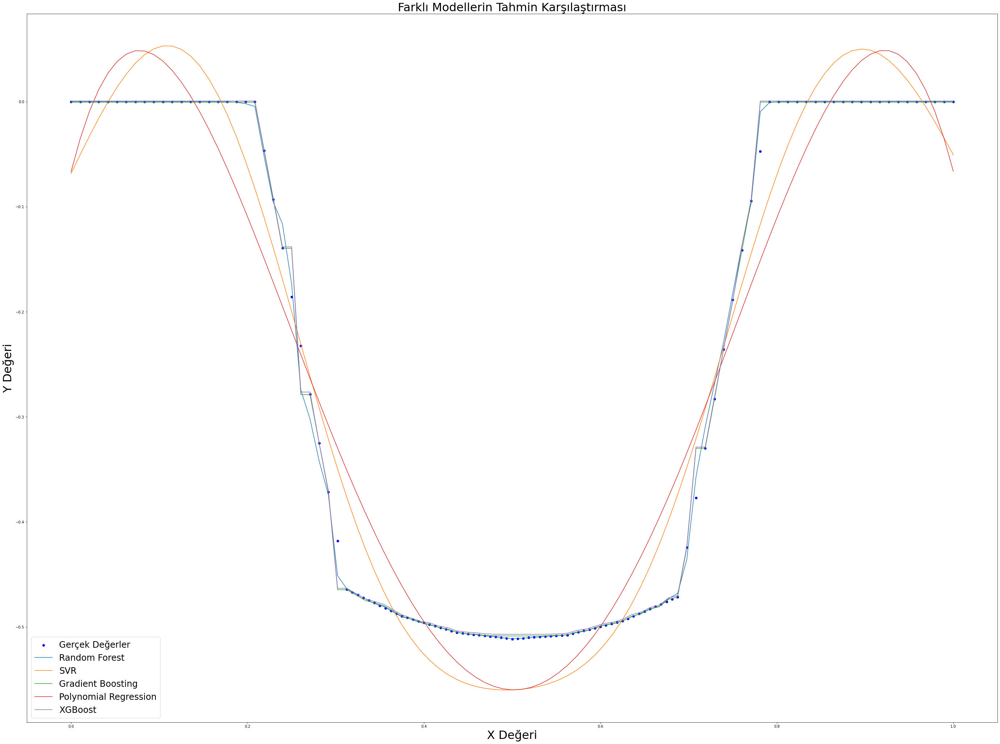

In [77]:
y_pred_rf_M12 = rf_reg_M12.predict(X_values_M12)
y_pred_svr_M12 = svr_reg_M12.predict(X_values_M12)  
y_pred_gb_M12 = gb_reg_M12.predict(X_values_M12)
y_pred_poly_M12 = poly_reg_M12.predict(X_values_M12)
y_pred_xgb_M12 = xgb_M12.predict(X_values_M12)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_M12, y_M12, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_M12, y_pred_rf_M12, label='Random Forest')
plt.plot(X_values_M12, y_pred_svr_M12, label='SVR')
plt.plot(X_values_M12, y_pred_gb_M12, label='Gradient Boosting')
plt.plot(X_values_M12, y_pred_poly_M12, label='Polynomial Regression')
plt.plot(X_values_M12, y_pred_xgb_M12, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

# M14 Verisi için Modeller

In [80]:
data_M14 = pd.read_excel('M verileri.xlsx')
data_M14 = data_M14.iloc[:, 6:8] # 6. ve 7. kolonları seçelim
data_M14

,M14_X2_iz10_imort,M14_X2_fi
0,0.000000,0.000000e+00
1,0.078125,0.000000e+00
2,0.156250,0.000000e+00
3,0.234375,0.000000e+00
4,0.312500,0.000000e+00
5,0.390625,0.000000e+00
6,0.468750,0.000000e+00
7,0.546875,0.000000e+00
8,0.625000,0.000000e+00
9,0.703125,0.000000e+00


In [81]:
data_M14 = data_M14.loc[:153,:] #154 adet veri var onları alıcaz mecbur
data_M14['M14_X2_iz10_imort'] = data_M14['M14_X2_iz10_imort'] / 10 # koordinat değerlerini / 10 yapmam gerekli
data_M14

,M14_X2_iz10_imort,M14_X2_fi
0,0.000000,0.000000e+00
1,0.007812,0.000000e+00
2,0.015625,0.000000e+00
3,0.023437,0.000000e+00
4,0.031250,0.000000e+00
5,0.039062,0.000000e+00
6,0.046875,0.000000e+00
7,0.054687,0.000000e+00
8,0.062500,0.000000e+00
9,0.070312,0.000000e+00


In [82]:
data_M14.columns[data_M14.isnull().any()]

Index([], dtype='object')

In [83]:
data_M14.isna().any()

M14_X2_iz10_imort    False
M14_X2_fi            False
dtype: bool

In [84]:
data_M14.describe()

,M14_X2_iz10_imort,M14_X2_fi
count,154.000000,1.540000e+02
mean,0.500000,-2.462853e-01
std,0.278902,2.375856e-01
min,0.000000,-5.119095e-01
25%,0.275391,-4.959069e-01
50%,0.500000,-2.341952e-01
75%,0.724609,0.000000e+00
max,1.000000,7.031259e-09


In [85]:
data_M14.shape

(154, 2)

### veri kontrol edildi, problem yok


In [86]:
X_M14 = data_M14.iloc[:, :1].values
y_M14 = data_M14.iloc[:,1].values

In [87]:
print(X_M14.tolist())

[[0.0], [0.0078124999301508], [0.0156249998603016], [0.023437499790452402], [0.0312499997206032], [0.039062499650754], [0.046874999580904804], [0.0546874995110556], [0.0624999994412064], [0.07031249937135729], [0.078124999301508], [0.07812499813735489], [0.0859374980675057], [0.0937499979976565], [0.101562497927807], [0.10937499785795798], [0.117187497788109], [0.12499999771826001], [0.13281249764841002], [0.140624997578561], [0.148437497508712], [0.156249997438863], [0.15624999627470998], [0.164062496204861], [0.171874996135011], [0.179687496065162], [0.187499995995313], [0.195312495925464], [0.203124995855615], [0.21093749578576498], [0.21874999571591597], [0.226562495646067], [0.234374995576218], [0.234374994412065], [0.242187494342215], [0.249999994272366], [0.257812494202517], [0.265624994132668], [0.273437494062819], [0.281249993992969], [0.28906249392312], [0.296874993853271], [0.30468749378342197], [0.312499993713573], [0.312499992549419], [0.318749992642552], [0.32499999273568

In [88]:
X_M14.shape, y_M14.shape

((154, 1), (154,))

In [89]:
X_train_M14, X_test_M14, y_train_M14, y_test_M14 = train_test_split(X_M14, y_M14, test_size = 0.25, random_state = 42)

### RandomForestRegressor ile deneyelim

[[ 0.00e+00  0.00e+00]
 [-5.00e-01 -5.00e-01]
 [ 2.71e-10  0.00e+00]
 [-4.82e-01 -4.81e-01]
 [-4.68e-01 -4.72e-01]
 [-5.05e-01 -5.06e-01]
 [ 0.00e+00  0.00e+00]
 [-4.65e-01 -4.67e-01]
 [-1.12e-01 -1.39e-01]
 [-4.90e-01 -4.90e-01]
 [-5.09e-01 -5.09e-01]
 [ 2.71e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [ 2.71e-10  0.00e+00]
 [-5.08e-01 -5.09e-01]
 [-5.03e-01 -5.02e-01]
 [-1.57e-02 -4.72e-02]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-3.07e-01 -2.83e-01]
 [ 0.00e+00  0.00e+00]
 [-4.02e-01 -4.18e-01]
 [ 2.71e-10  0.00e+00]
 [-5.06e-01 -5.07e-01]
 [ 2.71e-10  0.00e+00]
 [-1.30e-03  0.00e+00]
 [-4.97e-01 -4.98e-01]
 [-5.77e-03  0.00e+00]
 [-5.12e-01 -5.12e-01]
 [-5.05e-01 -5.06e-01]
 [ 2.71e-10  0.00e+00]
 [-1.39e-01 -9.44e-02]
 [-5.08e-01 -5.08e-01]
 [ 0.00e+00  0.00e+00]
 [ 2.71e-10  0.00e+00]
 [ 2.71e-10  0.00e+00]
 [-4.91e-01 -4.92e-01]
 [ 0.00e+00  0.00e+00]
 [-4.92e-01 -4.90e-01]]
0.9978927278856223
TEST SET
MAE:                 0.0023073507772937685
RMSE:                0.00654474

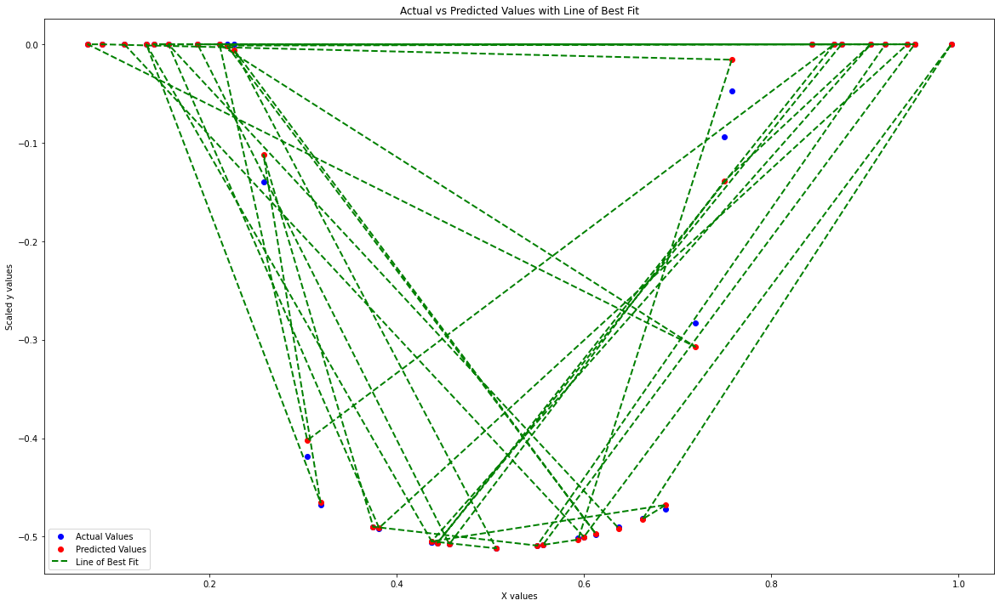

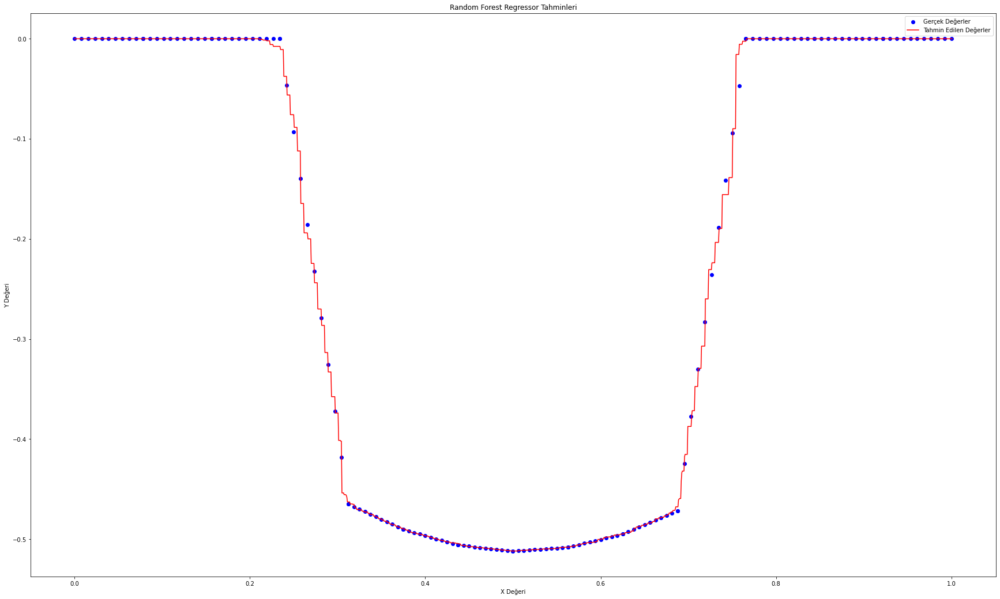

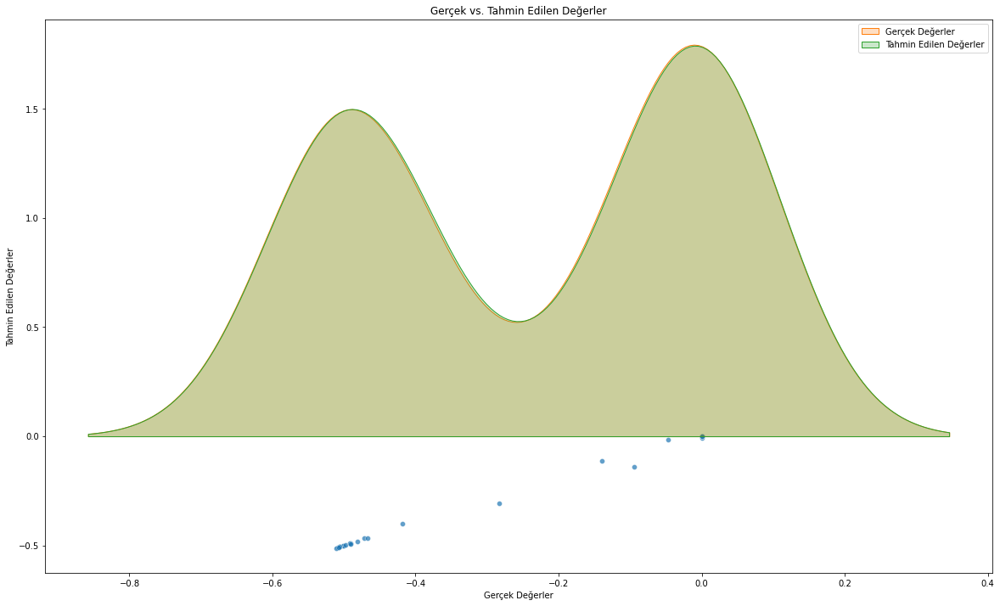

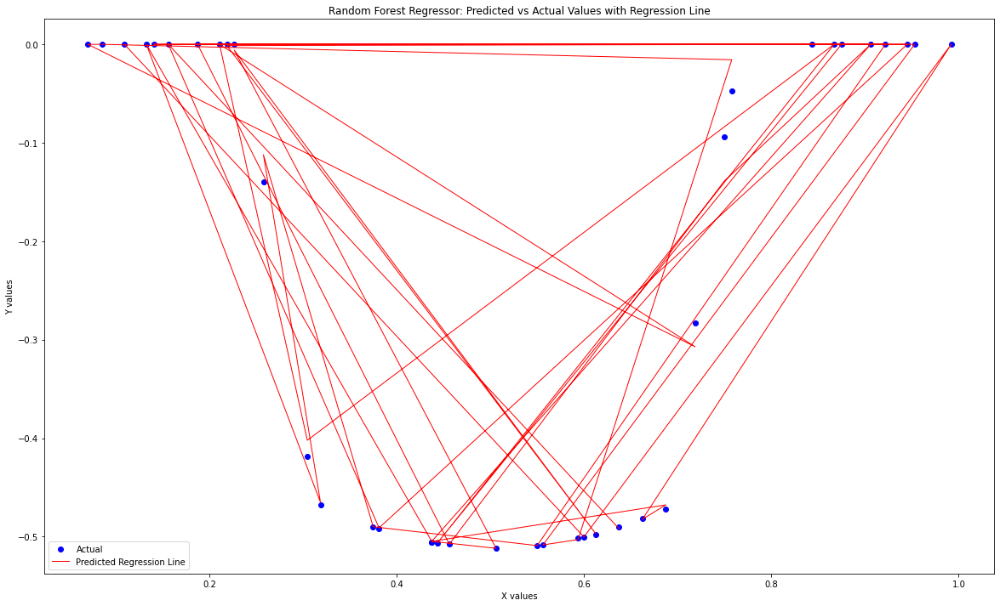

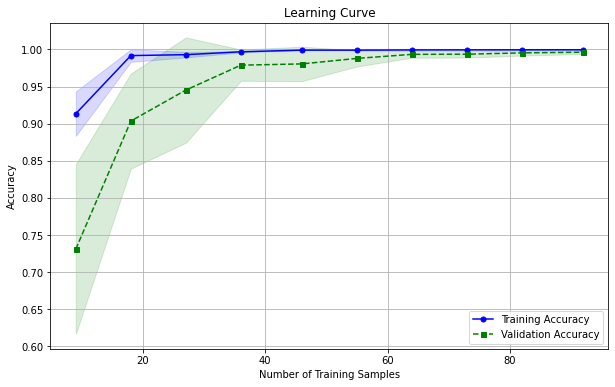

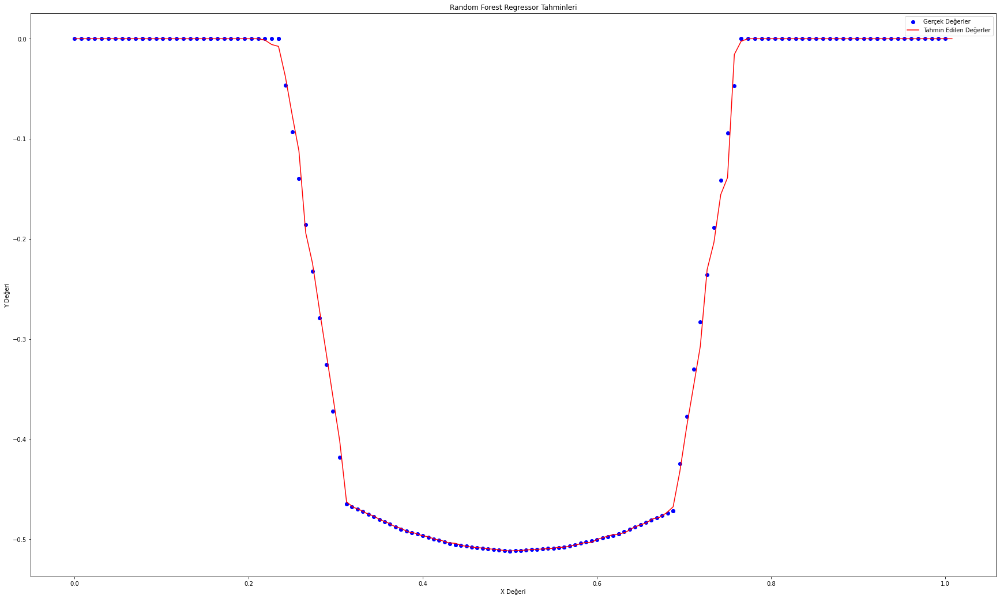

[-0.5]


In [90]:
rf_reg_M14 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_M14.fit(X_train_M14, y_train_M14)

y_pred_M14 = rf_reg_M14.predict(X_test_M14)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M14.reshape(len(y_pred_M14),1), y_test_M14.reshape(len(y_test_M14),1)),1))

print(r2_score(y_test_M14, y_pred_M14))

# Use test and show results of test set
y_hat_M14 = rf_reg_M14.predict(X_M14)
mae = metrics.mean_absolute_error(y_M14,y_hat_M14)
mse = metrics.mean_squared_error(y_M14,y_hat_M14)
mape = np.mean(np.abs((y_M14 - y_hat_M14) / y_M14)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_M14.score(X_M14,y_M14))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_M14, y_test_M14, color='blue', label='Actual Values')
plt.scatter(X_test_M14, y_pred_M14, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_M14, y_pred_M14, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M14 = np.arange(0, 1.000625, 0.000625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M14 = rf_reg_M14.predict(X_values_M14)

# Gerçek değerler için aynı işlemi yap
y_true_values_M14 = rf_reg_M14.predict(X_M14)

plt.figure(figsize=(30, 18))
plt.scatter(X_M14, y_M14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M14, y_pred_values_M14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M14 = pd.DataFrame({'Gerçek Değerler': y_test_M14, 'Tahmin Edilen Değerler': y_pred_M14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M14 = pd.DataFrame({'Predicted': y_pred_M14, 'Actual': y_test_M14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M14, y_test_M14, color='blue', label='Actual')
plt.plot(X_test_M14, y_pred_M14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_M14, X=X_train_M14, y=y_train_M14, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M14 = np.arange(0, 1.007812,0.007812).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M14 = rf_reg_M14.predict(X_values_M14)

# Gerçek değerler için aynı işlemi yap
y_true_values_M14 = rf_reg_M14.predict(X_M14)

plt.figure(figsize=(30, 18))
plt.scatter(X_M14, y_M14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M14, y_pred_values_M14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_M14.predict([[0.43125]])) #0.43125 ==  -5.043547e-01 gerçek değerde

### XGBRegressor ile deneyelim

[[ 0.    0.  ]
 [-0.5  -0.5 ]
 [ 0.    0.  ]
 [-0.48 -0.48]
 [-0.47 -0.47]
 [-0.5  -0.51]
 [ 0.    0.  ]
 [-0.47 -0.47]
 [-0.18 -0.14]
 [-0.49 -0.49]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [-0.5  -0.5 ]
 [ 0.   -0.05]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.24 -0.28]
 [ 0.    0.  ]
 [-0.46 -0.42]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.49 -0.5 ]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [-0.5  -0.51]
 [ 0.    0.  ]
 [-0.14 -0.09]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [ 0.    0.  ]
 [-0.49 -0.49]]
0.9952688256186557
TEST SET
MAE:                 0.00268748226535999
RMSE:                0.008304115997446
MAPE:                inf
r2:                  0.9987703654552467


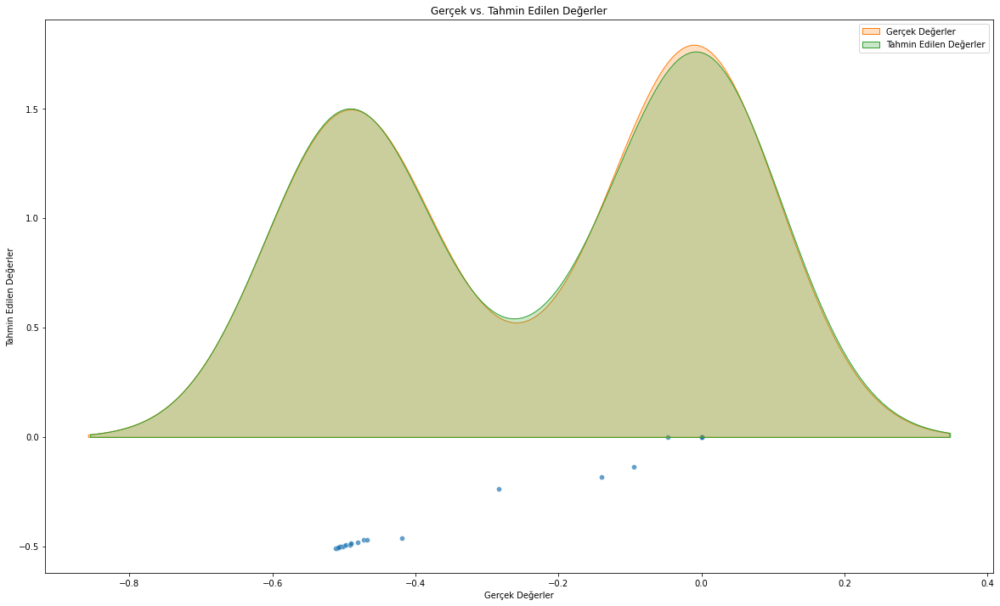

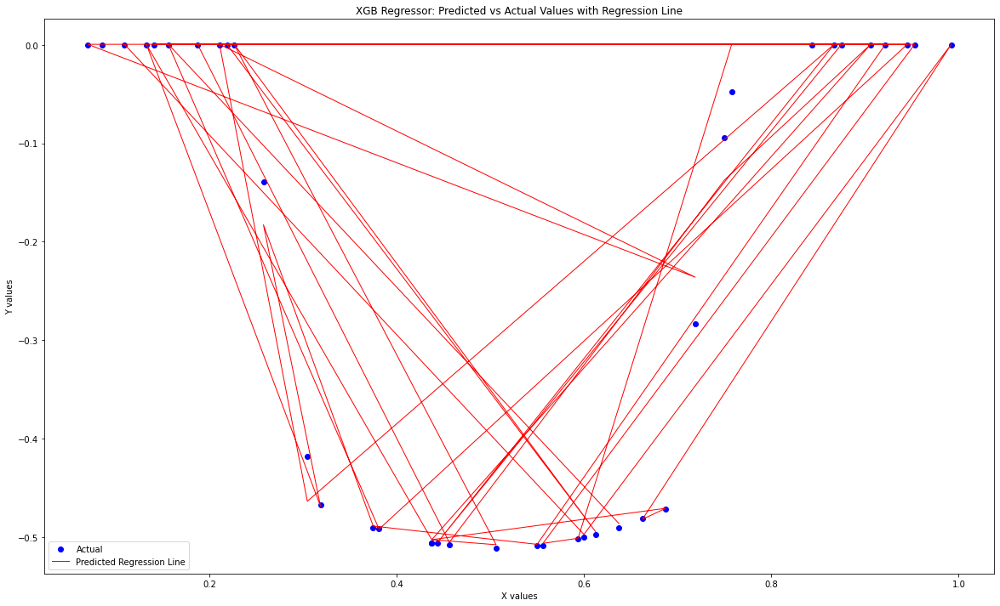

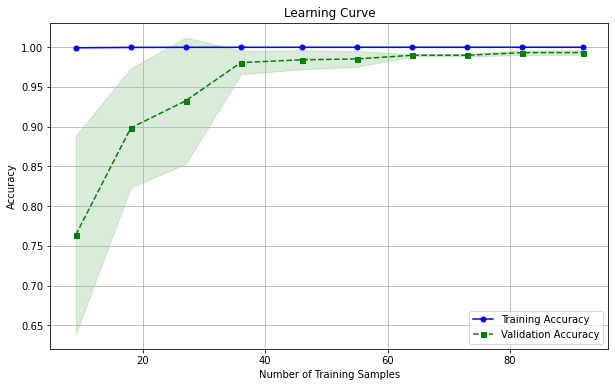

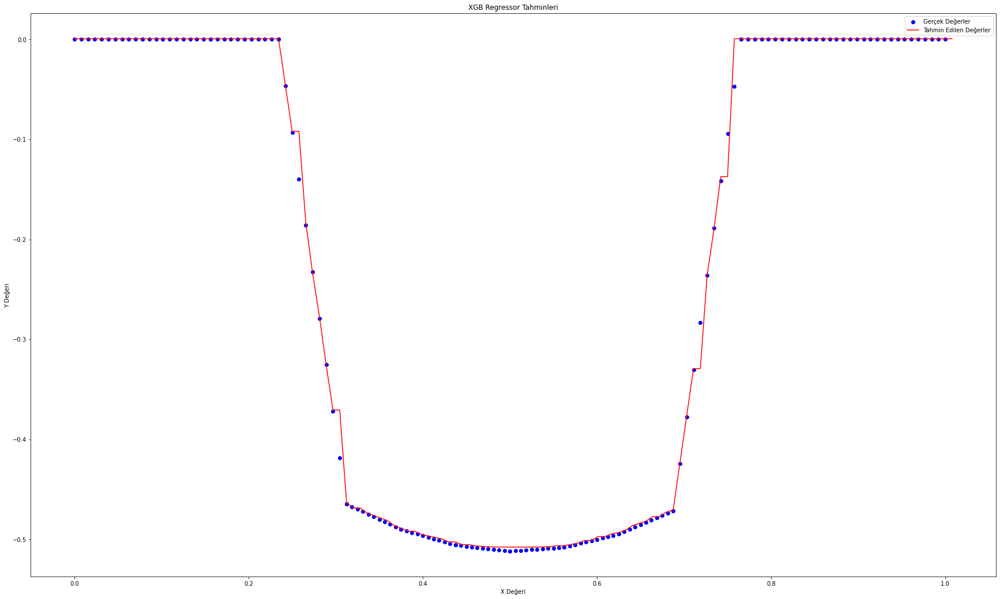

[-0.5]


In [92]:
from xgboost import XGBRegressor


xgb_M14 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_M14.fit(X_train_M14, y_train_M14)

y_pred_M14 = xgb_M14.predict(X_test_M14)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M14.reshape(len(y_pred_M14),1), y_test_M14.reshape(len(y_test_M14),1)),1))


print(r2_score(y_test_M14, y_pred_M14))

# Use test and show results of test set
y_hat_M14 = xgb_M14.predict(X_M14)
mae = metrics.mean_absolute_error(y_M14,y_hat_M14)
mse = metrics.mean_squared_error(y_M14,y_hat_M14)
mape = np.mean(np.abs((y_M14 - y_hat_M14) / y_M14)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_M14.score(X_M14,y_M14))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M14 = pd.DataFrame({'Gerçek Değerler': y_test_M14, 'Tahmin Edilen Değerler': y_pred_M14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M14 = pd.DataFrame({'Predicted': y_pred_M14, 'Actual': y_test_M14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M14, y_test_M14, color='blue', label='Actual')
plt.plot(X_test_M14, y_pred_M14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_M14, X=X_train_M14, y=y_train_M14, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M14 = np.arange(0, 1.007812,0.007812).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M14 = xgb_M14.predict(X_values_M14)

# Gerçek değerler için aynı işlemi yap
y_true_values_M14 = xgb_M14.predict(X_M14)

plt.figure(figsize=(30, 18))
plt.scatter(X_M14, y_M14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M14, y_pred_values_M14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_M14.predict([[0.43125]]))  #0.43125 ==  -5.043547e-01 gerçek değerde

### GradientBoostingRegressor deneyelim


[[-3.65e-04  0.00e+00]
 [-4.99e-01 -5.00e-01]
 [-3.30e-04  0.00e+00]
 [-4.83e-01 -4.81e-01]
 [-4.72e-01 -4.72e-01]
 [-5.04e-01 -5.06e-01]
 [-3.65e-04  0.00e+00]
 [-4.65e-01 -4.67e-01]
 [-9.31e-02 -1.39e-01]
 [-4.90e-01 -4.90e-01]
 [-5.09e-01 -5.09e-01]
 [-3.30e-04  0.00e+00]
 [-3.65e-04  0.00e+00]
 [-3.30e-04  0.00e+00]
 [-5.08e-01 -5.09e-01]
 [-5.03e-01 -5.02e-01]
 [-3.30e-04 -4.72e-02]
 [-3.65e-04  0.00e+00]
 [-3.65e-04  0.00e+00]
 [-3.31e-01 -2.83e-01]
 [-3.65e-04  0.00e+00]
 [-3.72e-01 -4.18e-01]
 [-3.30e-04  0.00e+00]
 [-5.07e-01 -5.07e-01]
 [-3.30e-04  0.00e+00]
 [-3.65e-04  0.00e+00]
 [-4.96e-01 -4.98e-01]
 [-3.65e-04  0.00e+00]
 [-5.09e-01 -5.12e-01]
 [-5.04e-01 -5.06e-01]
 [-3.30e-04  0.00e+00]
 [-1.42e-01 -9.44e-02]
 [-5.07e-01 -5.08e-01]
 [-3.65e-04  0.00e+00]
 [-3.30e-04  0.00e+00]
 [-3.30e-04  0.00e+00]
 [-4.90e-01 -4.92e-01]
 [-3.65e-04  0.00e+00]
 [-4.92e-01 -4.90e-01]]
0.9949658757114654
TEST SET
MAE:                 0.0019643176520288187
RMSE:                0.00847709

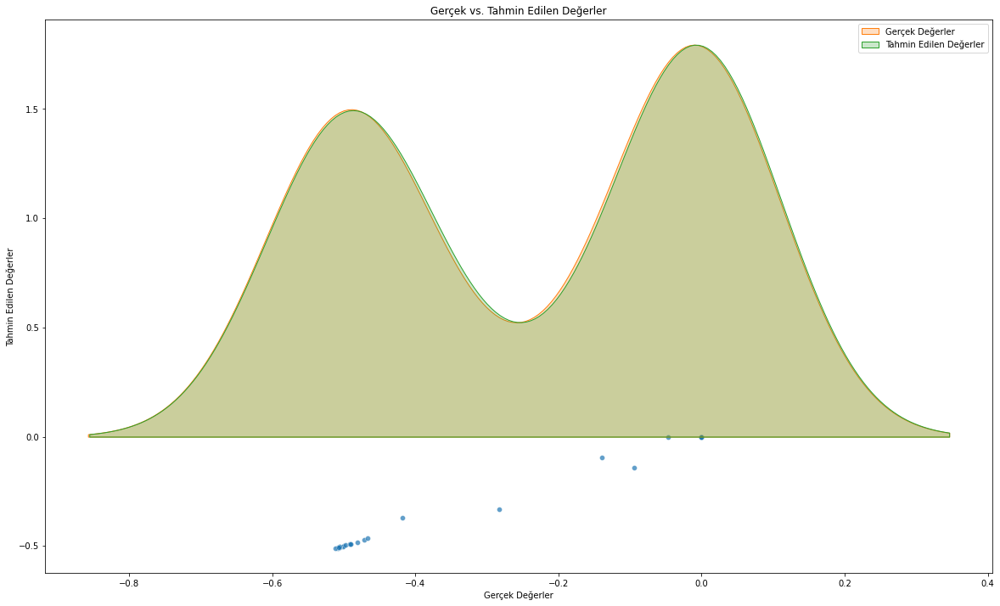

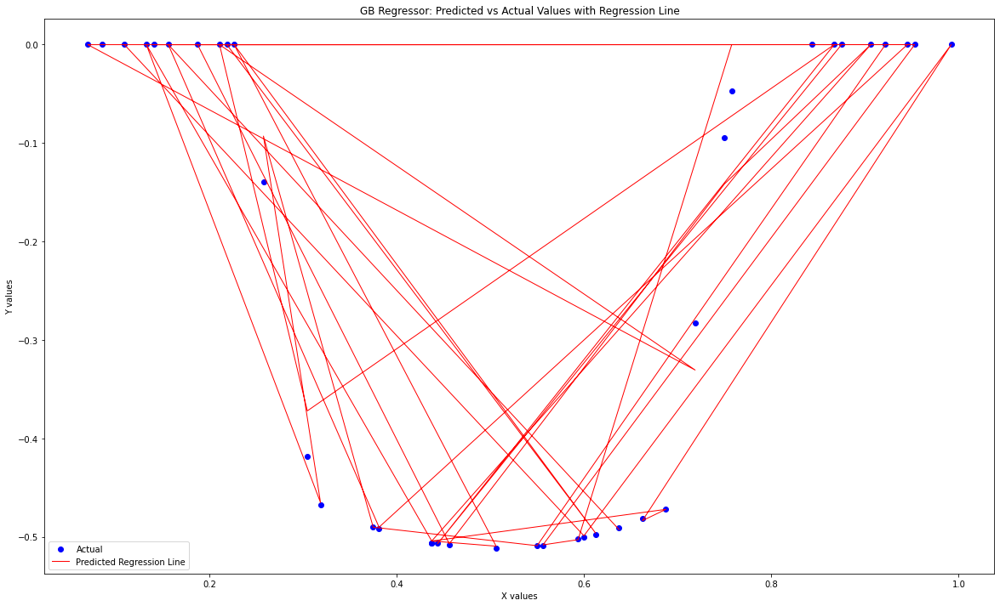

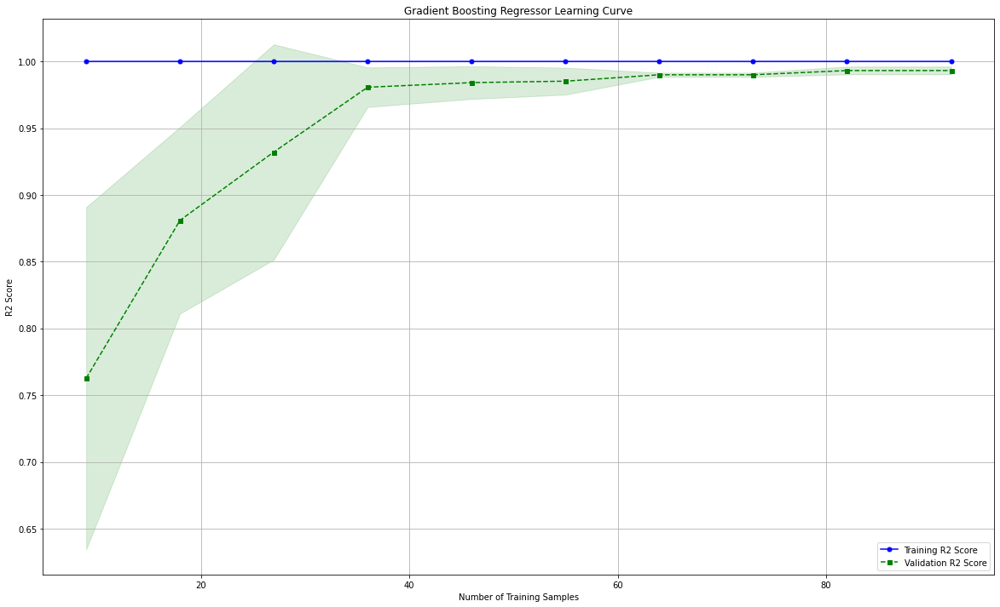

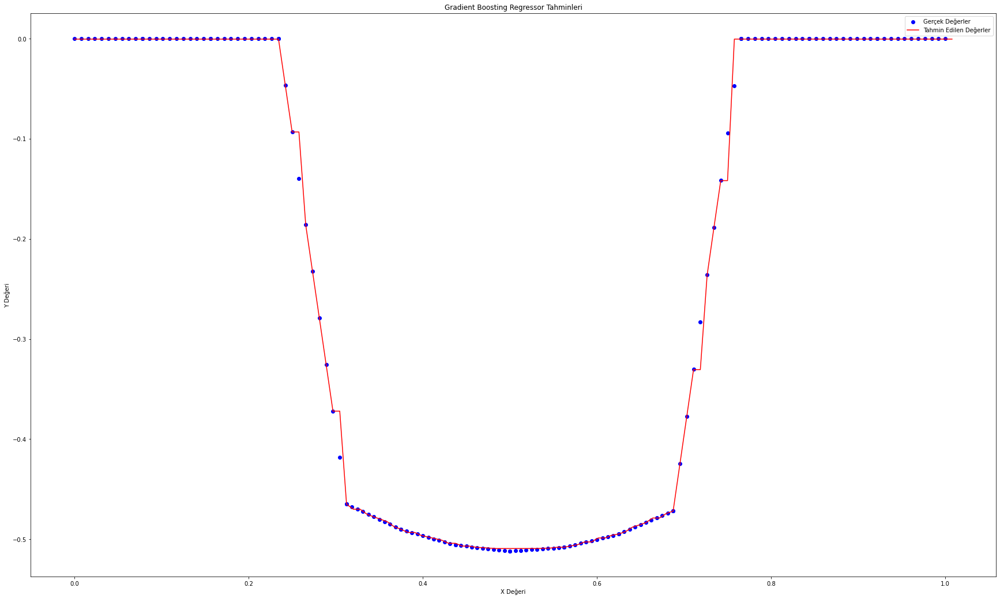

[-0.5]


In [93]:
gb_reg_M14 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_M14.fit(X_train_M14, y_train_M14)

y_pred_M14 = gb_reg_M14.predict(X_test_M14)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M14.reshape(len(y_pred_M14),1), y_test_M14.reshape(len(y_test_M14),1)),1))


print(r2_score(y_test_M14, y_pred_M14))

# Use test and show results of test set
y_hat_M14 = gb_reg_M14.predict(X_M14)
mae = metrics.mean_absolute_error(y_M14,y_hat_M14)
mse = metrics.mean_squared_error(y_M14,y_hat_M14)
mape = np.mean(np.abs((y_M14 - y_hat_M14) / y_M14)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_M14.score(X_M14,y_M14))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M14 = pd.DataFrame({'Gerçek Değerler': y_test_M14, 'Tahmin Edilen Değerler': y_pred_M14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M14 = pd.DataFrame({'Predicted': y_pred_M14, 'Actual': y_test_M14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M14, y_test_M14, color='blue', label='Actual')
plt.plot(X_test_M14, y_pred_M14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_M14, X=X_train_M14, y=y_train_M14, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()


# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M14 = np.arange(0, 1.007812,0.007812).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M14 = gb_reg_M14.predict(X_values_M14)

# Gerçek değerler için aynı işlemi yap
y_true_values_M14 = gb_reg_M14.predict(X_M14)

plt.figure(figsize=(30, 18))
plt.scatter(X_M14, y_M14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M14, y_pred_values_M14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_M14.predict([[0.43125]])) #0.43125 ==  -5.043547e-01 gerçek değerde

### SupportVectorRegressor ile deneyelim

[[ 0.05  0.  ]
 [-0.51 -0.5 ]
 [-0.04  0.  ]
 [-0.41 -0.48]
 [-0.35 -0.47]
 [-0.54 -0.51]
 [ 0.04  0.  ]
 [-0.37 -0.47]
 [-0.21 -0.14]
 [-0.48 -0.49]
 [-0.55 -0.51]
 [ 0.04  0.  ]
 [ 0.03  0.  ]
 [ 0.01  0.  ]
 [-0.55 -0.51]
 [-0.52 -0.5 ]
 [-0.16 -0.05]
 [ 0.05  0.  ]
 [ 0.04  0.  ]
 [-0.27 -0.28]
 [-0.09  0.  ]
 [-0.34 -0.42]
 [ 0.04  0.  ]
 [-0.55 -0.51]
 [ 0.05  0.  ]
 [-0.11  0.  ]
 [-0.5  -0.5 ]
 [-0.13  0.  ]
 [-0.56 -0.51]
 [-0.54 -0.51]
 [ 0.05  0.  ]
 [-0.18 -0.09]
 [-0.55 -0.51]
 [-0.04  0.  ]
 [ 0.02  0.  ]
 [ 0.02  0.  ]
 [-0.49 -0.49]
 [ 0.02  0.  ]
 [-0.46 -0.49]]
0.9393773402583844
TEST SET
MAE:                 0.04627167300578842
RMSE:                0.056783563965453296
MAPE:                inf
r2:                  0.9425044099049195


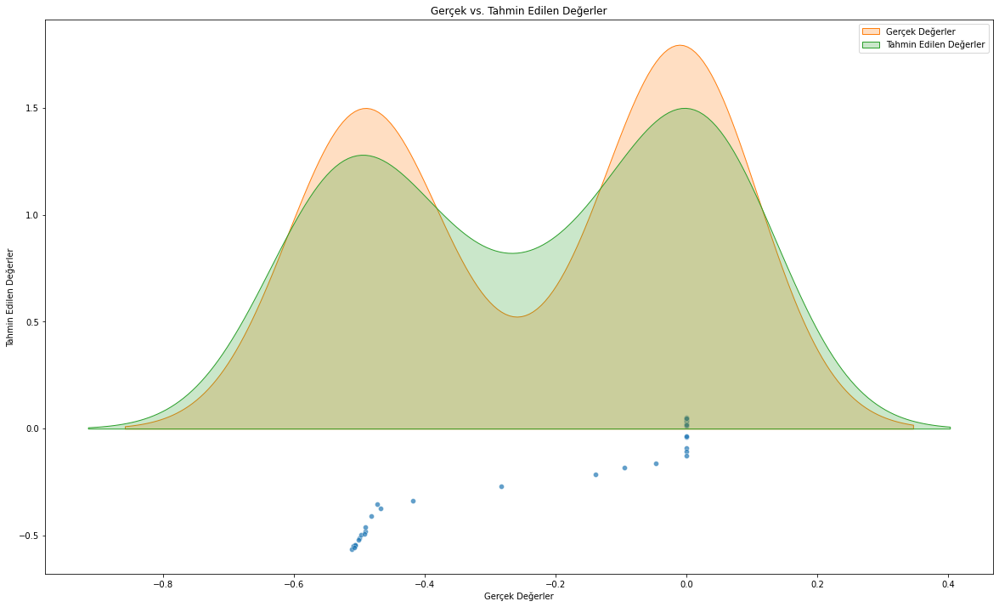

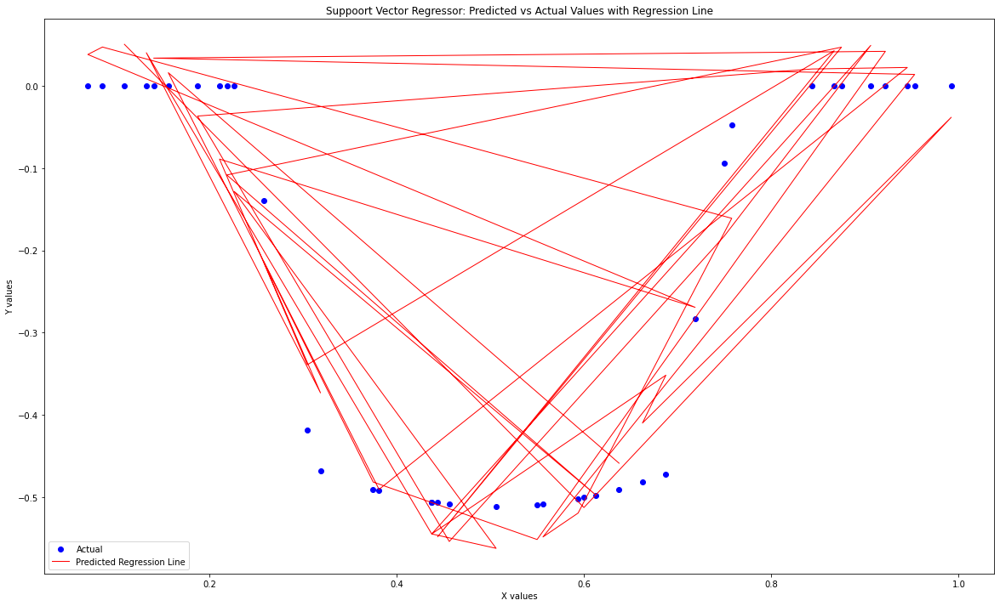

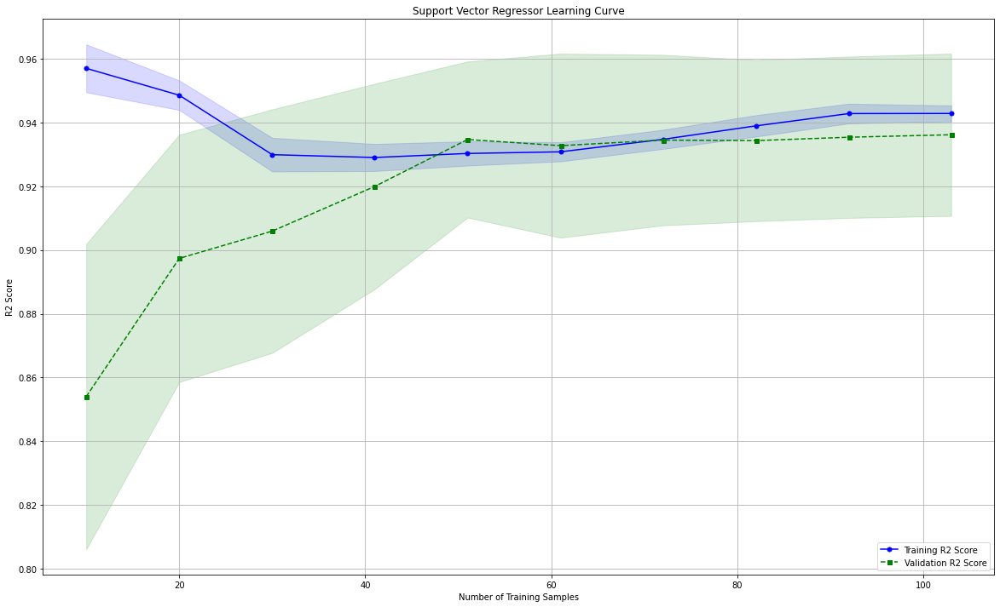

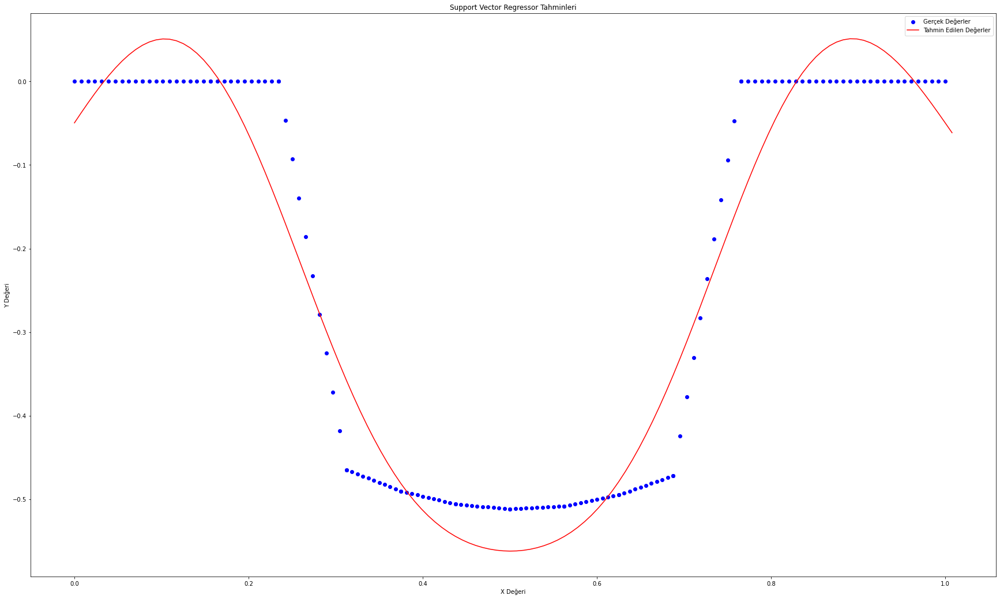

[-0.54]


In [94]:
svr_reg_M14 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_M14.fit(X_train_M14, y_train_M14)

y_pred_M14 = svr_reg_M14.predict(X_test_M14)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M14.reshape(len(y_pred_M14),1), y_test_M14.reshape(len(y_test_M14),1)),1))


print(r2_score(y_test_M14, y_pred_M14))


# Use test and show results of test set
y_hat_M14 = svr_reg_M14.predict(X_M14)
mae = metrics.mean_absolute_error(y_M14,y_hat_M14)
mse = metrics.mean_squared_error(y_M14,y_hat_M14)
mape = np.mean(np.abs((y_M14 - y_hat_M14) / y_M14)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_M14.score(X_M14,y_M14))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M14 = pd.DataFrame({'Gerçek Değerler': y_test_M14, 'Tahmin Edilen Değerler': y_pred_M14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M14 = pd.DataFrame({'Predicted': y_pred_M14, 'Actual': y_test_M14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M14, y_test_M14, color='blue', label='Actual')
plt.plot(X_test_M14, y_pred_M14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_M14, X=X_train_M14, y=y_train_M14, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()


#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M14 = np.arange(0, 1.007812,0.007812).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M14 = svr_reg_M14.predict(X_values_M14)

# Gerçek değerler için aynı işlemi yap
y_true_values_M14 = svr_reg_M14.predict(X_M14)

plt.figure(figsize=(30, 18))
plt.scatter(X_M14, y_M14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M14, y_pred_values_M14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_M14.predict([[0.43125]]))  #0.43125 ==  -5.043547e-01 gerçek değerde

### PolynomialRegressor ile deneyelim

R2 Score (Polynomial Regression):  0.9282791865397814
MAE (Polynomial Regression):  0.0504387734880938
RMSE (Polynomial Regression):  0.06348160796569881
MAPE (Polynomial Regression):  inf


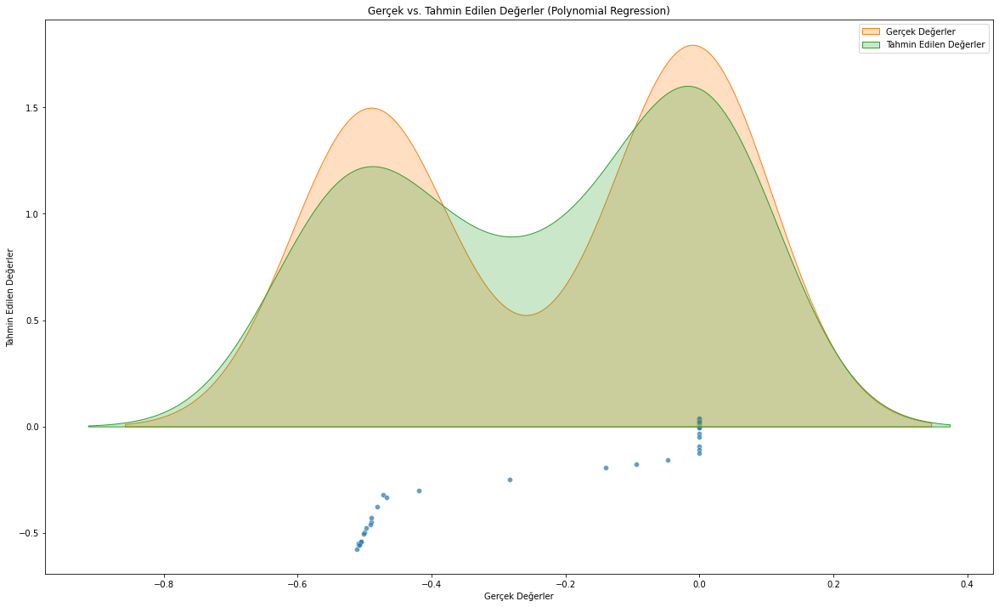

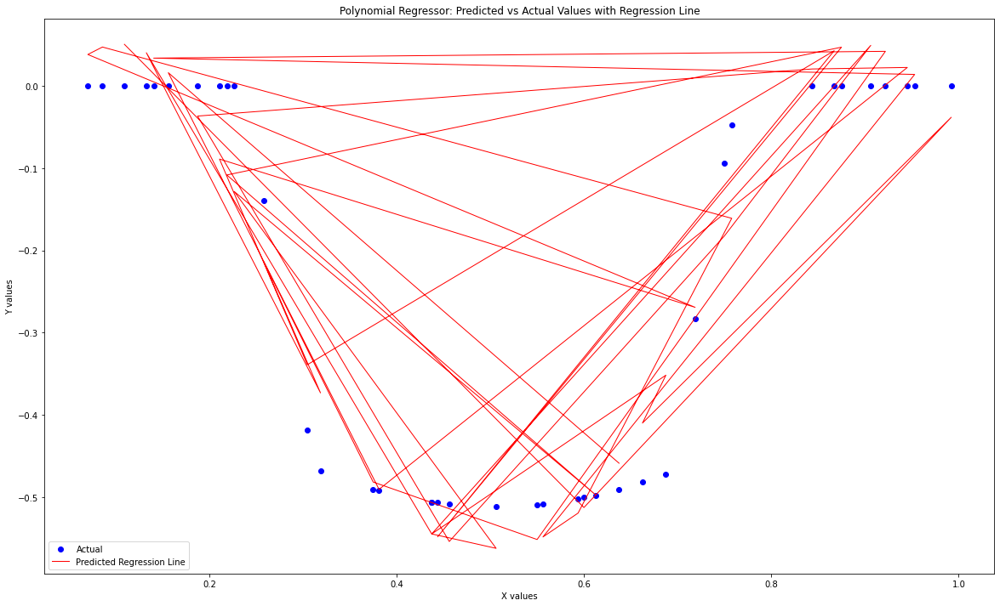

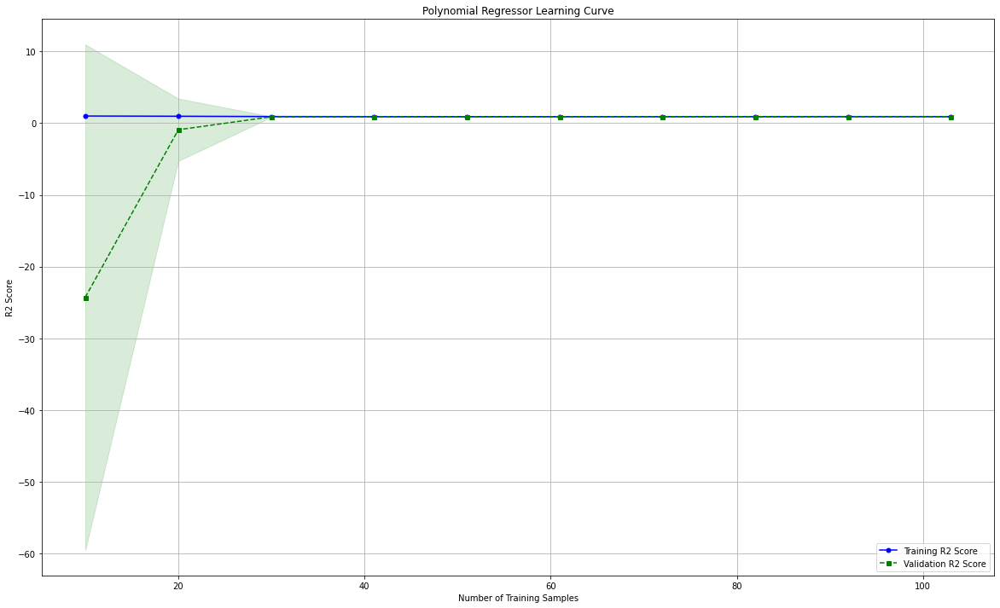

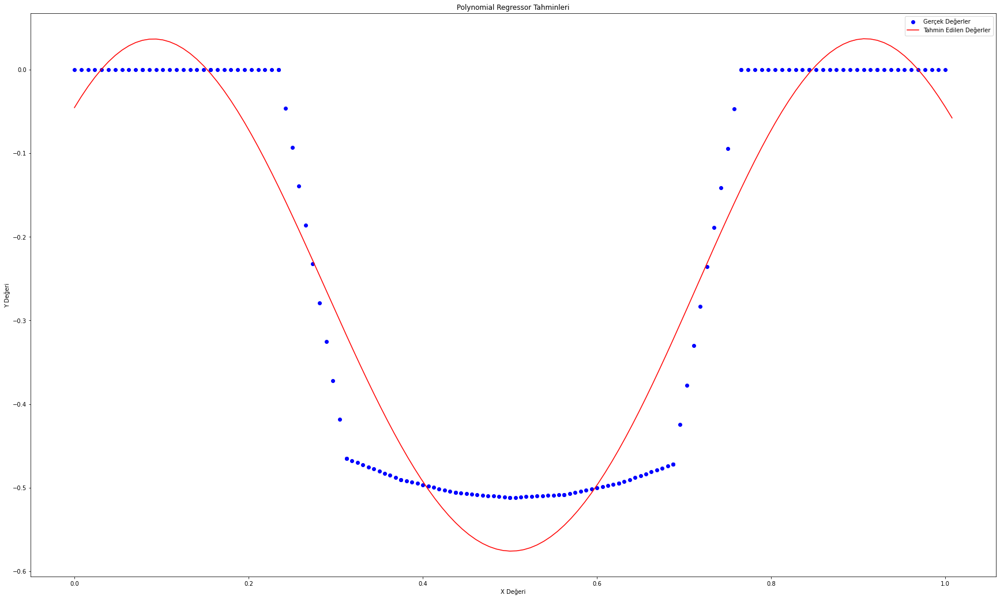

[-0.53]


In [95]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_M14 = PolynomialFeatures(degree=7)
X_poly_M14 = poly_M14.fit_transform(X_M14)

# Lineer Regresyon modeli oluşturma
poly_reg_M14 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_M14.fit(X_M14, y_M14)

# Tahminler yapma
y_pred_poly_M14 = poly_reg_M14.predict(X_test_M14)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_M14, y_pred_poly_M14))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_M14, y_pred_poly_M14))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_M14, y_pred_poly_M14)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_M14 - y_pred_poly_M14) / y_test_M14)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_M14 = pd.DataFrame({'Gerçek Değerler': y_test_M14, 'Tahmin Edilen Değerler': y_pred_poly_M14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_M14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_M14 = pd.DataFrame({'Predicted': y_pred_M14, 'Actual': y_test_M14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M14, y_test_M14, color='blue', label='Actual')
plt.plot(X_test_M14, y_pred_M14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_M14, X=X_train_M14, y=y_train_M14, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()



# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M14 = np.arange(0, 1.007812,0.007812).reshape(-1, 1)



# Modelin tahmin ettiği değerleri al
y_pred_values_M14 = poly_reg_M14.predict(X_values_M14)

# Gerçek değerler için aynı işlemi yap
y_true_values_M14 = poly_reg_M14.predict(X_M14)

plt.figure(figsize=(30, 18))
plt.scatter(X_M14, y_M14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M14, y_pred_values_M14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_M14.predict([[0.43125]]))  #0.43125 ==  -5.043547e-01 gerçek değerde

### Multi-Layer Perceptron

In [96]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_M14, y_train_M14,epochs=100, batch_size=32, validation_split=0.25)

y_pred_M14 = mlp.predict(X_test_M14)

Epoch 1/100
3/3 [==============================] - 1s 61ms/step - loss: 0.1161 - mae: 0.2467 - val_loss: 0.1269 - val_mae: 0.2677
Epoch 2/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1144 - mae: 0.2461 - val_loss: 0.1252 - val_mae: 0.2672
Epoch 3/100
3/3 [==============================] - 0s 15ms/step - loss: 0.1129 - mae: 0.2460 - val_loss: 0.1235 - val_mae: 0.2666
Epoch 4/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1115 - mae: 0.2456 - val_loss: 0.1218 - val_mae: 0.2660
Epoch 5/100
3/3 [==============================] - 0s 15ms/step - loss: 0.1098 - mae: 0.2451 - val_loss: 0.1202 - val_mae: 0.2655
Epoch 6/100
3/3 [==============================] - 0s 17ms/step - loss: 0.1083 - mae: 0.2447 - val_loss: 0.1185 - val_mae: 0.2649
Epoch 7/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1068 - mae: 0.2444 - val_loss: 0.1168 - val_mae: 0.2643
Epoch 8/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1053 - mae: 0.24

3/3 [==============================] - 0s 14ms/step - loss: 0.0554 - mae: 0.2290 - val_loss: 0.0571 - val_mae: 0.2342
Epoch 64/100
3/3 [==============================] - 0s 14ms/step - loss: 0.0554 - mae: 0.2290 - val_loss: 0.0571 - val_mae: 0.2341
Epoch 65/100
3/3 [==============================] - 0s 14ms/step - loss: 0.0554 - mae: 0.2290 - val_loss: 0.0571 - val_mae: 0.2341
Epoch 66/100
3/3 [==============================] - 0s 16ms/step - loss: 0.0554 - mae: 0.2289 - val_loss: 0.0571 - val_mae: 0.2341
Epoch 67/100
3/3 [==============================] - 0s 16ms/step - loss: 0.0554 - mae: 0.2289 - val_loss: 0.0571 - val_mae: 0.2341
Epoch 68/100
3/3 [==============================] - 0s 16ms/step - loss: 0.0554 - mae: 0.2290 - val_loss: 0.0571 - val_mae: 0.2341
Epoch 69/100
3/3 [==============================] - 0s 16ms/step - loss: 0.0554 - mae: 0.2290 - val_loss: 0.0571 - val_mae: 0.2341
Epoch 70/100
3/3 [==============================] - 0s 16ms/step - loss: 0.0554 - mae: 0.2289 - 

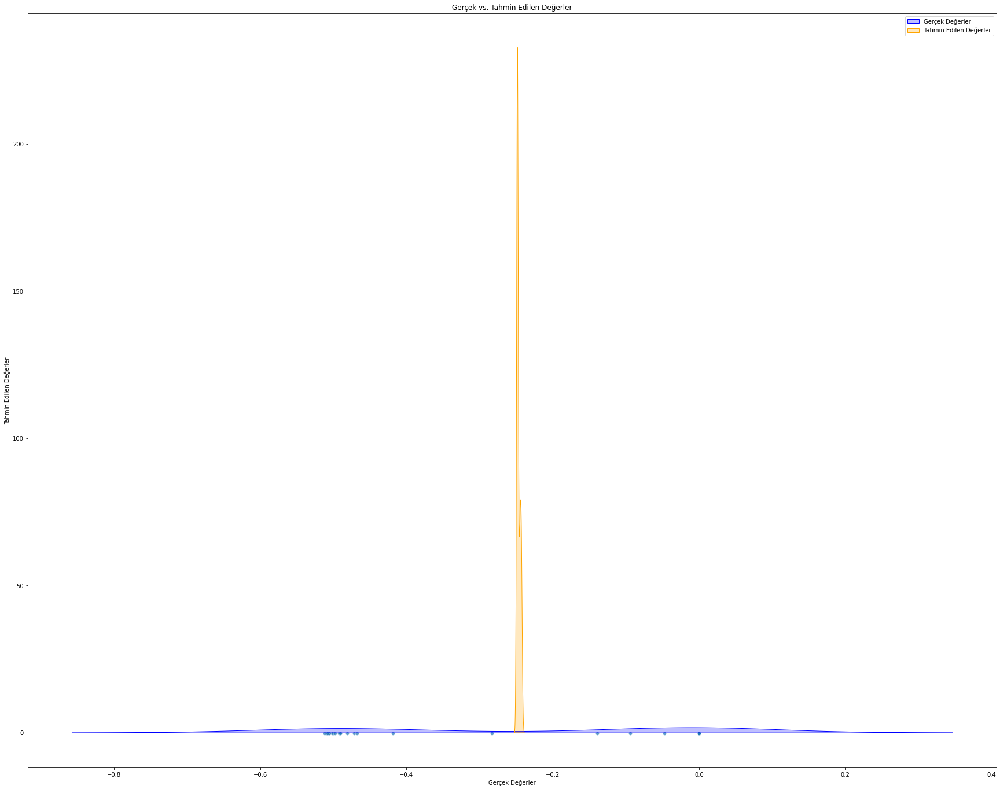

In [97]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_M14 = pd.DataFrame({'Gerçek Değerler': y_test_M14.flatten(), 'Tahmin Edilen Değerler': y_pred_M14.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M14, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
4/4 [==============================] - 0s 20ms/step - loss: 0.0552 - mae: 0.2290 - val_loss: 0.0570 - val_mae: 0.2328
Epoch 2/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0552 - mae: 0.2289 - val_loss: 0.0569 - val_mae: 0.2327
Epoch 3/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0551 - mae: 0.2288 - val_loss: 0.0570 - val_mae: 0.2328
Epoch 4/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0551 - mae: 0.2287 - val_loss: 0.0572 - val_mae: 0.2331
Epoch 5/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0550 - mae: 0.2286 - val_loss: 0.0573 - val_mae: 0.2331
Epoch 6/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0550 - mae: 0.2285 - val_loss: 0.0573 - val_mae: 0.2332
Epoch 7/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0550 - mae: 0.2284 - val_loss: 0.0575 - val_mae: 0.2333
Epoch 8/50
4/4 [==============================] - 0s 12ms/step - loss: 0.0550 - mae: 0.2285 - val_

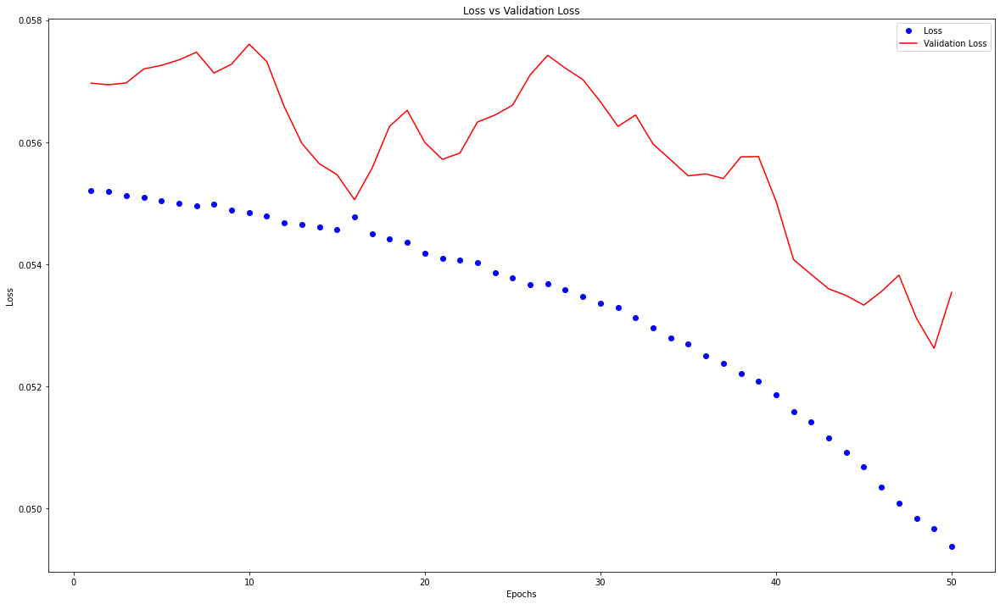

In [98]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_M14, y_train_M14, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması

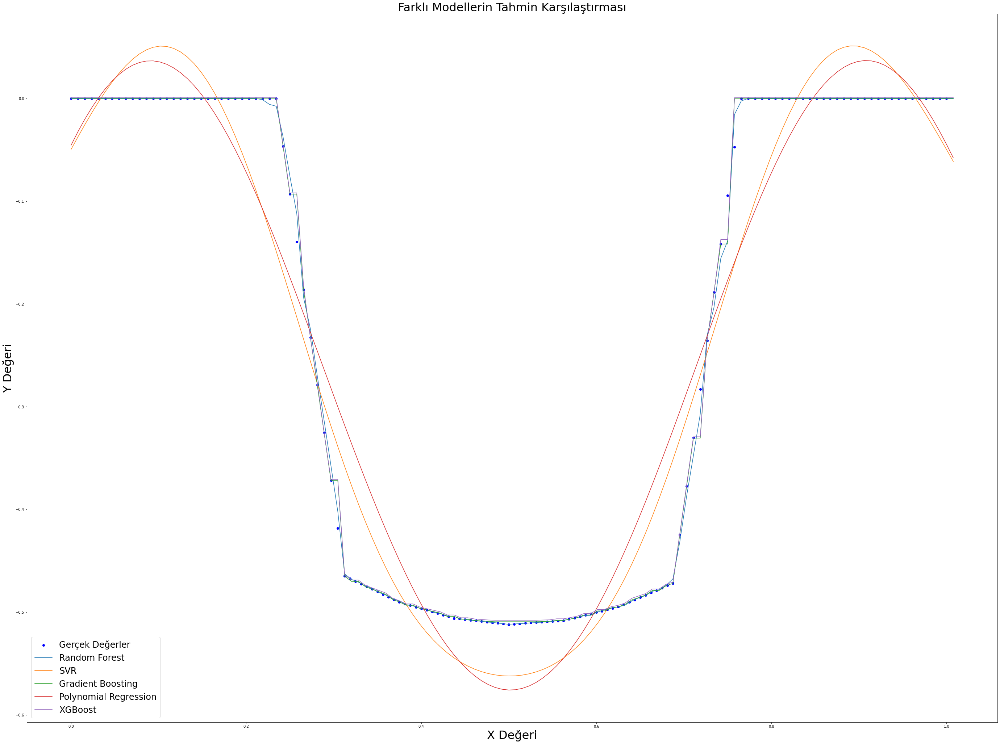

In [99]:
y_pred_rf_M14 = rf_reg_M14.predict(X_values_M14)
y_pred_svr_M14 = svr_reg_M14.predict(X_values_M14)  
y_pred_gb_M14 = gb_reg_M14.predict(X_values_M14)
y_pred_poly_M14 = poly_reg_M14.predict(X_values_M14)
y_pred_xgb_M14 = xgb_M14.predict(X_values_M14)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_M14, y_M14, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_M14, y_pred_rf_M14, label='Random Forest')
plt.plot(X_values_M14, y_pred_svr_M14, label='SVR')
plt.plot(X_values_M14, y_pred_gb_M14, label='Gradient Boosting')
plt.plot(X_values_M14, y_pred_poly_M14, label='Polynomial Regression')
plt.plot(X_values_M14, y_pred_xgb_M14, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

# M16 Verisi için Modeller

In [101]:
data_M16 = pd.read_excel('M verileri.xlsx')
data_M16 = data_M16.iloc[:, 8:10] # 9. ve 10. kolonları seçelim
data_M16

,M16_X2_iz10_imort,M16_X2_fi
0,0.0000,0.000000e+00
1,0.0625,0.000000e+00
2,0.1250,0.000000e+00
3,0.1875,0.000000e+00
4,0.2500,0.000000e+00
5,0.3125,0.000000e+00
6,0.3750,0.000000e+00
7,0.4375,0.000000e+00
8,0.5000,0.000000e+00
9,0.5625,0.000000e+00


In [102]:
#data_M16 = data_M16.loc[:153,:] #154 adet veri var onları alıcaz mecbur
data_M16['M16_X2_iz10_imort'] = data_M16['M16_X2_iz10_imort'] / 10 # koordinat değerlerini / 10 yapmam gerekli
data_M16

,M16_X2_iz10_imort,M16_X2_fi
0,0.00000,0.000000e+00
1,0.00625,0.000000e+00
2,0.01250,0.000000e+00
3,0.01875,0.000000e+00
4,0.02500,0.000000e+00
5,0.03125,0.000000e+00
6,0.03750,0.000000e+00
7,0.04375,0.000000e+00
8,0.05000,0.000000e+00
9,0.05625,0.000000e+00


In [103]:
data_M16.columns[data_M16.isnull().any()]

Index([], dtype='object')

In [104]:
data_M16.isna().any()

M16_X2_iz10_imort    False
M16_X2_fi            False
dtype: bool

In [105]:
data_M16.describe()

,M16_X2_iz10_imort,M16_X2_fi
count,176.000000,1.760000e+02
mean,0.500000,-2.155989e-01
std,0.289612,2.368006e-01
min,0.000000,-5.121463e-01
25%,0.250000,-4.922442e-01
50%,0.500000,0.000000e+00
75%,0.750000,0.000000e+00
max,1.000000,7.034451e-09


In [106]:
data_M16.shape

(176, 2)

### veri kontrol edildi, problem yok


In [107]:
X_M16 = data_M16.iloc[:, :1].values
y_M16 = data_M16.iloc[:,1].values

In [108]:
X_train_M16, X_test_M16, y_train_M16, y_test_M16 = train_test_split(X_M16, y_M16, test_size = 0.25, random_state = 42)

### RandomForestRegressor ile deneyelim


[[ 0.00e+00  0.00e+00]
 [-1.53e-02 -4.65e-02]
 [ 2.26e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.90e-01 -4.92e-01]
 [ 0.00e+00  0.00e+00]
 [-4.67e-01 -4.74e-01]
 [ 2.26e-10  0.00e+00]
 [-4.95e-01 -4.95e-01]
 [ 2.26e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [-5.58e-04  0.00e+00]
 [-4.71e-01 -4.77e-01]
 [ 0.00e+00  0.00e+00]
 [-4.94e-01 -4.93e-01]
 [-4.89e-01 -4.88e-01]
 [-5.09e-01 -5.09e-01]
 [ 0.00e+00  0.00e+00]
 [-4.86e-01 -4.86e-01]
 [ 0.00e+00  0.00e+00]
 [-4.88e-01 -4.90e-01]
 [-4.77e-01 -4.78e-01]
 [ 2.26e-10  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [-4.80e-01 -4.79e-01]
 [-4.88e-01 -4.90e-01]
 [-5.12e-01 -5.11e-01]
 [-4.52e-01 -4.65e-01]
 [ 0.00e+00  0.00e+00]
 [-2.11e-01 -1.89e-01]
 [ 2.26e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-1.12e-03  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [-5.08e-01 -5.08e-01]
 [ 2.26e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.97e-01 -4.96e-01]
 [-5.11e-01 -5.11e-01]
 [-4.95e-01

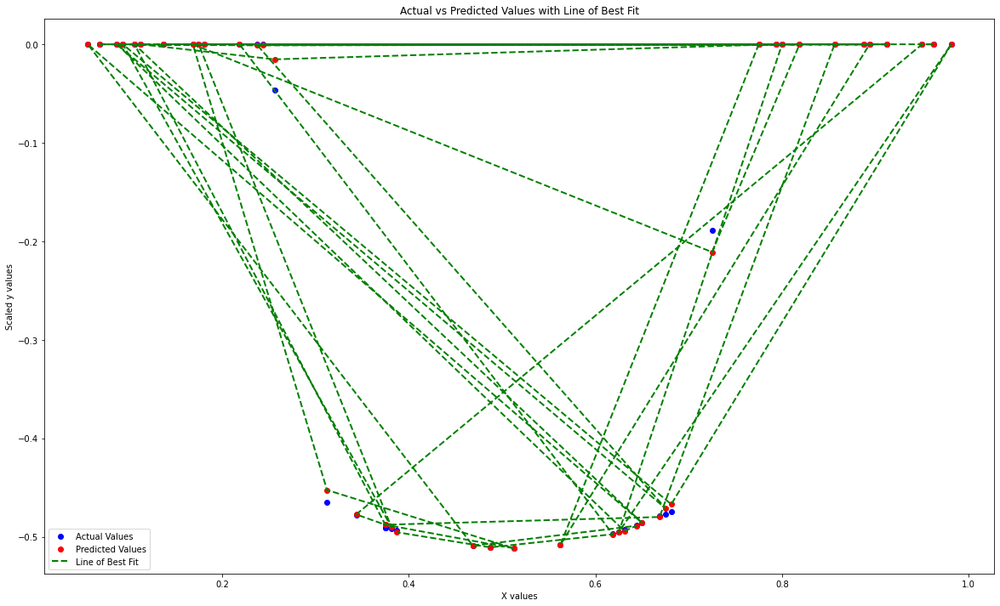

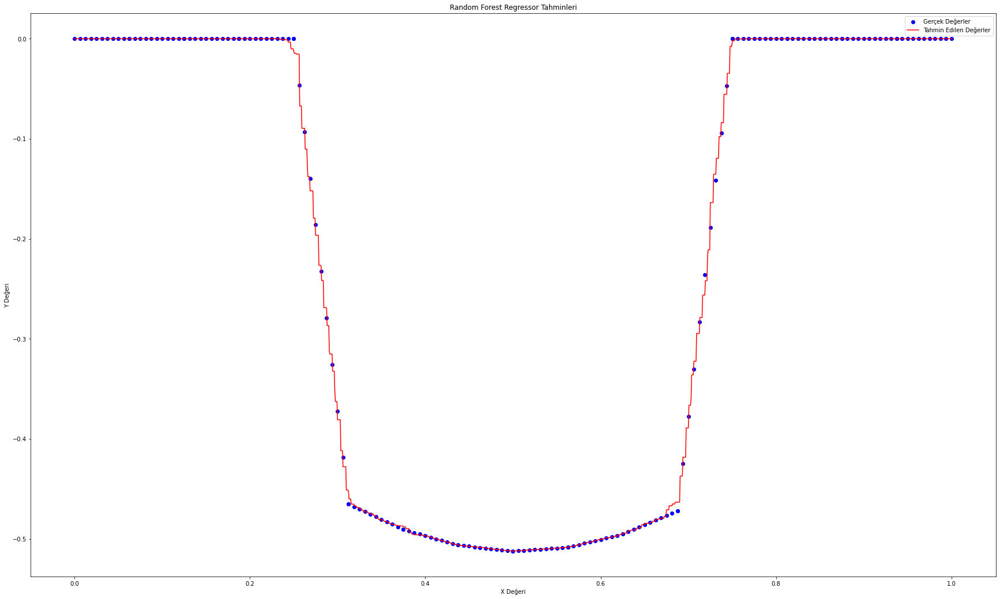

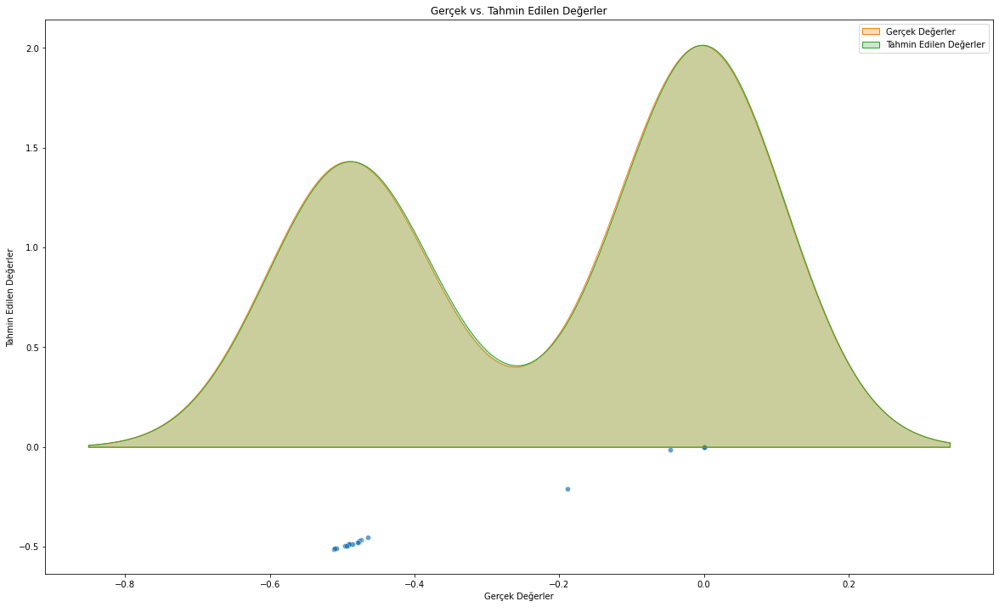

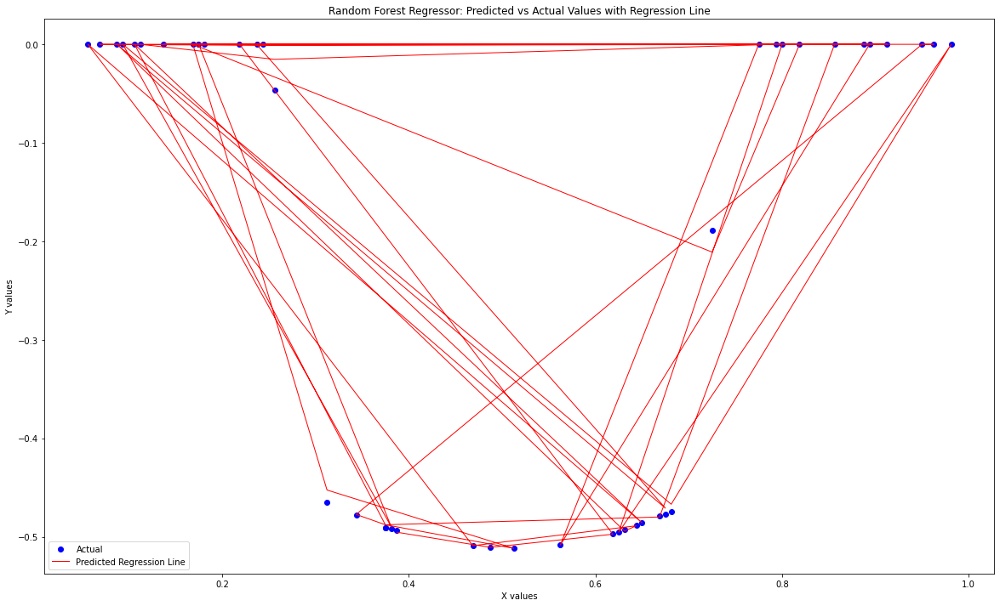

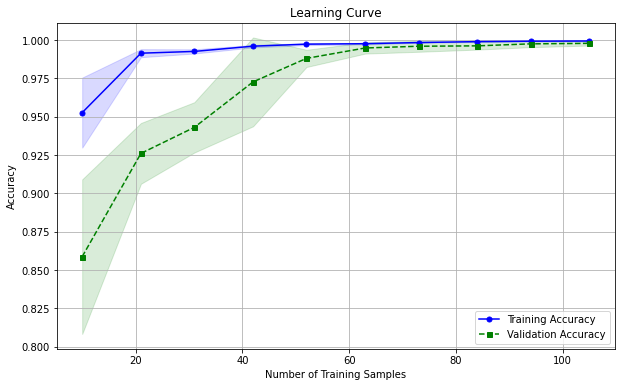

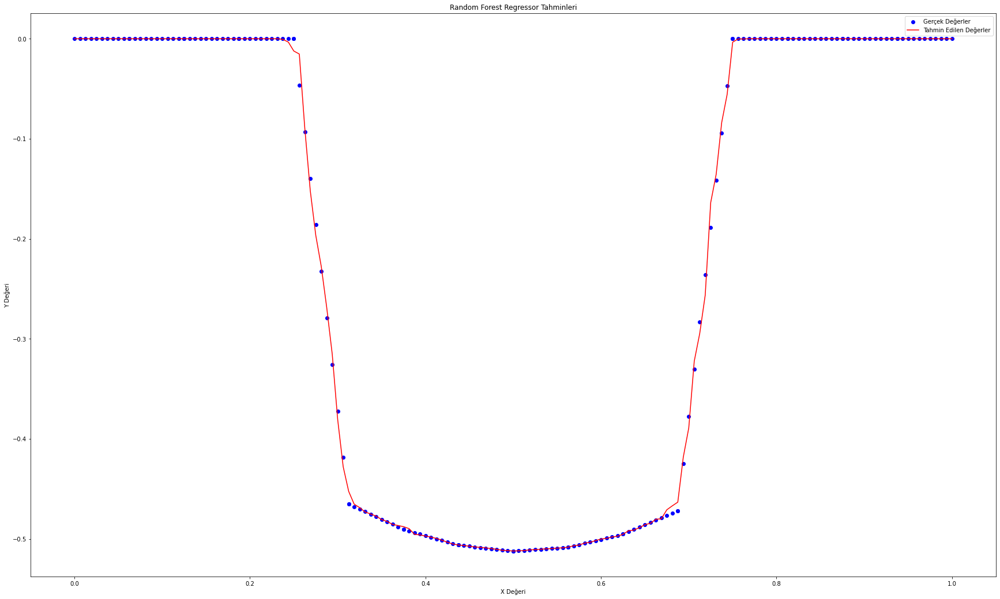

[-0.51]


In [110]:
rf_reg_M16 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_M16.fit(X_train_M16, y_train_M16)

y_pred_M16 = rf_reg_M16.predict(X_test_M16)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M16.reshape(len(y_pred_M16),1), y_test_M16.reshape(len(y_test_M16),1)),1))

print(r2_score(y_test_M16, y_pred_M16))

# Use test and show results of test set
y_hat_M16 = rf_reg_M16.predict(X_M16)
mae = metrics.mean_absolute_error(y_M16,y_hat_M16)
mse = metrics.mean_squared_error(y_M16,y_hat_M16)
mape = np.mean(np.abs((y_M16 - y_hat_M16) / y_M16)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_M16.score(X_M16,y_M16))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_M16, y_test_M16, color='blue', label='Actual Values')
plt.scatter(X_test_M16, y_pred_M16, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_M16, y_pred_M16, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M16 = np.arange(0, 1.000625, 0.000625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M16 = rf_reg_M16.predict(X_values_M16)

# Gerçek değerler için aynı işlemi yap
y_true_values_M16 = rf_reg_M16.predict(X_M16)

plt.figure(figsize=(30, 18))
plt.scatter(X_M16, y_M16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M16, y_pred_values_M16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M16 = pd.DataFrame({'Gerçek Değerler': y_test_M16, 'Tahmin Edilen Değerler': y_pred_M16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M16 = pd.DataFrame({'Predicted': y_pred_M16, 'Actual': y_test_M16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M16, y_test_M16, color='blue', label='Actual')
plt.plot(X_test_M16, y_pred_M16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_M16, X=X_train_M16, y=y_train_M16, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()



### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M16 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M16 = rf_reg_M16.predict(X_values_M16)

# Gerçek değerler için aynı işlemi yap
y_true_values_M16 = rf_reg_M16.predict(X_M16)

plt.figure(figsize=(30, 18))
plt.scatter(X_M16, y_M16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M16, y_pred_values_M16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_M16.predict([[0.43125]])) #0.43125 ==  -5.045882e-01 gerçek değerde

### XGBRegressor ile deneyelim


[[ 0.    0.  ]
 [-0.09 -0.05]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [ 0.    0.  ]
 [-0.47 -0.47]
 [ 0.    0.  ]
 [-0.49 -0.5 ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.47 -0.48]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [-0.49 -0.49]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [-0.48 -0.49]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [-0.48 -0.48]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.48 -0.48]
 [-0.49 -0.49]
 [-0.51 -0.51]
 [-0.46 -0.47]
 [ 0.    0.  ]
 [-0.24 -0.19]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.49 -0.5 ]
 [-0.51 -0.51]
 [-0.49 -0.49]]
0.9982554713205637
TEST SET
MAE:                 0.001721351918682585
RMSE:                0.0051248885956611465
MAPE:                inf
r2:                  0.9995289383578506


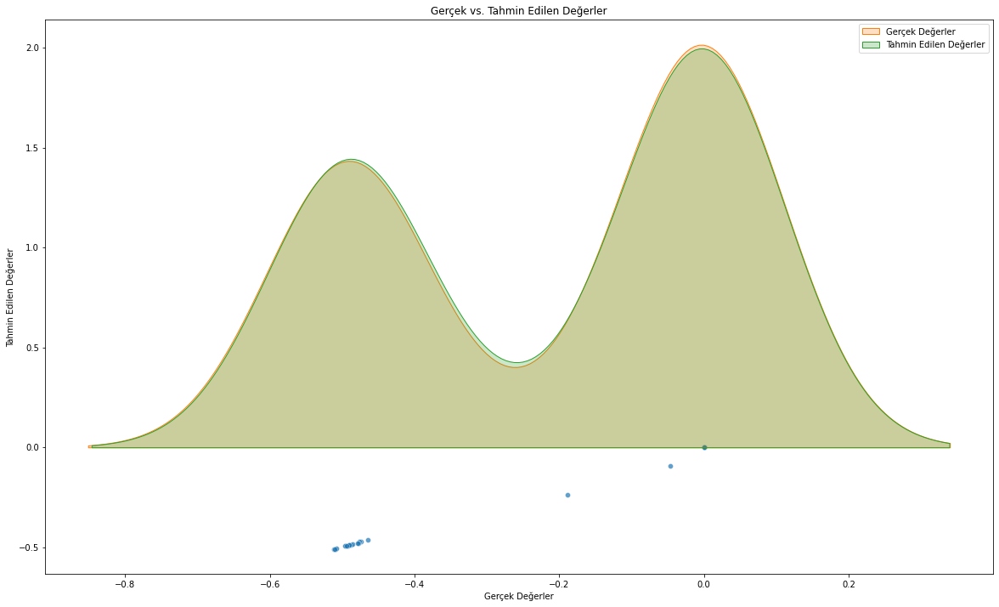

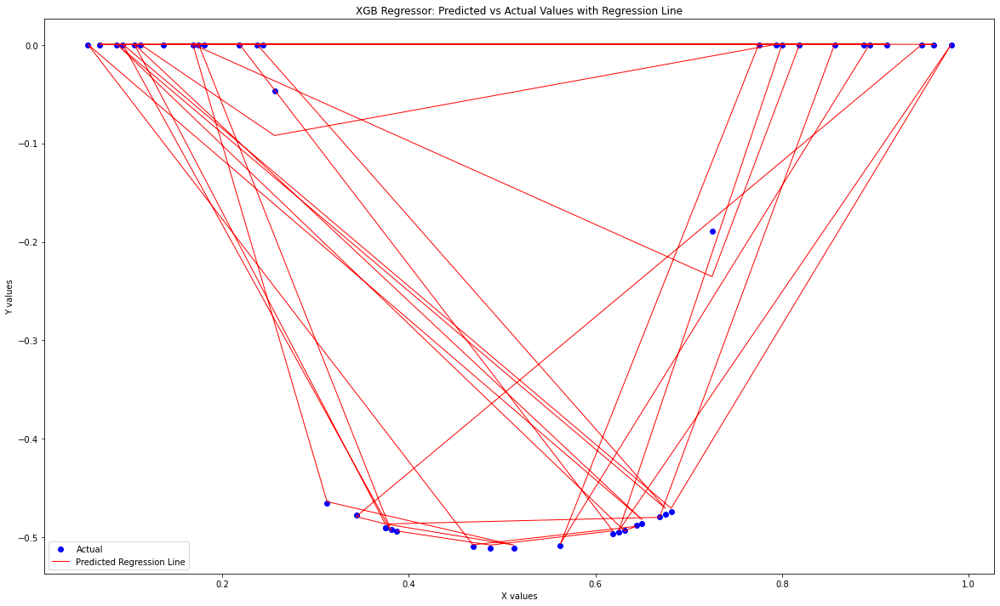

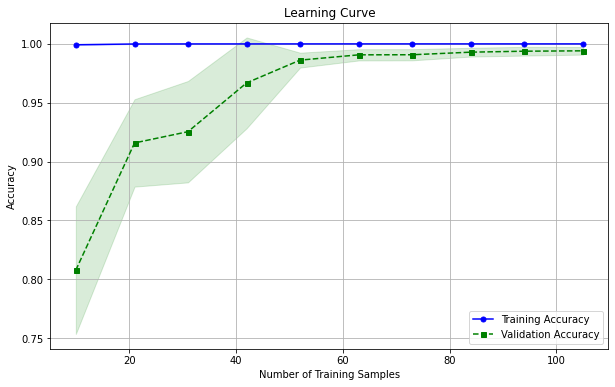

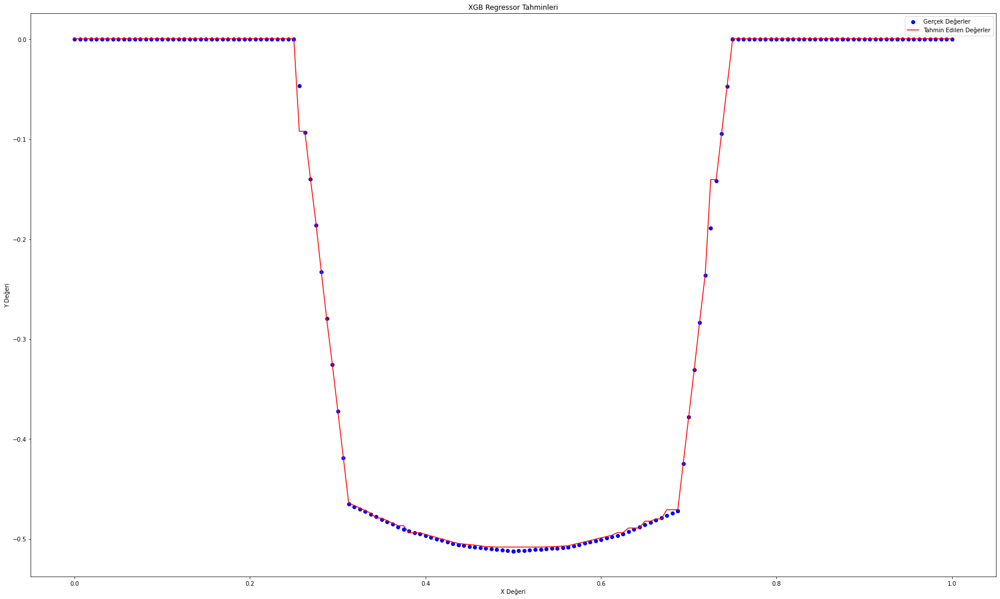

[-0.5]


In [111]:
from xgboost import XGBRegressor


xgb_M16 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_M16.fit(X_train_M16, y_train_M16)

y_pred_M16 = xgb_M16.predict(X_test_M16)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M16.reshape(len(y_pred_M16),1), y_test_M16.reshape(len(y_test_M16),1)),1))


print(r2_score(y_test_M16, y_pred_M16))

# Use test and show results of test set
y_hat_M16 = xgb_M16.predict(X_M16)
mae = metrics.mean_absolute_error(y_M16,y_hat_M16)
mse = metrics.mean_squared_error(y_M16,y_hat_M16)
mape = np.mean(np.abs((y_M16 - y_hat_M16) / y_M16)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_M16.score(X_M16,y_M16))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M16 = pd.DataFrame({'Gerçek Değerler': y_test_M16, 'Tahmin Edilen Değerler': y_pred_M16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M16 = pd.DataFrame({'Predicted': y_pred_M16, 'Actual': y_test_M16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M16, y_test_M16, color='blue', label='Actual')
plt.plot(X_test_M16, y_pred_M16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_M16, X=X_train_M16, y=y_train_M16, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M16 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M16 = xgb_M16.predict(X_values_M16)

# Gerçek değerler için aynı işlemi yap
y_true_values_M16 = xgb_M16.predict(X_M16)

plt.figure(figsize=(30, 18))
plt.scatter(X_M16, y_M16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M16, y_pred_values_M16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_M16.predict([[0.43125]]))  #0.43125 ==  -5.045882e-01 gerçek değerde

### GradientBoostingRegressor deneyelim


[[-3.05e-04  0.00e+00]
 [-3.05e-04 -4.65e-02]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-4.88e-01 -4.92e-01]
 [-3.05e-04  0.00e+00]
 [-4.72e-01 -4.74e-01]
 [-2.87e-04  0.00e+00]
 [-4.95e-01 -4.95e-01]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-4.72e-01 -4.77e-01]
 [-3.05e-04  0.00e+00]
 [-4.95e-01 -4.93e-01]
 [-4.91e-01 -4.88e-01]
 [-5.08e-01 -5.09e-01]
 [-3.05e-04  0.00e+00]
 [-4.84e-01 -4.86e-01]
 [-3.05e-04  0.00e+00]
 [-4.88e-01 -4.90e-01]
 [-4.75e-01 -4.78e-01]
 [-2.87e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-4.81e-01 -4.79e-01]
 [-4.88e-01 -4.90e-01]
 [-5.09e-01 -5.11e-01]
 [-4.65e-01 -4.65e-01]
 [-3.05e-04  0.00e+00]
 [-2.36e-01 -1.89e-01]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-5.08e-01 -5.08e-01]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-4.98e-01 -4.96e-01]
 [-5.09e-01 -5.11e-01]
 [-4.95e-01

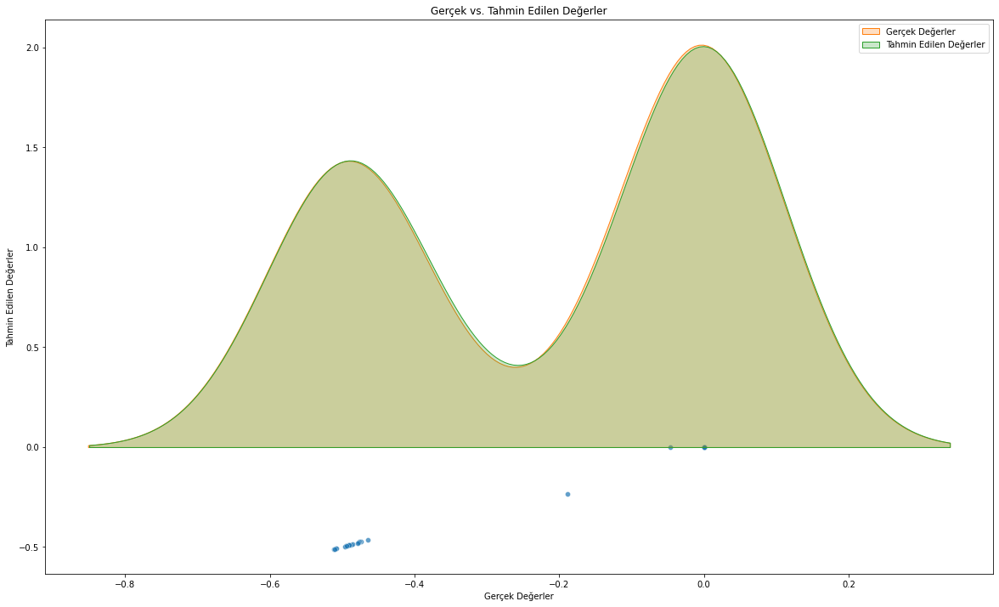

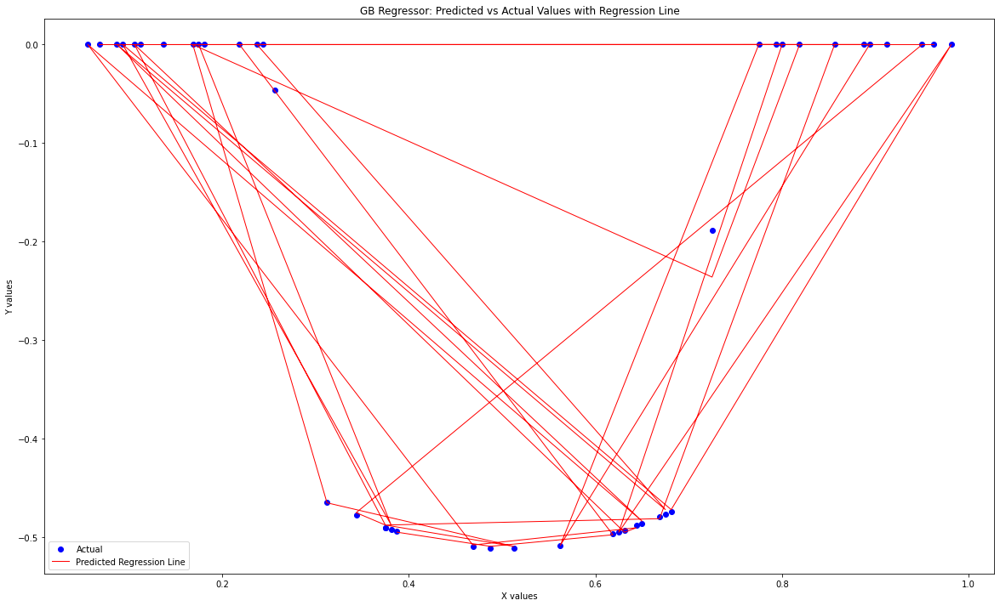

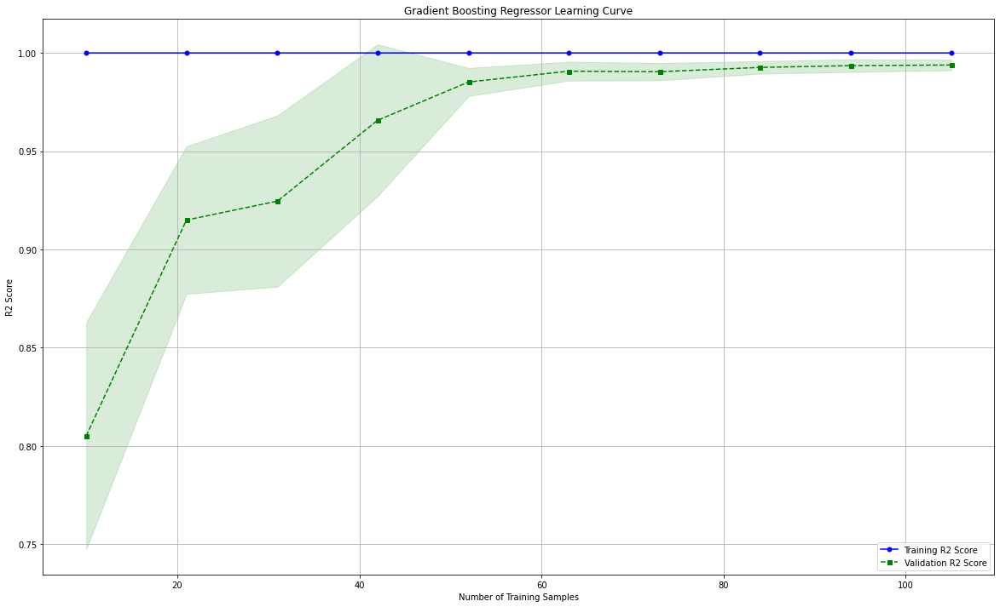

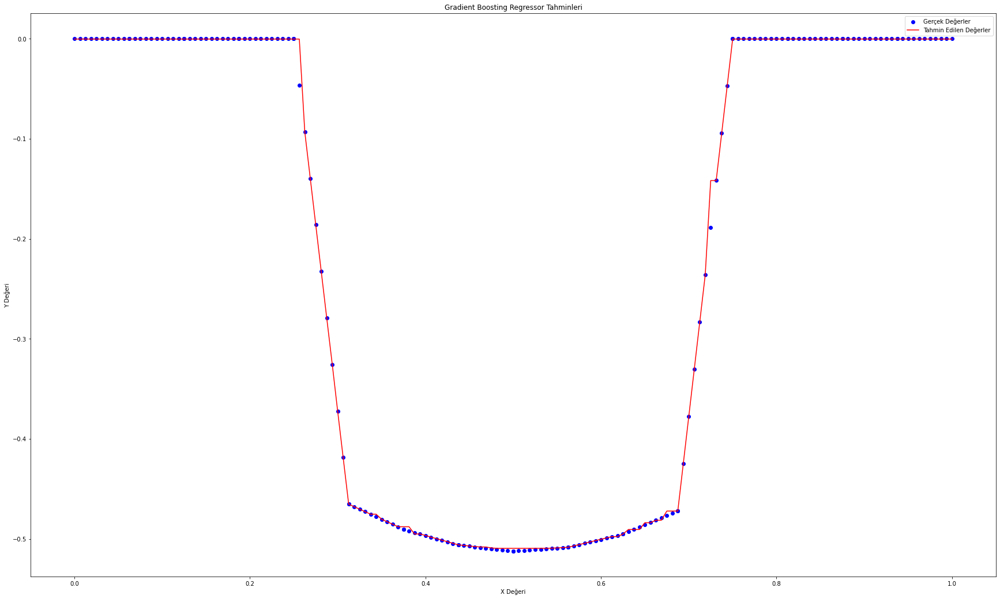

[-0.5]


In [112]:
gb_reg_M16 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_M16.fit(X_train_M16, y_train_M16)

y_pred_M16 = gb_reg_M16.predict(X_test_M16)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M16.reshape(len(y_pred_M16),1), y_test_M16.reshape(len(y_test_M16),1)),1))


print(r2_score(y_test_M16, y_pred_M16))

# Use test and show results of test set
y_hat_M16 = gb_reg_M16.predict(X_M16)
mae = metrics.mean_absolute_error(y_M16,y_hat_M16)
mse = metrics.mean_squared_error(y_M16,y_hat_M16)
mape = np.mean(np.abs((y_M16 - y_hat_M16) / y_M16)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_M16.score(X_M16,y_M16))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M16 = pd.DataFrame({'Gerçek Değerler': y_test_M16, 'Tahmin Edilen Değerler': y_pred_M16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M16 = pd.DataFrame({'Predicted': y_pred_M16, 'Actual': y_test_M16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M16, y_test_M16, color='blue', label='Actual')
plt.plot(X_test_M16, y_pred_M16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_M16, X=X_train_M16, y=y_train_M16, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()



# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M16 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M16 = gb_reg_M16.predict(X_values_M16)

# Gerçek değerler için aynı işlemi yap
y_true_values_M16 = gb_reg_M16.predict(X_M16)

plt.figure(figsize=(30, 18))
plt.scatter(X_M16, y_M16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M16, y_pred_values_M16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_M16.predict([[0.43125]]))  #0.43125 ==  -5.045882e-01 gerçek değerde

### SupportVectorRegressor ile deneyelim

[[ 5.29e-02  0.00e+00]
 [-1.80e-01 -4.65e-02]
 [-3.98e-02  0.00e+00]
 [ 2.80e-04  0.00e+00]
 [-4.75e-01 -4.92e-01]
 [ 5.09e-02  0.00e+00]
 [-3.13e-01 -4.74e-01]
 [-2.45e-02  0.00e+00]
 [-4.38e-01 -4.95e-01]
 [-2.82e-02  0.00e+00]
 [ 4.29e-02  0.00e+00]
 [ 4.38e-02  0.00e+00]
 [-1.32e-01  0.00e+00]
 [-3.29e-01 -4.77e-01]
 [ 4.85e-02  0.00e+00]
 [-4.26e-01 -4.93e-01]
 [-4.00e-01 -4.88e-01]
 [-5.59e-01 -5.09e-01]
 [ 2.53e-02  0.00e+00]
 [-3.87e-01 -4.86e-01]
 [ 5.31e-02  0.00e+00]
 [-4.64e-01 -4.90e-01]
 [-4.03e-01 -4.78e-01]
 [ 1.33e-02  0.00e+00]
 [-8.20e-04  0.00e+00]
 [ 4.17e-02  0.00e+00]
 [-3.44e-01 -4.79e-01]
 [-4.64e-01 -4.90e-01]
 [-5.60e-01 -5.11e-01]
 [-3.29e-01 -4.65e-01]
 [ 9.59e-03  0.00e+00]
 [-2.01e-01 -1.89e-01]
 [ 2.39e-03  0.00e+00]
 [-9.86e-03  0.00e+00]
 [ 3.67e-02  0.00e+00]
 [-1.48e-01  0.00e+00]
 [ 5.10e-02  0.00e+00]
 [-7.85e-02  0.00e+00]
 [-5.28e-01 -5.08e-01]
 [ 5.03e-02  0.00e+00]
 [-8.59e-02  0.00e+00]
 [-4.49e-01 -4.96e-01]
 [-5.63e-01 -5.11e-01]
 [-4.85e-01

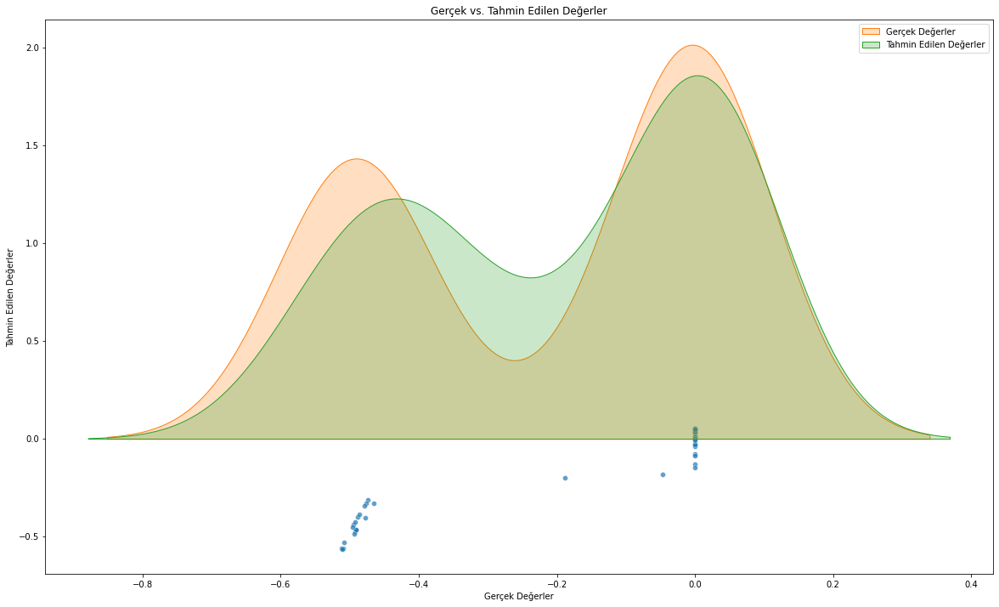

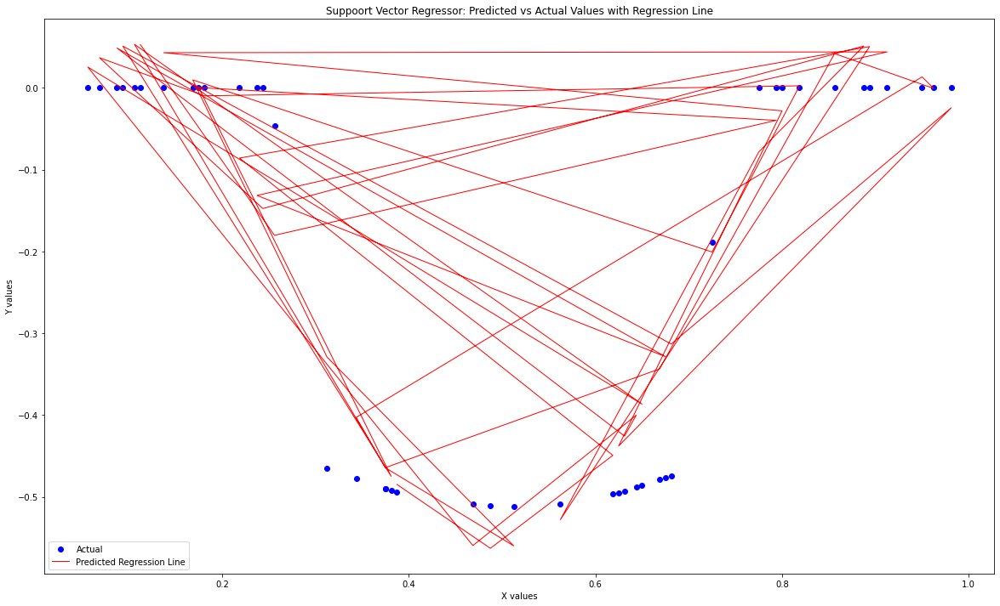

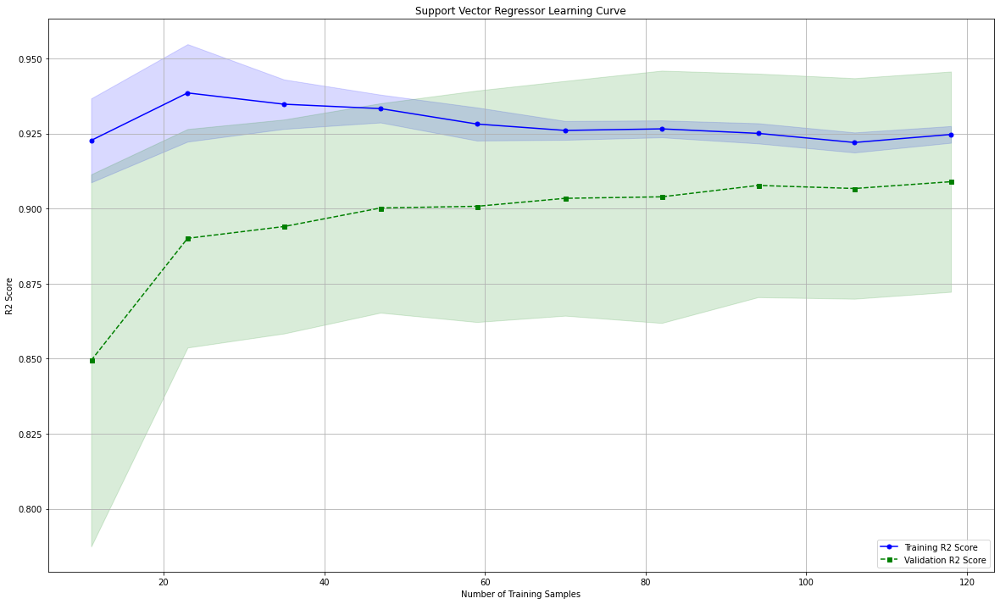

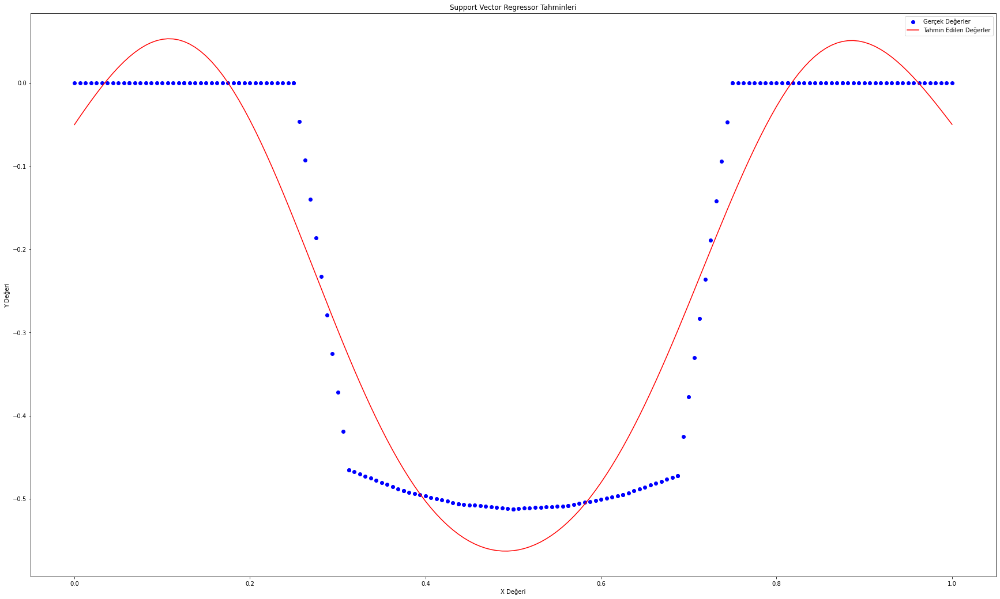

[-0.54]


In [113]:
svr_reg_M16 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_M16.fit(X_train_M16, y_train_M16)

y_pred_M16 = svr_reg_M16.predict(X_test_M16)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M16.reshape(len(y_pred_M16),1), y_test_M16.reshape(len(y_test_M16),1)),1))


print(r2_score(y_test_M16, y_pred_M16))


# Use test and show results of test set
y_hat_M16 = svr_reg_M16.predict(X_M16)
mae = metrics.mean_absolute_error(y_M16,y_hat_M16)
mse = metrics.mean_squared_error(y_M16,y_hat_M16)
mape = np.mean(np.abs((y_M16 - y_hat_M16) / y_M16)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_M16.score(X_M16,y_M16))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M16 = pd.DataFrame({'Gerçek Değerler': y_test_M16, 'Tahmin Edilen Değerler': y_pred_M16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M16 = pd.DataFrame({'Predicted': y_pred_M16, 'Actual': y_test_M16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M16, y_test_M16, color='blue', label='Actual')
plt.plot(X_test_M16, y_pred_M16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_M16, X=X_train_M16, y=y_train_M16, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M16 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M16 = svr_reg_M16.predict(X_values_M16)

# Gerçek değerler için aynı işlemi yap
y_true_values_M16 = svr_reg_M16.predict(X_M16)

plt.figure(figsize=(30, 18))
plt.scatter(X_M16, y_M16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M16, y_pred_values_M16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_M16.predict([[0.43125]]))  #0.43125 ==  -5.045882e-01 gerçek değerde

### PolynomialRegressor ile deneyelim

R2 Score (Polynomial Regression):  0.9102306772503876
MAE (Polynomial Regression):  0.056172015678875774
RMSE (Polynomial Regression):  0.07155086295053573
MAPE (Polynomial Regression):  inf


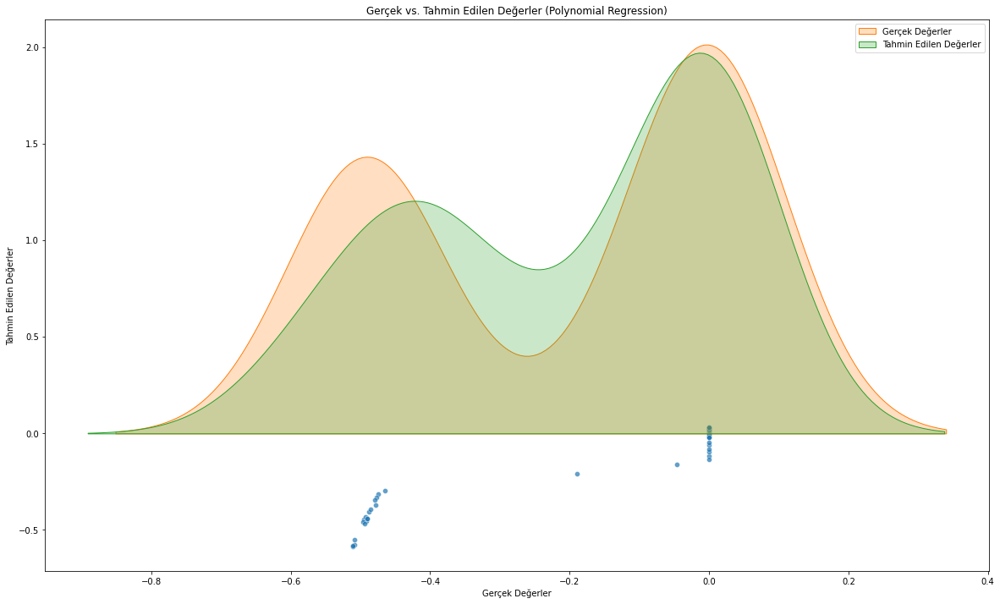

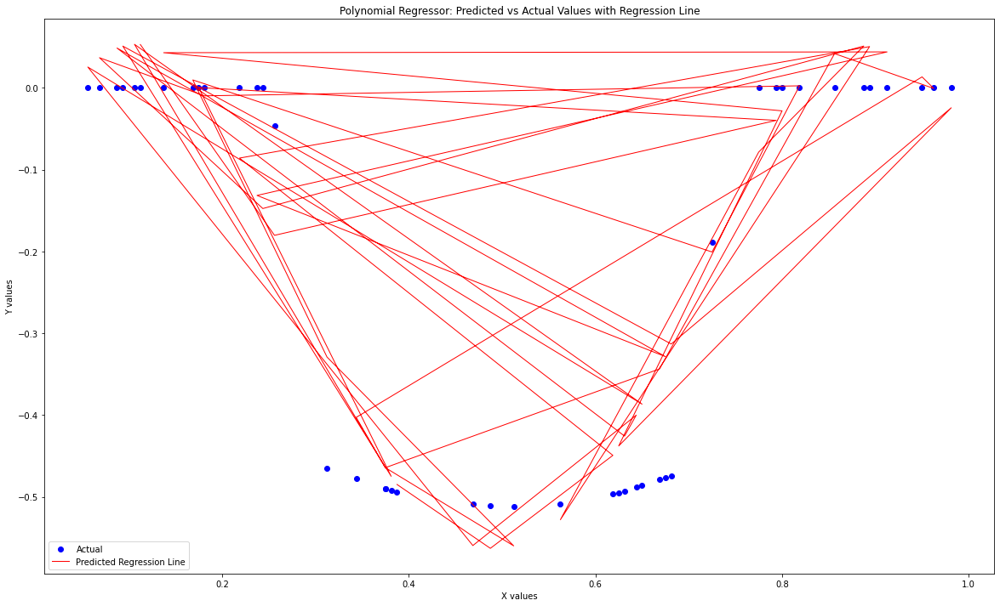

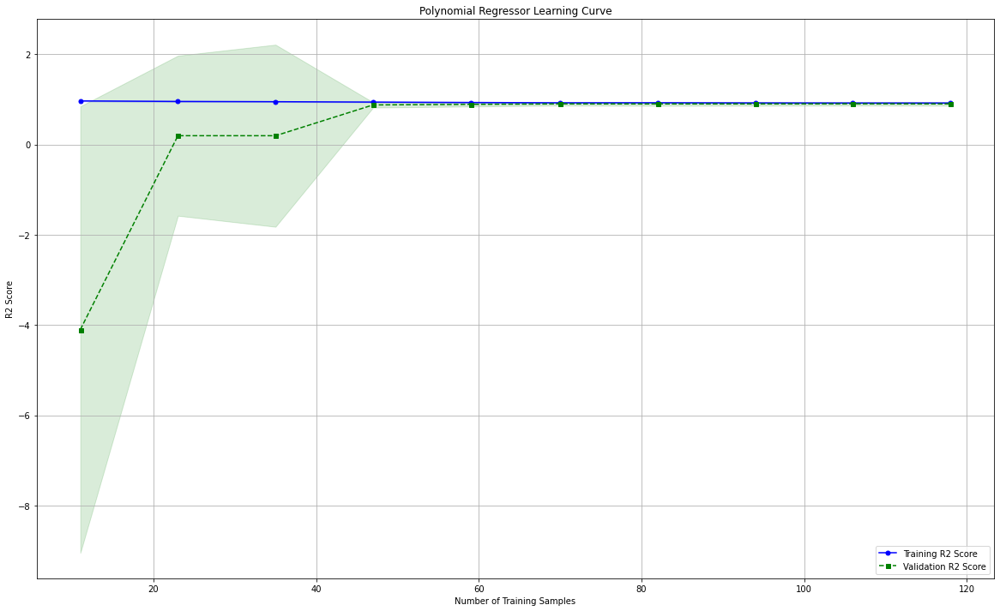

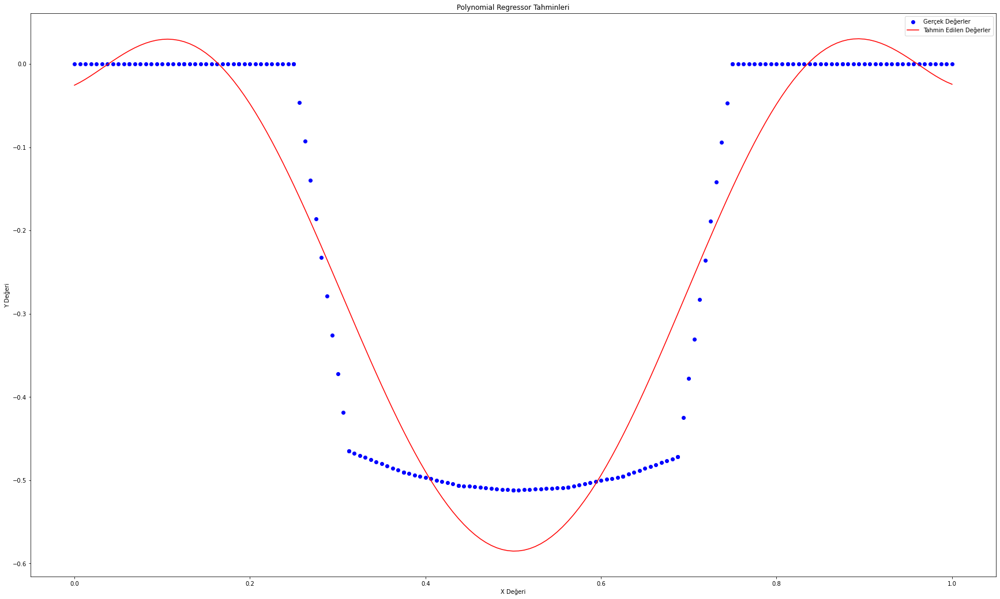

[-0.54]


In [114]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_M16 = PolynomialFeatures(degree=7)
X_poly_M16 = poly_M16.fit_transform(X_M16)

# Lineer Regresyon modeli oluşturma
poly_reg_M16 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_M16.fit(X_M16, y_M16)

# Tahminler yapma
y_pred_poly_M16 = poly_reg_M16.predict(X_test_M16)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_M16, y_pred_poly_M16))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_M16, y_pred_poly_M16))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_M16, y_pred_poly_M16)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_M16 - y_pred_poly_M16) / y_test_M16)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_M16 = pd.DataFrame({'Gerçek Değerler': y_test_M16, 'Tahmin Edilen Değerler': y_pred_poly_M16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_M16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_M16 = pd.DataFrame({'Predicted': y_pred_M16, 'Actual': y_test_M16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M16, y_test_M16, color='blue', label='Actual')
plt.plot(X_test_M16, y_pred_M16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_M16, X=X_train_M16, y=y_train_M16, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()



# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M16 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M16 = poly_reg_M16.predict(X_values_M16)

# Gerçek değerler için aynı işlemi yap
y_true_values_M16 = poly_reg_M16.predict(X_M16)

plt.figure(figsize=(30, 18))
plt.scatter(X_M16, y_M16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M16, y_pred_values_M16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_M16.predict([[0.43125]]))  #0.43125 ==  -5.045882e-01 gerçek değerde

### Multi-Layer Perceptron

In [115]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_M16, y_train_M16,epochs=100, batch_size=32, validation_split=0.25)

y_pred_M16 = mlp.predict(X_test_M16)

Epoch 1/100
4/4 [==============================] - 1s 42ms/step - loss: 0.0950 - mae: 0.2021 - val_loss: 0.1241 - val_mae: 0.2679
Epoch 2/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0935 - mae: 0.2025 - val_loss: 0.1221 - val_mae: 0.2669
Epoch 3/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0921 - mae: 0.2028 - val_loss: 0.1202 - val_mae: 0.2658
Epoch 4/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0907 - mae: 0.2032 - val_loss: 0.1183 - val_mae: 0.2649
Epoch 5/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0893 - mae: 0.2036 - val_loss: 0.1164 - val_mae: 0.2638
Epoch 6/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0878 - mae: 0.2037 - val_loss: 0.1144 - val_mae: 0.2627
Epoch 7/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0864 - mae: 0.2043 - val_loss: 0.1123 - val_mae: 0.2615
Epoch 8/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0849 - mae: 0.20

4/4 [==============================] - 0s 12ms/step - loss: 0.0547 - mae: 0.2250 - val_loss: 0.0589 - val_mae: 0.2317
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0547 - mae: 0.2246 - val_loss: 0.0590 - val_mae: 0.2317
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0547 - mae: 0.2244 - val_loss: 0.0591 - val_mae: 0.2318
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0547 - mae: 0.2243 - val_loss: 0.0593 - val_mae: 0.2319
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0547 - mae: 0.2241 - val_loss: 0.0596 - val_mae: 0.2321
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0547 - mae: 0.2237 - val_loss: 0.0601 - val_mae: 0.2324
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0548 - mae: 0.2231 - val_loss: 0.0607 - val_mae: 0.2328
Epoch 70/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0549 - mae: 0.2226 - v

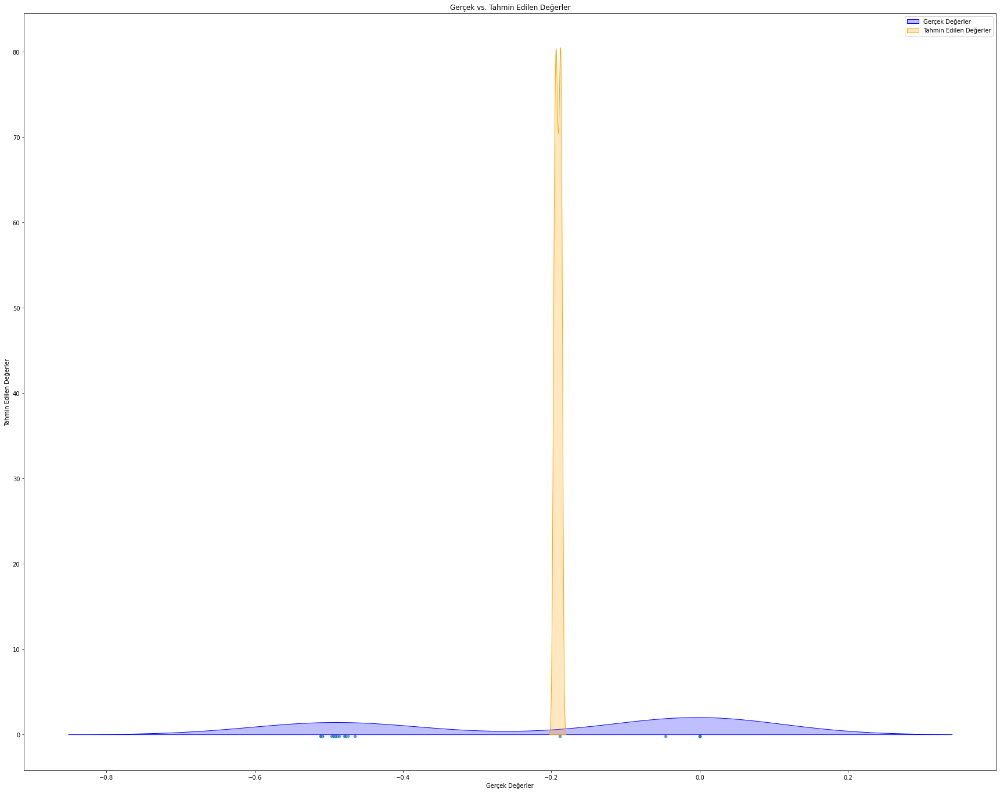

In [116]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_M16 = pd.DataFrame({'Gerçek Değerler': y_test_M16.flatten(), 'Tahmin Edilen Değerler': y_pred_M16.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M16, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
4/4 [==============================] - 0s 21ms/step - loss: 0.0535 - mae: 0.2199 - val_loss: 0.0778 - val_mae: 0.2738
Epoch 2/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0535 - mae: 0.2200 - val_loss: 0.0775 - val_mae: 0.2735
Epoch 3/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0535 - mae: 0.2200 - val_loss: 0.0773 - val_mae: 0.2733
Epoch 4/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0535 - mae: 0.2203 - val_loss: 0.0767 - val_mae: 0.2725
Epoch 5/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0534 - mae: 0.2205 - val_loss: 0.0763 - val_mae: 0.2719
Epoch 6/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0534 - mae: 0.2207 - val_loss: 0.0759 - val_mae: 0.2713
Epoch 7/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0534 - mae: 0.2209 - val_loss: 0.0756 - val_mae: 0.2710
Epoch 8/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0534 - mae: 0.2211 - val_lo

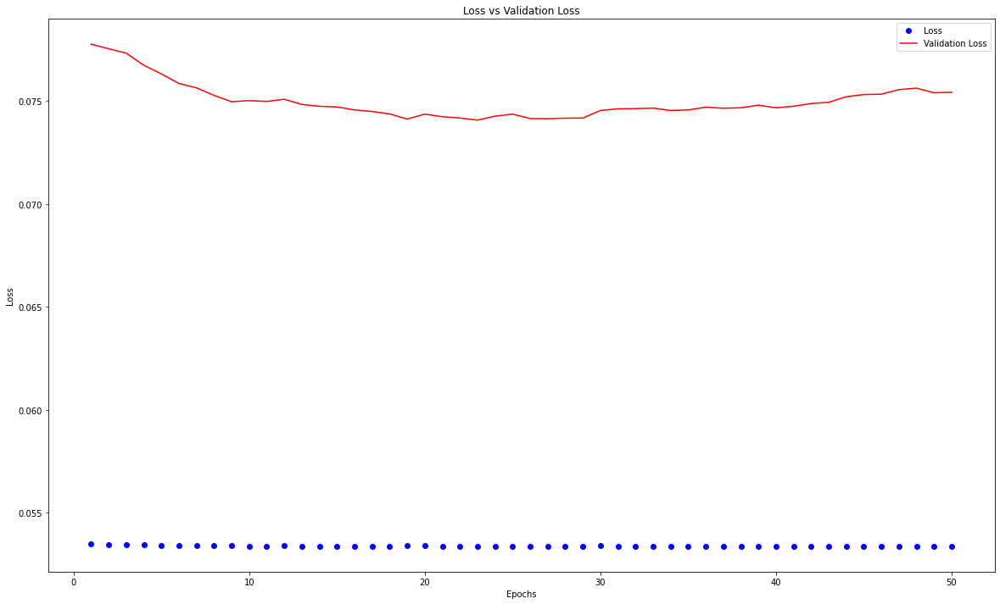

In [117]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_M16, y_train_M16, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması


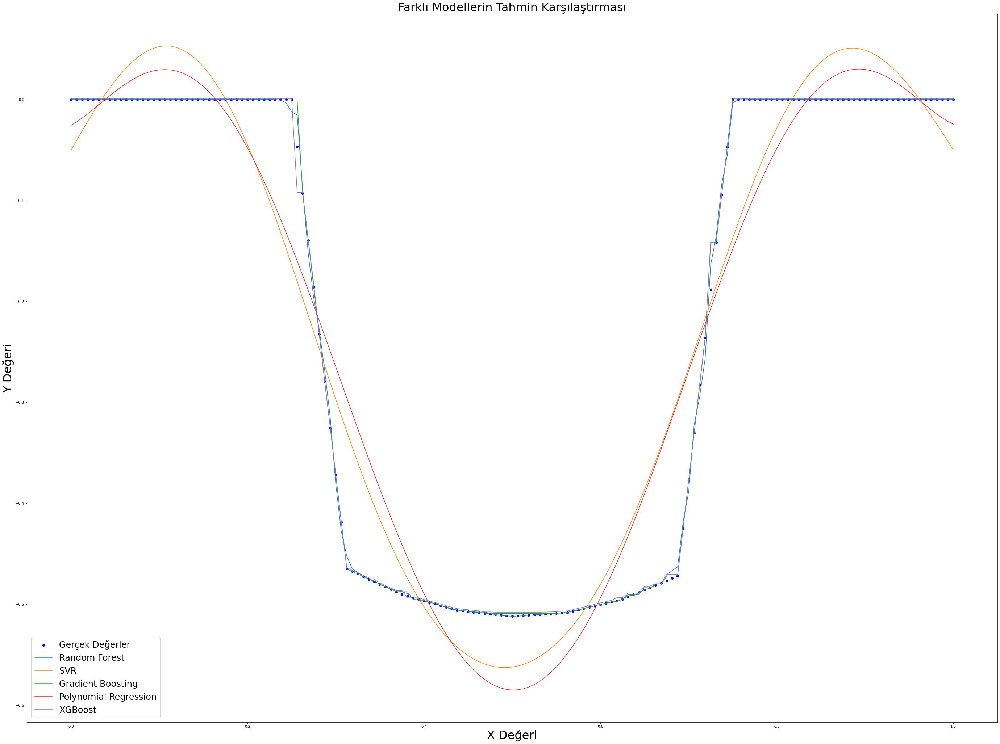

In [118]:
y_pred_rf_M16 = rf_reg_M16.predict(X_values_M16)
y_pred_svr_M16 = svr_reg_M16.predict(X_values_M16)  
y_pred_gb_M16 = gb_reg_M16.predict(X_values_M16)
y_pred_poly_M16 = poly_reg_M16.predict(X_values_M16)
y_pred_xgb_M16 = xgb_M16.predict(X_values_M16)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_M16, y_M16, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_M16, y_pred_rf_M16, label='Random Forest')
plt.plot(X_values_M16, y_pred_svr_M16, label='SVR')
plt.plot(X_values_M16, y_pred_gb_M16, label='Gradient Boosting')
plt.plot(X_values_M16, y_pred_poly_M16, label='Polynomial Regression')
plt.plot(X_values_M16, y_pred_xgb_M16, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

# M18 Verisi için Modeller

In [120]:
data_M18 = pd.read_excel('M verileri.xlsx')
data_M18 = data_M18.iloc[:, 10:12] # 10. ve 11. kolonları seçelim
data_M18

,M18_X2_iz10_imort,M18_X2_fi
0,0.0000,0.000000e+00
1,0.0625,0.000000e+00
2,0.1250,0.000000e+00
3,0.1875,0.000000e+00
4,0.2500,0.000000e+00
5,0.3125,0.000000e+00
6,0.3750,0.000000e+00
7,0.4375,0.000000e+00
8,0.5000,0.000000e+00
9,0.5625,0.000000e+00


In [121]:
#data_M18 = data_M18.loc[:153,:] #154 adet veri var onları alıcaz mecbur
data_M18['M18_X2_iz10_imort'] = data_M18['M18_X2_iz10_imort'] / 10 # koordinat değerlerini / 10 yapmam gerekli
data_M18

,M18_X2_iz10_imort,M18_X2_fi
0,0.00000,0.000000e+00
1,0.00625,0.000000e+00
2,0.01250,0.000000e+00
3,0.01875,0.000000e+00
4,0.02500,0.000000e+00
5,0.03125,0.000000e+00
6,0.03750,0.000000e+00
7,0.04375,0.000000e+00
8,0.05000,0.000000e+00
9,0.05625,0.000000e+00


In [122]:
data_M18.columns[data_M18.isnull().any()]

Index([], dtype='object')

In [123]:
data_M18.isna().any()

M18_X2_iz10_imort    False
M18_X2_fi            False
dtype: bool

In [124]:
data_M18.describe()

,M18_X2_iz10_imort,M18_X2_fi
count,176.000000,1.760000e+02
mean,0.500000,-2.155989e-01
std,0.289612,2.368006e-01
min,0.000000,-5.121463e-01
25%,0.250000,-4.922442e-01
50%,0.500000,0.000000e+00
75%,0.750000,0.000000e+00
max,1.000000,7.034451e-09


In [125]:
data_M18.shape

(176, 2)

### veri kontrol edildi, problem yok

In [126]:
X_M18 = data_M18.iloc[:, :1].values
y_M18 = data_M18.iloc[:,1].values

In [127]:
X_train_M18, X_test_M18, y_train_M18, y_test_M18 = train_test_split(X_M18, y_M18, test_size = 0.25, random_state = 42)

### RandomForestRegressor ile deneyelim


[[ 0.00e+00  0.00e+00]
 [-1.53e-02 -4.65e-02]
 [ 2.26e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.90e-01 -4.92e-01]
 [ 0.00e+00  0.00e+00]
 [-4.67e-01 -4.74e-01]
 [ 2.26e-10  0.00e+00]
 [-4.95e-01 -4.95e-01]
 [ 2.26e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [-5.58e-04  0.00e+00]
 [-4.71e-01 -4.77e-01]
 [ 0.00e+00  0.00e+00]
 [-4.94e-01 -4.93e-01]
 [-4.89e-01 -4.88e-01]
 [-5.09e-01 -5.09e-01]
 [ 0.00e+00  0.00e+00]
 [-4.86e-01 -4.86e-01]
 [ 0.00e+00  0.00e+00]
 [-4.88e-01 -4.90e-01]
 [-4.77e-01 -4.78e-01]
 [ 2.26e-10  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [-4.80e-01 -4.79e-01]
 [-4.88e-01 -4.90e-01]
 [-5.12e-01 -5.11e-01]
 [-4.52e-01 -4.65e-01]
 [ 0.00e+00  0.00e+00]
 [-2.11e-01 -1.89e-01]
 [ 2.26e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-1.12e-03  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [ 2.26e-10  0.00e+00]
 [-5.08e-01 -5.08e-01]
 [ 2.26e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.97e-01 -4.96e-01]
 [-5.11e-01 -5.11e-01]
 [-4.95e-01

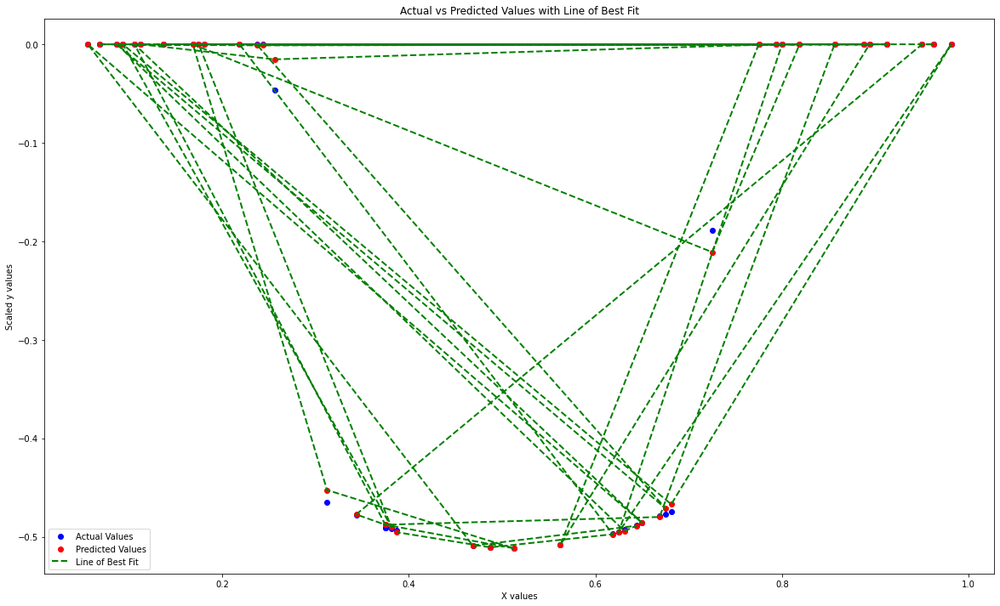

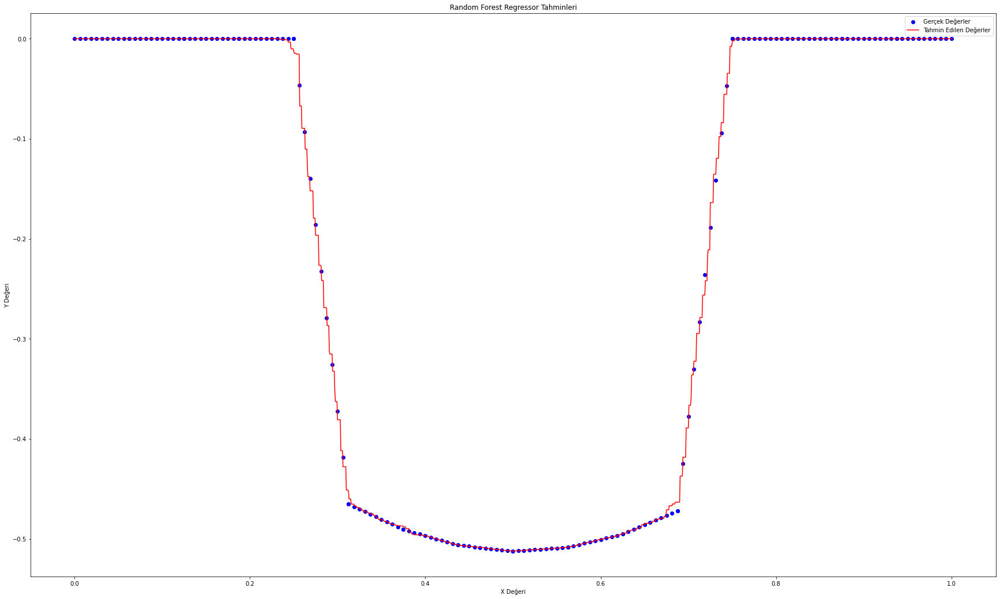

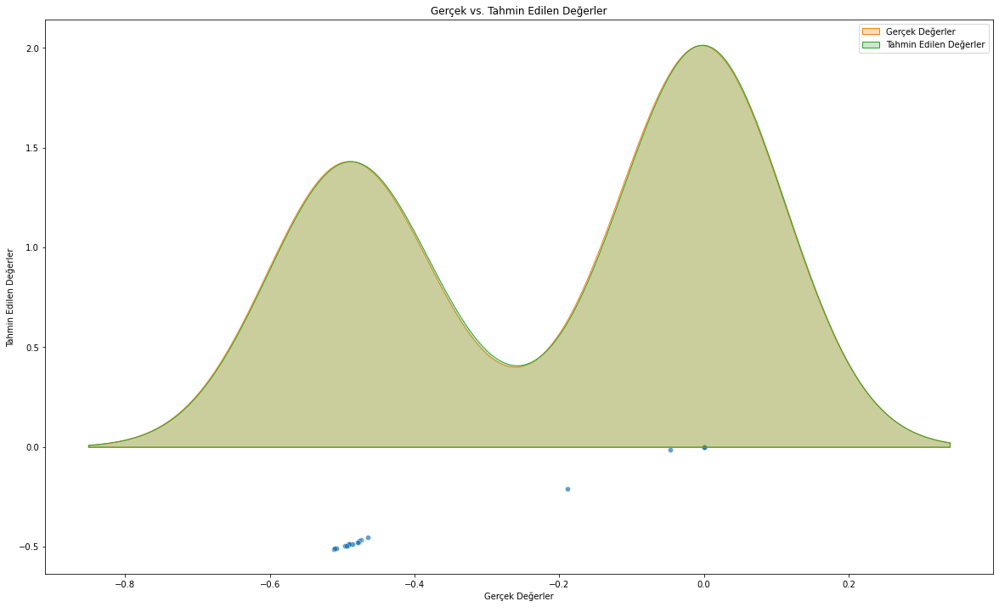

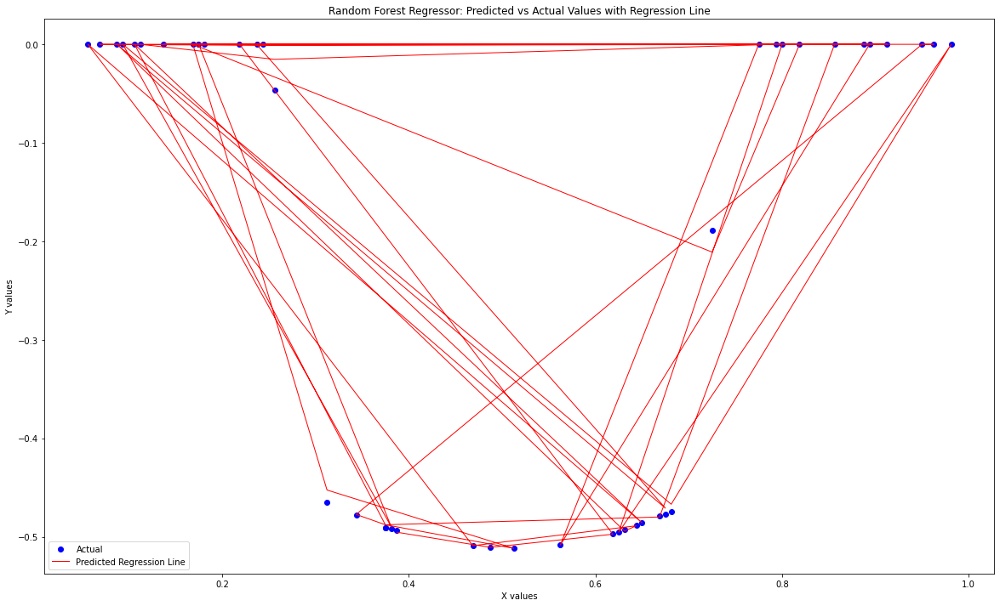

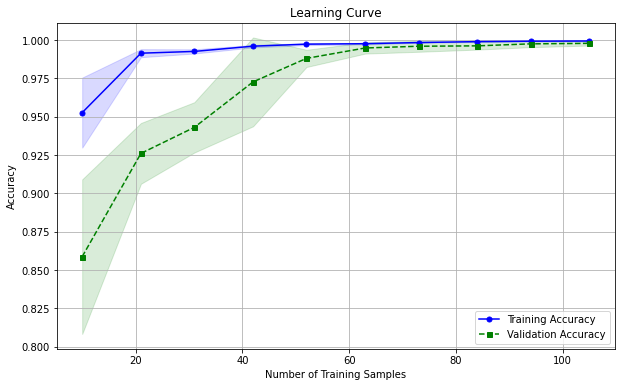

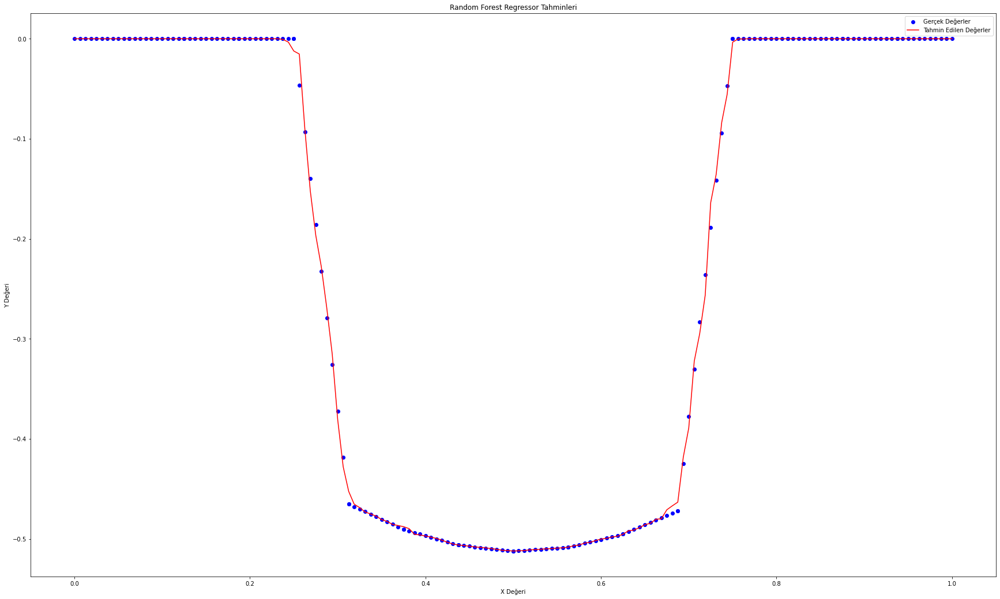

[-0.51]


In [128]:
rf_reg_M18 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_M18.fit(X_train_M18, y_train_M18)

y_pred_M18 = rf_reg_M18.predict(X_test_M18)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M18.reshape(len(y_pred_M18),1), y_test_M18.reshape(len(y_test_M18),1)),1))

print(r2_score(y_test_M18, y_pred_M18))

# Use test and show results of test set
y_hat_M18 = rf_reg_M18.predict(X_M18)
mae = metrics.mean_absolute_error(y_M18,y_hat_M18)
mse = metrics.mean_squared_error(y_M18,y_hat_M18)
mape = np.mean(np.abs((y_M18 - y_hat_M18) / y_M18)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_M18.score(X_M18,y_M18))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_M18, y_test_M18, color='blue', label='Actual Values')
plt.scatter(X_test_M18, y_pred_M18, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_M18, y_pred_M18, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M18 = np.arange(0, 1.000625, 0.000625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M18 = rf_reg_M18.predict(X_values_M18)

# Gerçek değerler için aynı işlemi yap
y_true_values_M18 = rf_reg_M18.predict(X_M18)

plt.figure(figsize=(30, 18))
plt.scatter(X_M18, y_M18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M18, y_pred_values_M18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M18 = pd.DataFrame({'Gerçek Değerler': y_test_M18, 'Tahmin Edilen Değerler': y_pred_M18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M18 = pd.DataFrame({'Predicted': y_pred_M18, 'Actual': y_test_M18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M18, y_test_M18, color='blue', label='Actual')
plt.plot(X_test_M18, y_pred_M18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_M18, X=X_train_M18, y=y_train_M18, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()



### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M18 = rf_reg_M18.predict(X_values_M18)

# Gerçek değerler için aynı işlemi yap
y_true_values_M18 = rf_reg_M18.predict(X_M18)

plt.figure(figsize=(30, 18))
plt.scatter(X_M18, y_M18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M18, y_pred_values_M18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_M18.predict([[0.43125]])) #0.43125 ==  -5.045882e-01 gerçek değerde

### XGBRegressor ile deneyelim


[[ 0.    0.  ]
 [-0.09 -0.05]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [ 0.    0.  ]
 [-0.47 -0.47]
 [ 0.    0.  ]
 [-0.49 -0.5 ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.47 -0.48]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [-0.49 -0.49]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [-0.48 -0.49]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [-0.48 -0.48]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.48 -0.48]
 [-0.49 -0.49]
 [-0.51 -0.51]
 [-0.46 -0.47]
 [ 0.    0.  ]
 [-0.24 -0.19]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.49 -0.5 ]
 [-0.51 -0.51]
 [-0.49 -0.49]]
0.9982554713205637
TEST SET
MAE:                 0.001721351918682585
RMSE:                0.0051248885956611465
MAPE:                inf
r2:                  0.9995289383578506


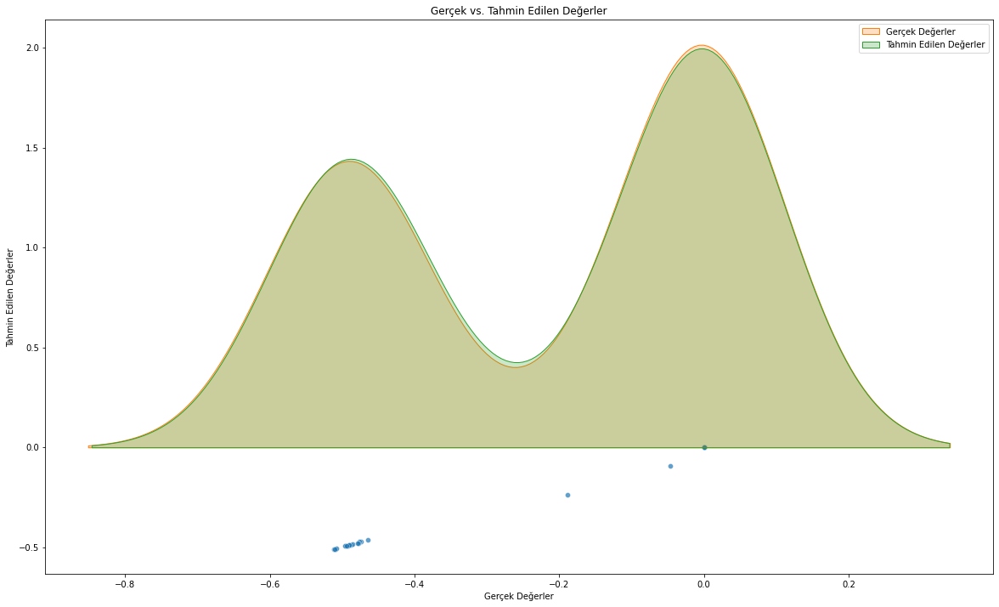

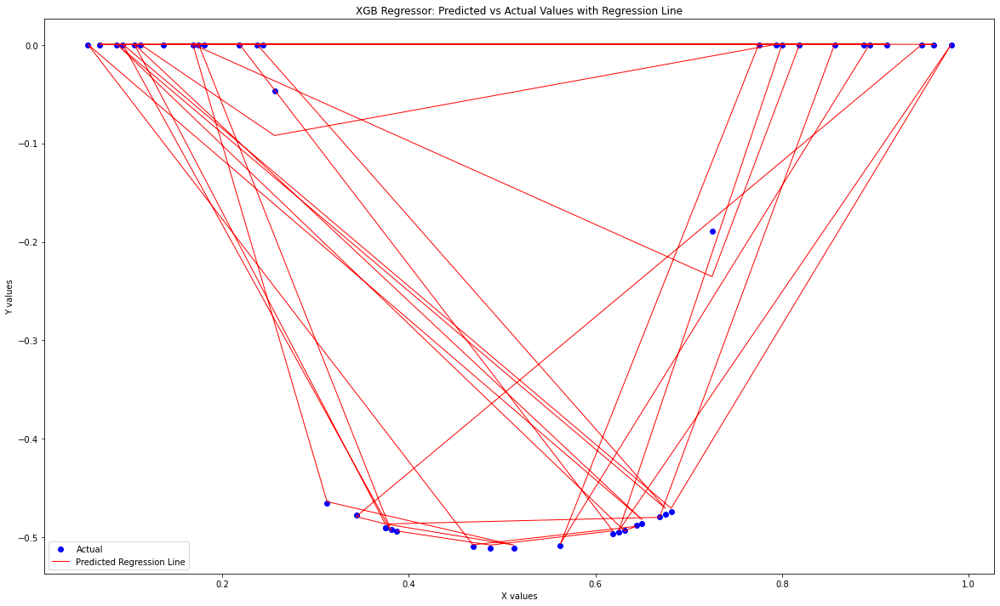

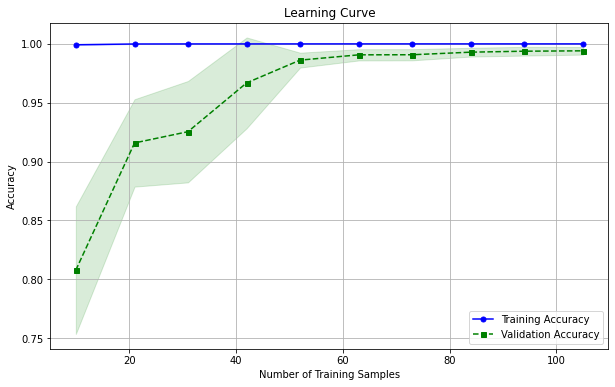

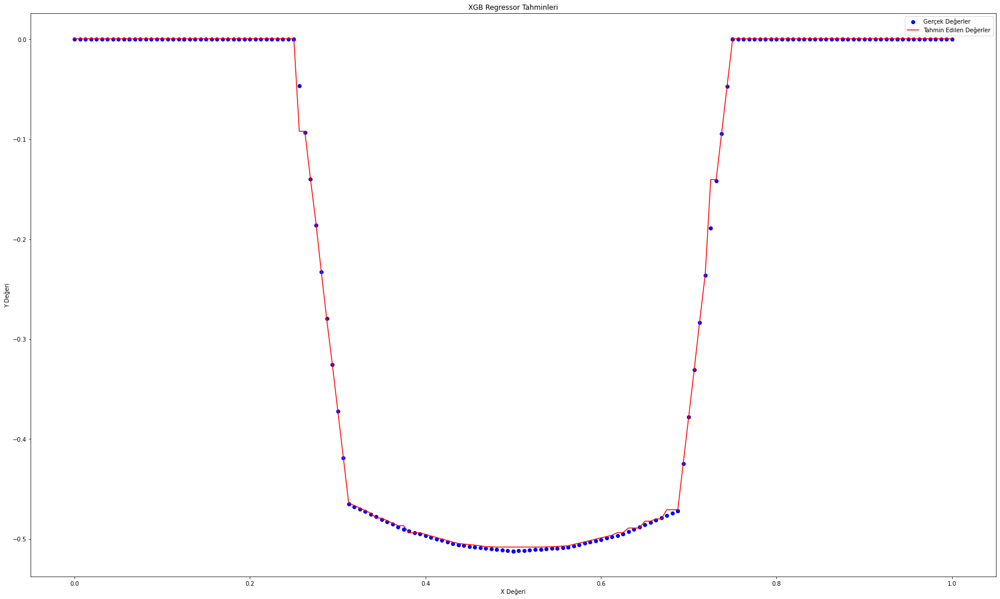

[-0.5]


In [129]:
from xgboost import XGBRegressor


xgb_M18 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_M18.fit(X_train_M18, y_train_M18)

y_pred_M18 = xgb_M18.predict(X_test_M18)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M18.reshape(len(y_pred_M18),1), y_test_M18.reshape(len(y_test_M18),1)),1))


print(r2_score(y_test_M18, y_pred_M18))

# Use test and show results of test set
y_hat_M18 = xgb_M18.predict(X_M18)
mae = metrics.mean_absolute_error(y_M18,y_hat_M18)
mse = metrics.mean_squared_error(y_M18,y_hat_M18)
mape = np.mean(np.abs((y_M18 - y_hat_M18) / y_M18)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_M18.score(X_M18,y_M18))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M18 = pd.DataFrame({'Gerçek Değerler': y_test_M18, 'Tahmin Edilen Değerler': y_pred_M18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M18 = pd.DataFrame({'Predicted': y_pred_M18, 'Actual': y_test_M18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M18, y_test_M18, color='blue', label='Actual')
plt.plot(X_test_M18, y_pred_M18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_M18, X=X_train_M18, y=y_train_M18, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M18 = xgb_M18.predict(X_values_M18)

# Gerçek değerler için aynı işlemi yap
y_true_values_M18 = xgb_M18.predict(X_M18)

plt.figure(figsize=(30, 18))
plt.scatter(X_M18, y_M18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M18, y_pred_values_M18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_M18.predict([[0.43125]]))  #0.43125 ==  -5.045882e-01 gerçek değerde

### GradientBoostingRegressor deneyelim


[[-3.05e-04  0.00e+00]
 [-3.05e-04 -4.65e-02]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-4.88e-01 -4.92e-01]
 [-3.05e-04  0.00e+00]
 [-4.72e-01 -4.74e-01]
 [-2.87e-04  0.00e+00]
 [-4.95e-01 -4.95e-01]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-4.72e-01 -4.77e-01]
 [-3.05e-04  0.00e+00]
 [-4.95e-01 -4.93e-01]
 [-4.91e-01 -4.88e-01]
 [-5.08e-01 -5.09e-01]
 [-3.05e-04  0.00e+00]
 [-4.84e-01 -4.86e-01]
 [-3.05e-04  0.00e+00]
 [-4.88e-01 -4.90e-01]
 [-4.75e-01 -4.78e-01]
 [-2.87e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-4.81e-01 -4.79e-01]
 [-4.88e-01 -4.90e-01]
 [-5.09e-01 -5.11e-01]
 [-4.65e-01 -4.65e-01]
 [-3.05e-04  0.00e+00]
 [-2.36e-01 -1.89e-01]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-2.87e-04  0.00e+00]
 [-5.08e-01 -5.08e-01]
 [-2.87e-04  0.00e+00]
 [-3.05e-04  0.00e+00]
 [-4.98e-01 -4.96e-01]
 [-5.09e-01 -5.11e-01]
 [-4.95e-01

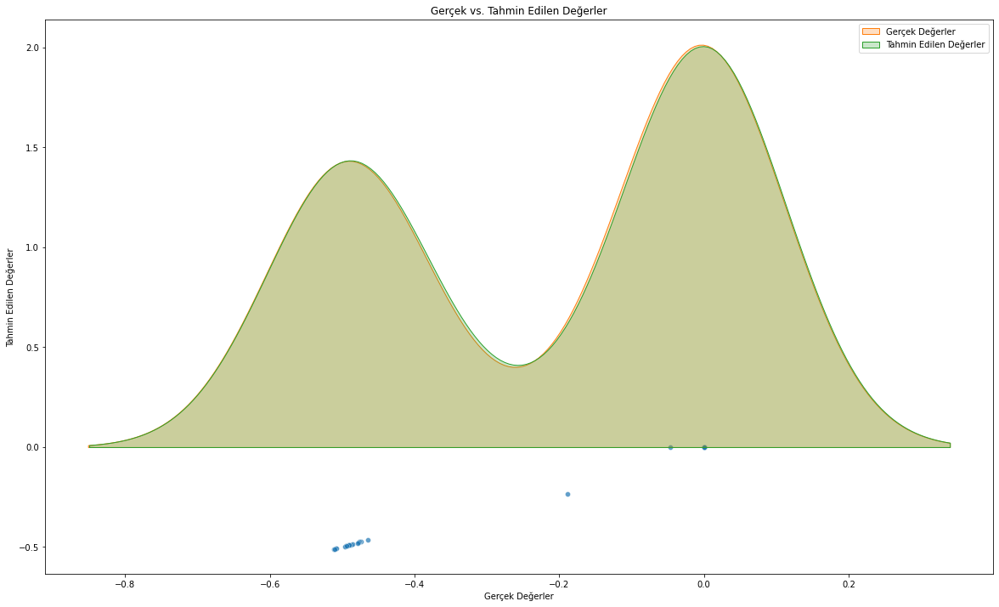

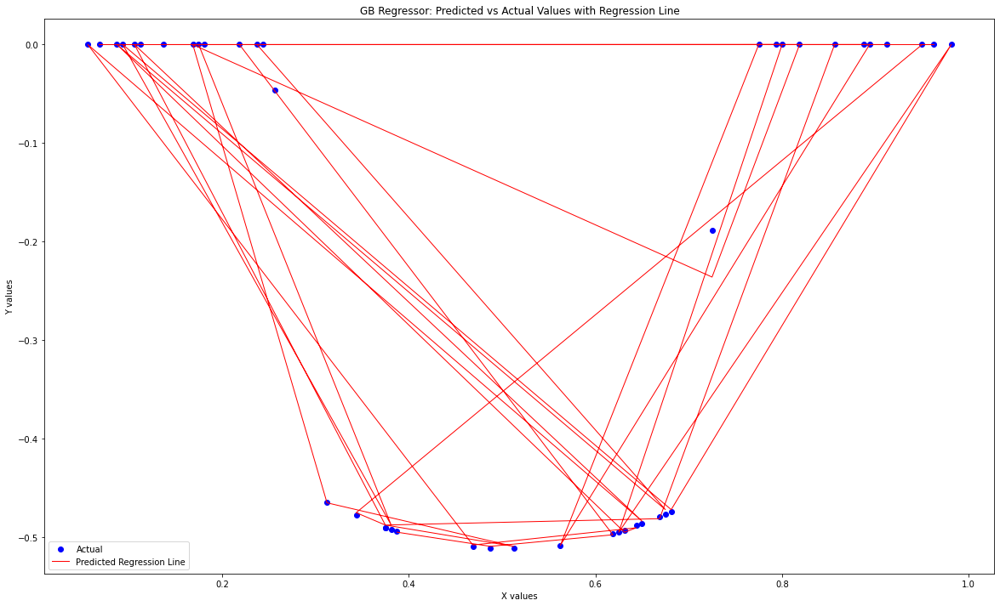

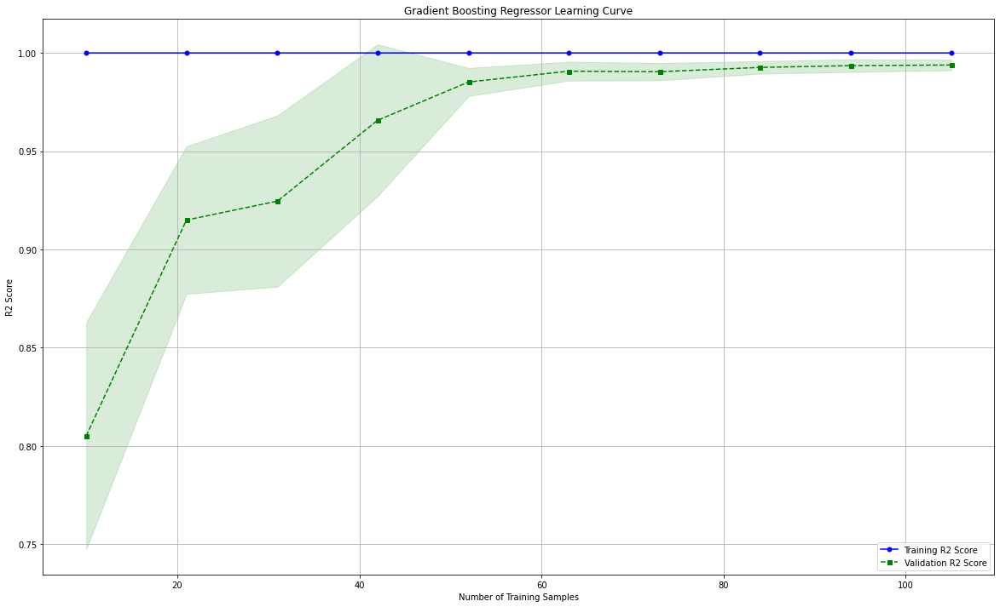

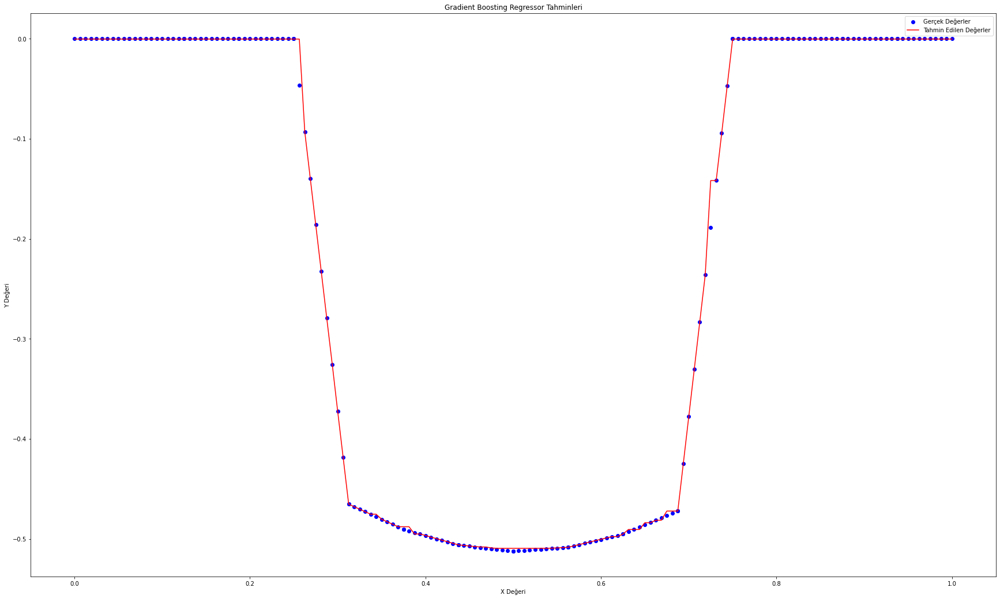

[-0.5]


In [130]:
gb_reg_M18 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_M18.fit(X_train_M18, y_train_M18)

y_pred_M18 = gb_reg_M18.predict(X_test_M18)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M18.reshape(len(y_pred_M18),1), y_test_M18.reshape(len(y_test_M18),1)),1))


print(r2_score(y_test_M18, y_pred_M18))

# Use test and show results of test set
y_hat_M18 = gb_reg_M18.predict(X_M18)
mae = metrics.mean_absolute_error(y_M18,y_hat_M18)
mse = metrics.mean_squared_error(y_M18,y_hat_M18)
mape = np.mean(np.abs((y_M18 - y_hat_M18) / y_M18)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_M18.score(X_M18,y_M18))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M18 = pd.DataFrame({'Gerçek Değerler': y_test_M18, 'Tahmin Edilen Değerler': y_pred_M18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M18 = pd.DataFrame({'Predicted': y_pred_M18, 'Actual': y_test_M18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M18, y_test_M18, color='blue', label='Actual')
plt.plot(X_test_M18, y_pred_M18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_M18, X=X_train_M18, y=y_train_M18, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()



# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M18 = gb_reg_M18.predict(X_values_M18)

# Gerçek değerler için aynı işlemi yap
y_true_values_M18 = gb_reg_M18.predict(X_M18)

plt.figure(figsize=(30, 18))
plt.scatter(X_M18, y_M18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M18, y_pred_values_M18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_M18.predict([[0.43125]]))  #0.43125 ==  -5.045882e-01 gerçek değerde

### SupportVectorRegressor ile deneyelim


[[ 5.29e-02  0.00e+00]
 [-1.80e-01 -4.65e-02]
 [-3.98e-02  0.00e+00]
 [ 2.80e-04  0.00e+00]
 [-4.75e-01 -4.92e-01]
 [ 5.09e-02  0.00e+00]
 [-3.13e-01 -4.74e-01]
 [-2.45e-02  0.00e+00]
 [-4.38e-01 -4.95e-01]
 [-2.82e-02  0.00e+00]
 [ 4.29e-02  0.00e+00]
 [ 4.38e-02  0.00e+00]
 [-1.32e-01  0.00e+00]
 [-3.29e-01 -4.77e-01]
 [ 4.85e-02  0.00e+00]
 [-4.26e-01 -4.93e-01]
 [-4.00e-01 -4.88e-01]
 [-5.59e-01 -5.09e-01]
 [ 2.53e-02  0.00e+00]
 [-3.87e-01 -4.86e-01]
 [ 5.31e-02  0.00e+00]
 [-4.64e-01 -4.90e-01]
 [-4.03e-01 -4.78e-01]
 [ 1.33e-02  0.00e+00]
 [-8.20e-04  0.00e+00]
 [ 4.17e-02  0.00e+00]
 [-3.44e-01 -4.79e-01]
 [-4.64e-01 -4.90e-01]
 [-5.60e-01 -5.11e-01]
 [-3.29e-01 -4.65e-01]
 [ 9.59e-03  0.00e+00]
 [-2.01e-01 -1.89e-01]
 [ 2.39e-03  0.00e+00]
 [-9.86e-03  0.00e+00]
 [ 3.67e-02  0.00e+00]
 [-1.48e-01  0.00e+00]
 [ 5.10e-02  0.00e+00]
 [-7.85e-02  0.00e+00]
 [-5.28e-01 -5.08e-01]
 [ 5.03e-02  0.00e+00]
 [-8.59e-02  0.00e+00]
 [-4.49e-01 -4.96e-01]
 [-5.63e-01 -5.11e-01]
 [-4.85e-01

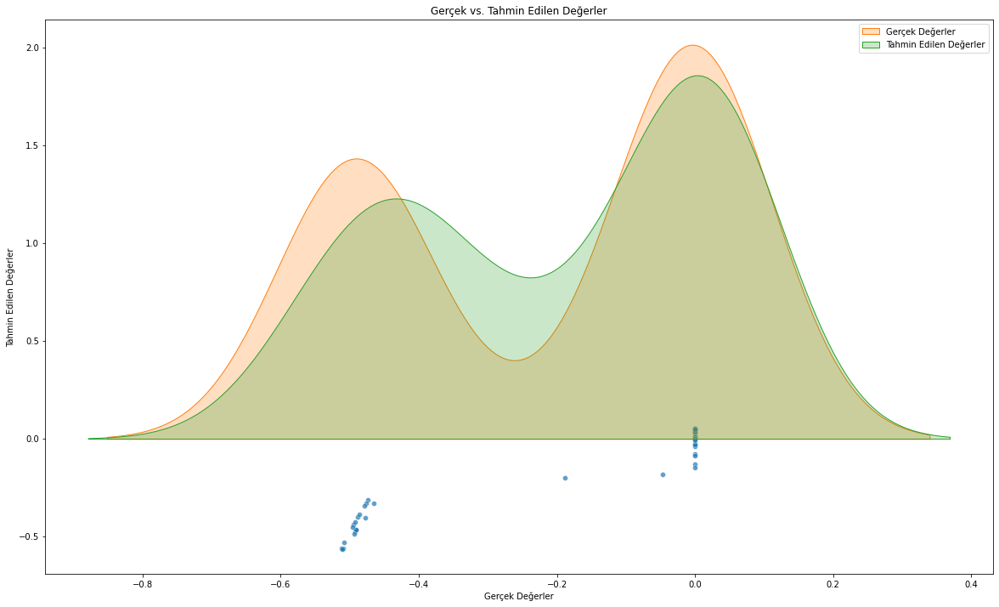

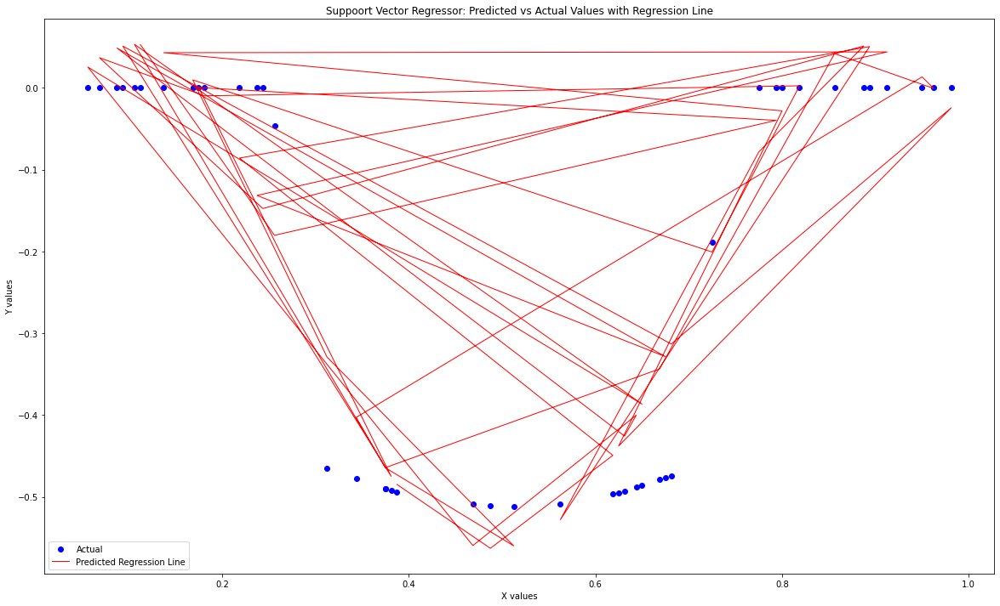

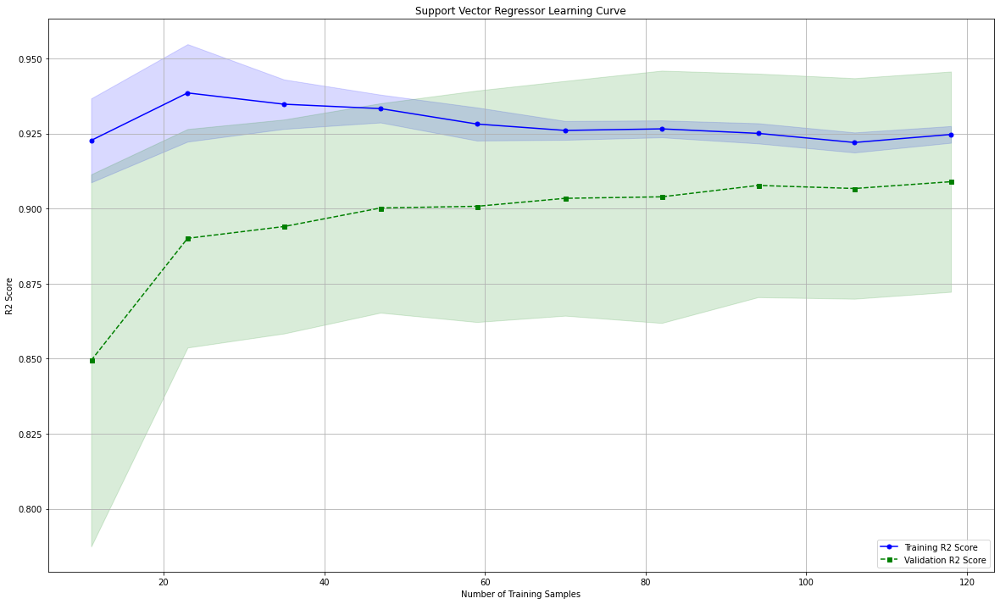

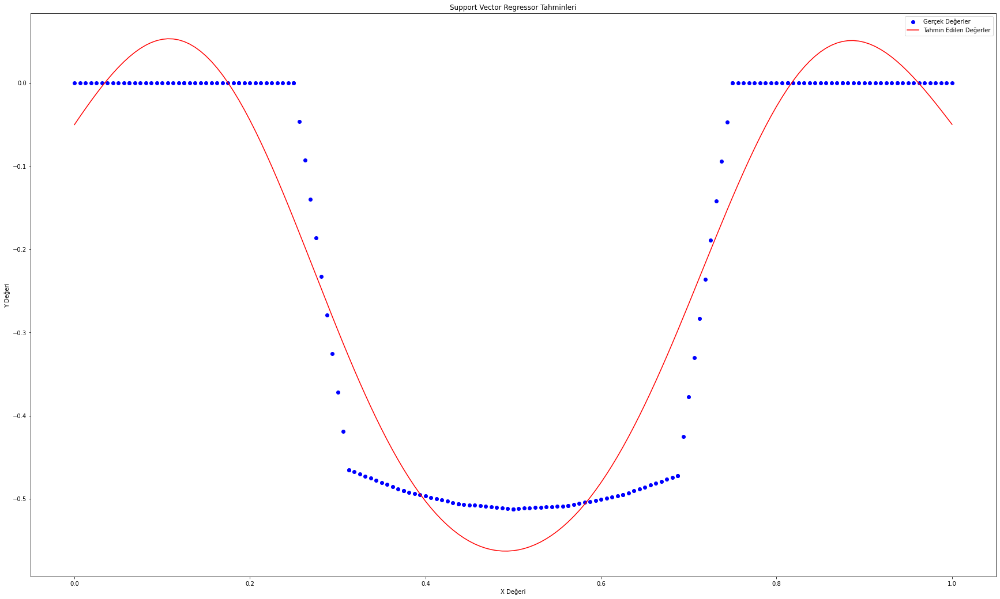

[-0.54]


In [131]:
svr_reg_M18 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_M18.fit(X_train_M18, y_train_M18)

y_pred_M18 = svr_reg_M18.predict(X_test_M18)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_M18.reshape(len(y_pred_M18),1), y_test_M18.reshape(len(y_test_M18),1)),1))


print(r2_score(y_test_M18, y_pred_M18))


# Use test and show results of test set
y_hat_M18 = svr_reg_M18.predict(X_M18)
mae = metrics.mean_absolute_error(y_M18,y_hat_M18)
mse = metrics.mean_squared_error(y_M18,y_hat_M18)
mape = np.mean(np.abs((y_M18 - y_hat_M18) / y_M18)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_M18.score(X_M18,y_M18))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_M18 = pd.DataFrame({'Gerçek Değerler': y_test_M18, 'Tahmin Edilen Değerler': y_pred_M18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_M18 = pd.DataFrame({'Predicted': y_pred_M18, 'Actual': y_test_M18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M18, y_test_M18, color='blue', label='Actual')
plt.plot(X_test_M18, y_pred_M18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_M18, X=X_train_M18, y=y_train_M18, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_M18 = svr_reg_M18.predict(X_values_M18)

# Gerçek değerler için aynı işlemi yap
y_true_values_M18 = svr_reg_M18.predict(X_M18)

plt.figure(figsize=(30, 18))
plt.scatter(X_M18, y_M18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M18, y_pred_values_M18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_M18.predict([[0.43125]]))  #0.43125 ==  -5.045882e-01 gerçek değerde

### PolynomialRegressor ile deneyelim


R2 Score (Polynomial Regression):  0.9102306772503876
MAE (Polynomial Regression):  0.056172015678875774
RMSE (Polynomial Regression):  0.07155086295053573
MAPE (Polynomial Regression):  inf


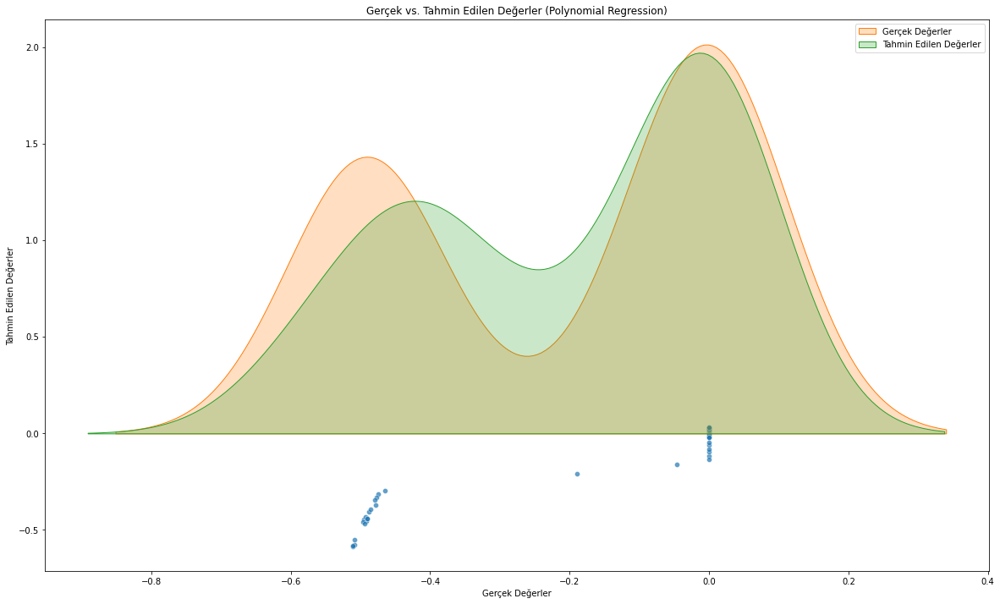

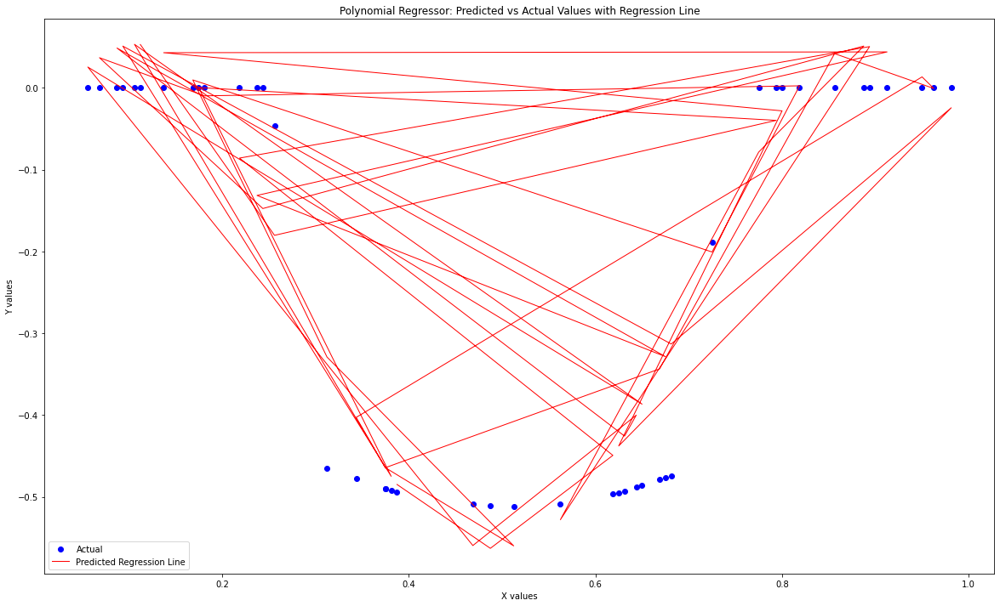

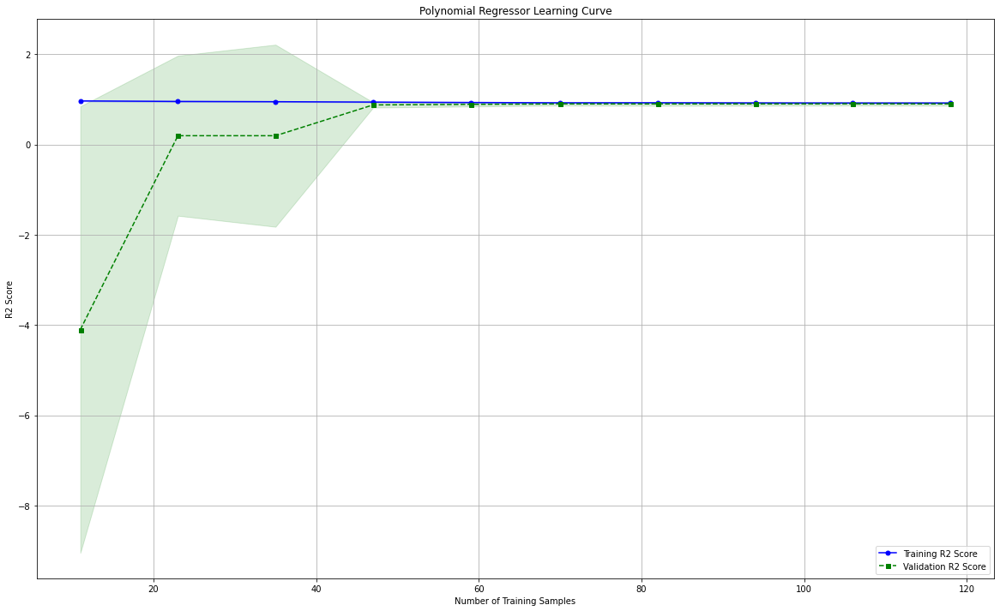

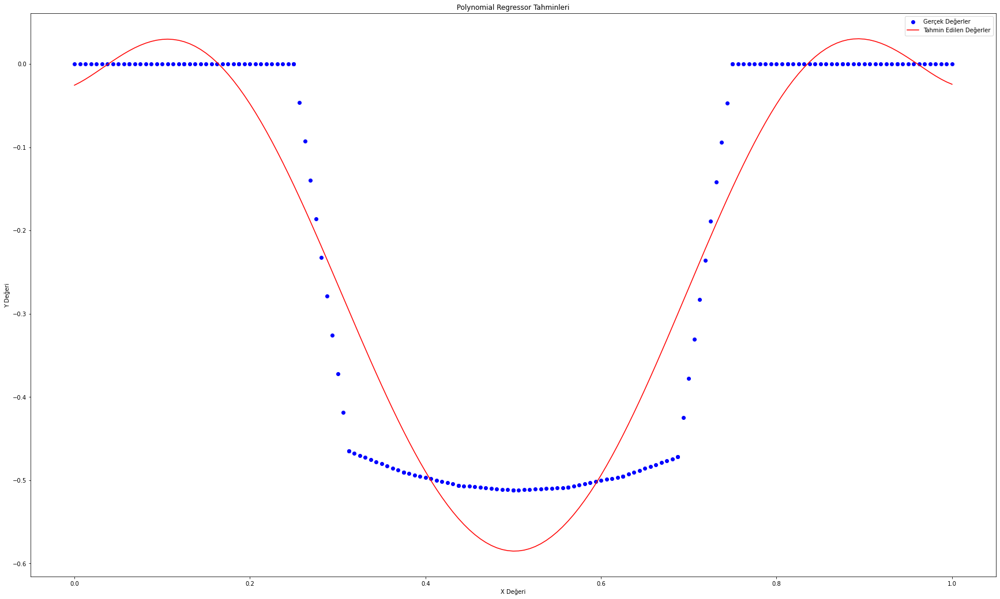

[-0.54]


In [132]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_M18 = PolynomialFeatures(degree=7)
X_poly_M18 = poly_M18.fit_transform(X_M18)

# Lineer Regresyon modeli oluşturma
poly_reg_M18 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_M18.fit(X_M18, y_M18)

# Tahminler yapma
y_pred_poly_M18 = poly_reg_M18.predict(X_test_M18)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_M18, y_pred_poly_M18))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_M18, y_pred_poly_M18))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_M18, y_pred_poly_M18)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_M18 - y_pred_poly_M18) / y_test_M18)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_M18 = pd.DataFrame({'Gerçek Değerler': y_test_M18, 'Tahmin Edilen Değerler': y_pred_poly_M18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_M18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_M18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_M18 = pd.DataFrame({'Predicted': y_pred_M18, 'Actual': y_test_M18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_M18, y_test_M18, color='blue', label='Actual')
plt.plot(X_test_M18, y_pred_M18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_M18, X=X_train_M18, y=y_train_M18, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()



# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_M18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_M18 = poly_reg_M18.predict(X_values_M18)

# Gerçek değerler için aynı işlemi yap
y_true_values_M18 = poly_reg_M18.predict(X_M18)

plt.figure(figsize=(30, 18))
plt.scatter(X_M18, y_M18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_M18, y_pred_values_M18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_M18.predict([[0.43125]]))  #0.43125 ==  -5.045882e-01 gerçek değerde

### Multi-Layer Perceptron


In [109]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_M18, y_train_M18,epochs=100, batch_size=32, validation_split=0.25)

y_pred_M18 = mlp.predict(X_test_M18)

Epoch 1/100
4/4 [==============================] - 1s 41ms/step - loss: 0.0951 - mae: 0.2023 - val_loss: 0.1238 - val_mae: 0.2677
Epoch 2/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0933 - mae: 0.2027 - val_loss: 0.1214 - val_mae: 0.2665
Epoch 3/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0915 - mae: 0.2029 - val_loss: 0.1190 - val_mae: 0.2652
Epoch 4/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0897 - mae: 0.2036 - val_loss: 0.1165 - val_mae: 0.2639
Epoch 5/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0878 - mae: 0.2038 - val_loss: 0.1139 - val_mae: 0.2624
Epoch 6/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0858 - mae: 0.2042 - val_loss: 0.1111 - val_mae: 0.2609
Epoch 7/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0838 - mae: 0.2047 - val_loss: 0.1082 - val_mae: 0.2592
Epoch 8/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0819 - mae: 0.20

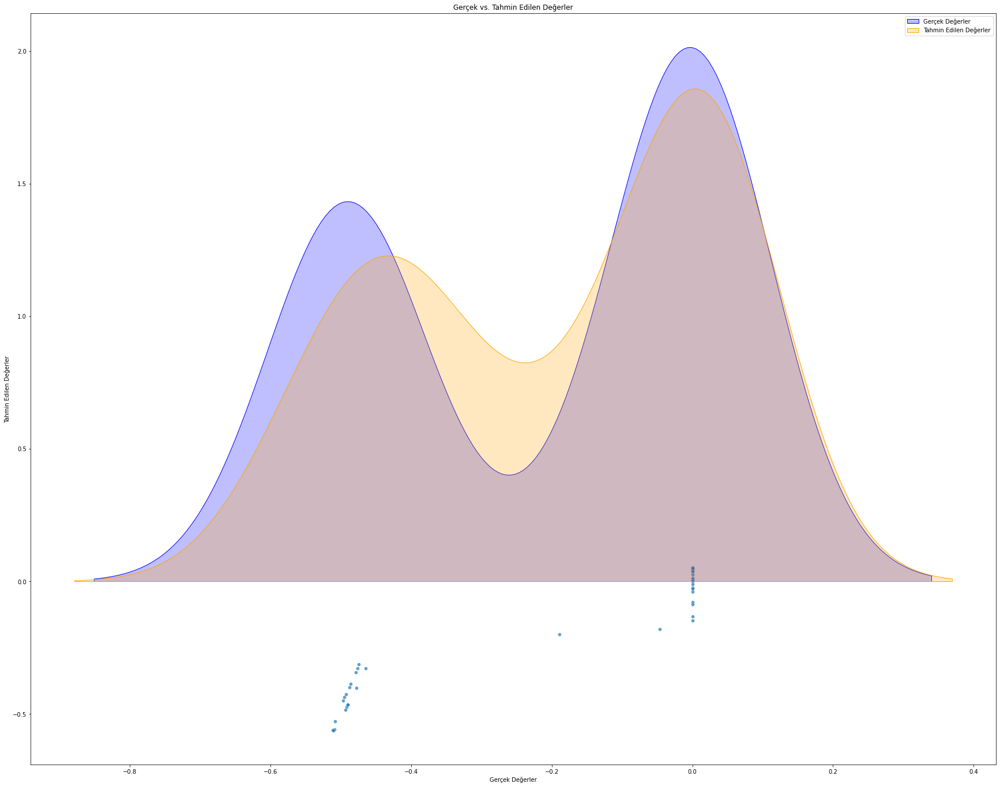

In [133]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_M18 = pd.DataFrame({'Gerçek Değerler': y_test_M18.flatten(), 'Tahmin Edilen Değerler': y_pred_M18.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_M18, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_M18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
4/4 [==============================] - 0s 134ms/step - loss: 0.0534 - mae: 0.2211 - val_loss: 0.0752 - val_mae: 0.2704
Epoch 2/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0534 - mae: 0.2211 - val_loss: 0.0753 - val_mae: 0.2705
Epoch 3/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0534 - mae: 0.2212 - val_loss: 0.0750 - val_mae: 0.2701
Epoch 4/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0534 - mae: 0.2213 - val_loss: 0.0749 - val_mae: 0.2700
Epoch 5/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0534 - mae: 0.2213 - val_loss: 0.0747 - val_mae: 0.2697
Epoch 6/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0534 - mae: 0.2215 - val_loss: 0.0745 - val_mae: 0.2694
Epoch 7/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0534 - mae: 0.2215 - val_loss: 0.0743 - val_mae: 0.2692
Epoch 8/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0534 - mae: 0.2216 - val_

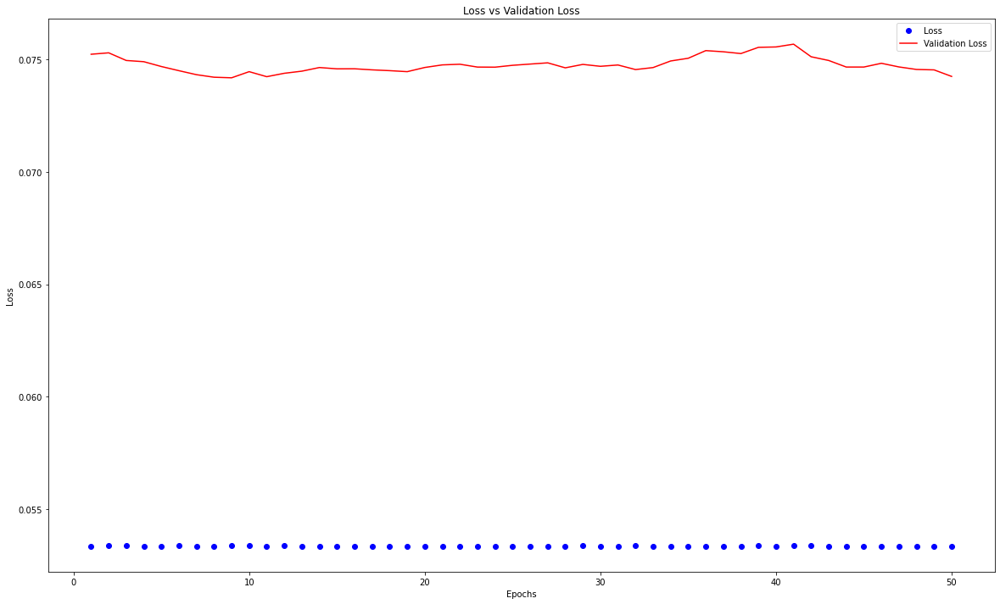

In [134]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_M18, y_train_M18, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


### Tüm modellerin grafiklerinin karşılaştırılması


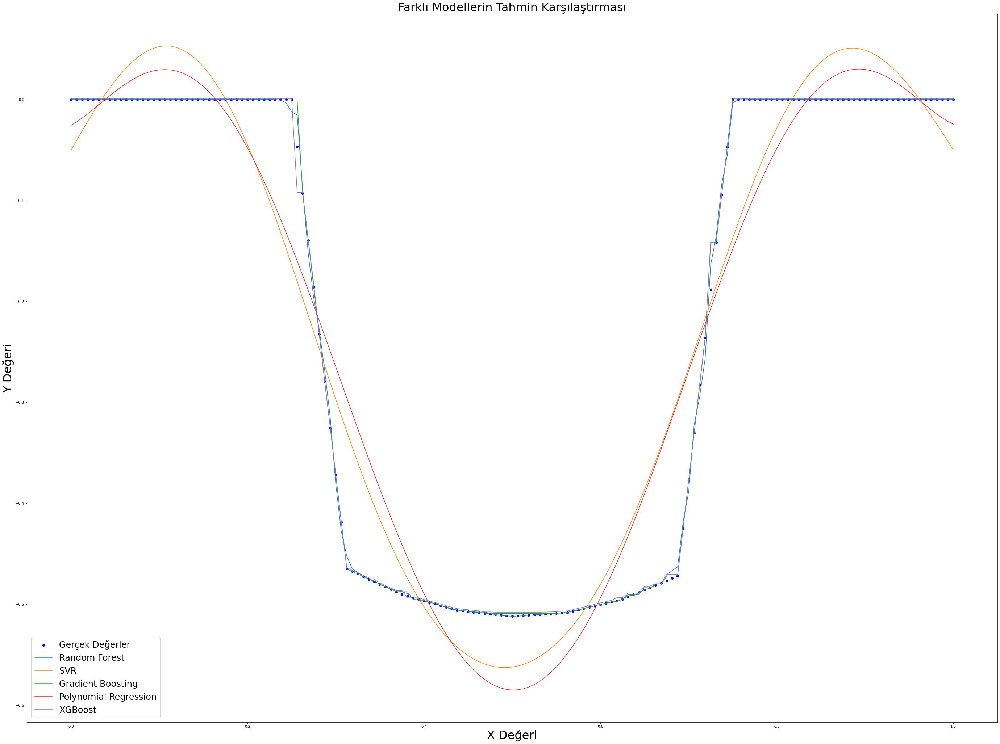

In [135]:
y_pred_rf_M18 = rf_reg_M18.predict(X_values_M18)
y_pred_svr_M18 = svr_reg_M18.predict(X_values_M18)  
y_pred_gb_M18 = gb_reg_M18.predict(X_values_M18)
y_pred_poly_M18 = poly_reg_M18.predict(X_values_M18)
y_pred_xgb_M18 = xgb_M18.predict(X_values_M18)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_M18, y_M18, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_M18, y_pred_rf_M18, label='Random Forest')
plt.plot(X_values_M18, y_pred_svr_M18, label='SVR')
plt.plot(X_values_M18, y_pred_gb_M18, label='Gradient Boosting')
plt.plot(X_values_M18, y_pred_poly_M18, label='Polynomial Regression')
plt.plot(X_values_M18, y_pred_xgb_M18, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

# Her M değeri için en iyi sonuçları veren modellerin grafiklerinin bir arada toplanması:

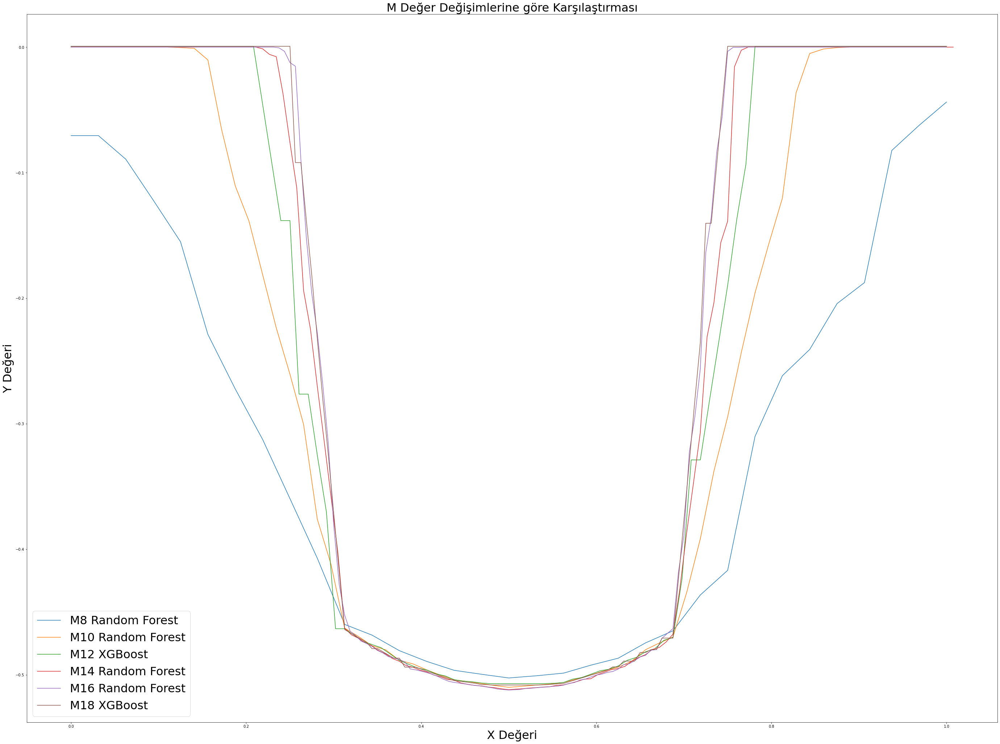

In [136]:
y_pred_rf_M8 = rf_reg_M8.predict(X_values_M8) 
y_pred_rf_M10 = rf_reg_M10.predict(X_values_M10)
y_pred_xgb_M12 = xgb_M12.predict(X_values_M12)
y_pred_rf_M14 = rf_reg_M14.predict(X_values_M14)
y_pred_rf_M16 = rf_reg_M16.predict(X_values_M16)
y_pred_xgb_M18 = xgb_M18.predict(X_values_M18)

plt.figure(figsize=(48, 36))
# Gerçek değerler
#plt.scatter(X_M8, y_M8, color='blue', label='Gerçek Değerler') #gerçek değerleri şimdilik kullanmayalım

# Modellerin tahminleri
plt.plot(X_values_M8, y_pred_rf_M8, label='M8 Random Forest')
plt.plot(X_values_M10, y_pred_rf_M10, label='M10 Random Forest')
plt.plot(X_values_M12, y_pred_xgb_M12, label='M12 XGBoost')
plt.plot(X_values_M14, y_pred_rf_M14, label='M14 Random Forest')
plt.plot(X_values_M16, y_pred_rf_M16, label='M16 Random Forest')
plt.plot(X_values_M18, y_pred_xgb_M18, label='M18 XGBoost')
# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('M Değer Değişimlerine göre Karşılaştırması',fontsize=32)
plt.legend(fontsize=32)
plt.show()